In [1]:
from keras.models import Sequential, Model
from keras.layers import LSTM, Dense, Dropout, BatchNormalization
from keras.layers import Conv1D, MaxPooling1D, Activation, Flatten, concatenate, Input, Add
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
import numpy as np
import h5py
import matplotlib.pyplot as plt
from sklearn import preprocessing
import keras
from matplotlib import pyplot as plt

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# load EEG data

In [2]:
import os
import scipy.io as sio 
# from natsort import natsorted
# load eog data
# eeg_path = r'/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data/'
eeg_path = r'/kaggle/input/5s-withwithout-ss-upsample-slidingwin-aug-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_augmented_raw_data/'
excerpt_eeg = os.listdir(eeg_path)
excerpt_eeg = sorted(excerpt_eeg)

#Subjects data start_index & end_index mark
subjects_data_index_mark = np.zeros((len(excerpt_eeg),2), dtype='int')
subject_count = 0
index = 0
data_count = 0

print(excerpt_eeg)
subjects_data_index_mark[subject_count, 0] = index
# f = sio.loadmat('/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data/' + excerpt_eeg[0])
f = sio.loadmat('/kaggle/input/5s-withwithout-ss-upsample-slidingwin-aug-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_augmented_raw_data/' + excerpt_eeg[0])
data = f['EEG']
data_count = data.shape[1]
# c,r = data.shape
# train_c = (c//10)*8
# label_c = c - train_c
# subject_partition_train_eeg = data[0:train_c,:]
# subject_partition_valid_eeg = data[train_c:,:]
eeg = data
subjects_data_index_mark[subject_count, 1] = index + data_count
index = index + data_count
subject_count += 1
# print('train: ',subject_partition_train_eeg.shape)
# print('valid: ',subject_partition_valid_eeg.shape)
print('eeg ',eeg.shape)

for name in excerpt_eeg[1:]:
    subjects_data_index_mark[subject_count, 0] = index
#     f = sio.loadmat('/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data/' + name)
    f = sio.loadmat('/kaggle/input/5s-withwithout-ss-upsample-slidingwin-aug-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_augmented_raw_data/' + name)
    #print(f)
    data = f['EEG']
    data_count = data.shape[1]
    # data1 = f['EOG1']
    #print(data.shape)
    # c,r = data1.shape
    # train_c = (c//10)*8
    # label_c = c - train_c
    # train_data1 = data1[0:train_c,:]
    # valid_data1 = data1[train_c:,:]
    # subject_partition_train_eog1 = np.append(subject_partition_train_eog1, train_data1, axis=0)
    # subject_partition_valid_eog1 = np.append(subject_partition_valid_eog1, valid_data1, axis=0)
    eeg = np.append(eeg, data, axis=1) #whole
    subjects_data_index_mark[subject_count, 1] = index + data_count
    index = index + data_count
    subject_count += 1
    # print('train: ',subject_partition_train_eog1.shape)
    # print('valid: ',subject_partition_valid_eog1.shape)
    print('eeg',eeg.shape)
eeg = np.transpose(eeg)
print('eeg',eeg.shape)
print(subjects_data_index_mark)


['excerpt1.mat', 'excerpt2.mat', 'excerpt3.mat', 'excerpt4.mat', 'excerpt5.mat', 'excerpt6.mat', 'excerpt7.mat', 'excerpt8.mat']
eeg  (1000, 776)
eeg (1000, 1608)
eeg (1000, 2008)
eeg (1000, 2720)
eeg (1000, 3528)
eeg (1000, 4456)
eeg (1000, 4960)
eeg (1000, 5704)
eeg (5704, 1000)
[[   0  776]
 [ 776 1608]
 [1608 2008]
 [2008 2720]
 [2720 3528]
 [3528 4456]
 [4456 4960]
 [4960 5704]]


In [3]:
# load label
# label_path = r'/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data_label_1/'
label_path = r'/kaggle/input/5s-withwithout-ss-upsample-slidingwin-aug-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_augmented_raw_data_label_1/'
excerpt_txt = os.listdir(label_path)
excerpt_txt = sorted(excerpt_txt)
print(excerpt_txt) 
# f = open('/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data_label_1/' + excerpt_txt[0], 'r')
f = open('/kaggle/input/5s-withwithout-ss-upsample-slidingwin-aug-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_augmented_raw_data_label_1/' + excerpt_txt[0], 'r')
txt = f.read().splitlines()
f.close()
arr = np.array(txt[:])
# c, = arr.shape
# train_c = (c//10)*8
# valid_c = c - train_c
# subject_partition_train_label = arr[0:train_c]
# subject_partition_valid_label = arr[train_c:]
label = arr
# print('train: ',subject_partition_train_label.shape)
# print('valid: ',subject_partition_valid_label.shape)
print('label',label.shape)


for name in excerpt_txt[1:]:
#   f = open('/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data_label_1/' + name, 'r')
  f = open('/kaggle/input/5s-withwithout-ss-upsample-slidingwin-aug-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_augmented_raw_data_label_1/' + name, 'r')
  txt = f.read().splitlines()
  f.close()
  arr = np.array(txt[:])
  # c, = arr.shape
  # train_c = (c//10)*8
  # valid_c = c - train_c
  # subject_partition_train_label = np.append(subject_partition_train_label, arr[0:train_c])
  # subject_partition_valid_label = np.append(subject_partition_valid_label, arr[train_c:])
  label = np.append(label, arr) 
  # print('train: ',subject_partition_train_label.shape)
  # print('valid: ',subject_partition_valid_label.shape)
  print('label',label.shape)


['excerpt1.txt', 'excerpt2.txt', 'excerpt3.txt', 'excerpt4.txt', 'excerpt5.txt', 'excerpt6.txt', 'excerpt7.txt', 'excerpt8.txt']
label (776,)
label (1608,)
label (2008,)
label (2720,)
label (3528,)
label (4456,)
label (4960,)
label (5704,)


# Preprocess

In [4]:
labels_int = label.astype(np.int)
print(label)
print(labels_int)

['0' '0' '0' ... '1' '1' '1']
[0 0 0 ... 1 1 1]


/tmp/ipykernel_28/608230778.py:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  labels_int = label.astype(np.int)


In [5]:
# Expand the dimension
eeg = np.expand_dims(eeg, axis=2)
print(eeg.shape)

(5704, 1000, 1)


In [6]:
# shuffle DREAMS data

from sklearn.utils import shuffle
print(labels_int[:30])
# print(stage2_labels_int[:30])
eeg,labels_int= shuffle(eeg, labels_int, random_state=0)
# randomize = np.arange(len(labels_int))
# np.random.shuffle(randomize)
# x = x[randomize]
# y = y[randomize]
print(labels_int[:30])
# print(stage2_labels_int[:30])

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[1 1 0 1 0 0 0 1 0 0 0 0 1 1 1 1 0 1 0 1 0 0 1 1 0 1 1 1 1 0]


In [8]:
# DREAMS data(stage1,2)/label(stage1) whole partition(train:valid:test = 0.8:0.1:0.1)
train_amount = int(eeg.shape[0] * 80/100)
valid_amount = int(eeg.shape[0] * 10/100)
test_amount = int(eeg.shape[0] * 10/100)
train_data = eeg[0:train_amount,:,:]
train_labels = labels_int[0:train_amount]
valid_data = eeg[train_amount:train_amount + valid_amount,:,:]
valid_labels = labels_int[train_amount:train_amount + valid_amount]
test_data = eeg[train_amount + valid_amount:,:,:]
test_labels = labels_int[train_amount + valid_amount:]

In [9]:
# preprocess eeg (Z-score standardization)
print(train_data.max())
print(train_data.min())

print(valid_data.max())
print(valid_data.min())

print(test_data.max())
print(test_data.min())

print(train_data.shape)
mean_value = train_data.mean()
std_value = train_data.std()
print(mean_value)
print(std_value)
print(train_data.shape)
for i in range(train_data.shape[0]):
    train_data[i,:,:] = (train_data[i,:,:]-mean_value) / std_value
            
# mean_value = valid_data.mean()
# std_value = valid_data.std()
# print(mean_value)
# print(std_value)
for i in range(valid_data.shape[0]):
    valid_data[i,:,:] = (valid_data[i,:,:]-mean_value) / std_value
            
# mean_value = test_data.mean()
# std_value = test_data.std()
# print(mean_value)
# print(std_value)           
for i in range(test_data.shape[0]):
    test_data[i,:,:] = (test_data[i,:,:]-mean_value) / std_value
            
print(train_data.max())
print(train_data.min())

print(valid_data.max())
print(valid_data.min())

print(test_data.max())
print(test_data.min())

348.03965656399896
-362.75430069411436
312.0940307854427
-309.8406230767039
315.489124804749
-334.543212947455
(4563, 1000, 1)
0.027796233719364807
19.917332498390017
(4563, 1000, 1)
17.472814713436676
-18.214391759396424
15.668073753197056
-15.55772688614155
15.838533026273945
-16.797982822660554


# 10-fold cross validation

In [24]:
#10 fold cross validation
from sklearn.model_selection import KFold
import numpy as np

# Define per-fold score containers
acc_per_fold = []
loss_per_fold = []

# Merge inputs and targets
inputs = np.concatenate((train_data, valid_data), axis=0)
targets = np.concatenate((train_labels, valid_labels), axis=0)


# loss_function = sparse_categorical_crossentropy
# no_epochs = 25
# optimizer = Adam()
# # verbosity = 1
num_folds = 10

# Define the K-fold Cross Validator
kfold = KFold(n_splits=num_folds, shuffle=True)

from keras import regularizers
num_classes = 2
epochs = 300
batch_size = 128
timesteps = 1000
data_dim = 1
input_shape = (timesteps, data_dim)

# K-fold Cross Validation model evaluation

def ten_folds_cross_validation():
    fold_no = 1
    for train, test in kfold.split(inputs, targets):
      # Define the model architecture
        model = Sequential()
        model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', input_shape=input_shape))
        model.add(BatchNormalization())
        model.add(MaxPooling1D(pool_size=5, strides=1))
        # model.add(Dropout(0.5))
        model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(MaxPooling1D(pool_size=5, strides=1))
        # model.add(Dropout(0.5))
        model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(MaxPooling1D(pool_size=5, strides=1))
        # model.add(Dropout(0.5))
        model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(MaxPooling1D(pool_size=5, strides=1))
        # model.add(Dropout(0.5))
        model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(MaxPooling1D(pool_size=5, strides=1))
        # model.add(LSTM(100, return_sequences=True, stateful=False))
        model.add(Flatten())
        model.add(Dropout(0.5))
        # model.add(Dense(100,activation='relu',kernel_regularizer=regularizers.l2(l=0.001)))  
        # ##lambda為正規化需要設定的超參數，若太小會導致懲罰項無用，若太大則會影響模型收斂的情形
        # model.add(Dropout(0.5))  # p會決定每個神經網路是否關閉的機率
        # # 使用L1正規化
        # model.add(Dense(50,activation='relu'))
        model.add(Dense(num_classes, activation='softmax'))

        # Compile model
    #     model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), optimizer='adam', metrics=['accuracy'])
        model.compile(tf.keras.optimizers.SGD(0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])


#         # Generate a print
#         print('------------------------------------------------------------------------')
#         print(f'Training for fold {fold_no} ...')

#         # Fit data to model
        history = model.fit(inputs[train], targets[train],
                      batch_size=batch_size,
                      epochs=epochs)
    # Increase fold number
        fold_no = fold_no + 1

In [25]:
# Calculating the time consuming
import timeit

print(timeit.timeit(ten_folds_cross_validation, number=1))

Epoch 1/300
37/37 [==============================] - 3s 15ms/step - loss: 1.2289 - accuracy: 0.5109
Epoch 2/300
37/37 [==============================] - 0s 11ms/step - loss: 1.0139 - accuracy: 0.5291
Epoch 3/300
37/37 [==============================] - 0s 10ms/step - loss: 0.9171 - accuracy: 0.5722
Epoch 4/300
37/37 [==============================] - 0s 10ms/step - loss: 0.8367 - accuracy: 0.5897
Epoch 5/300
37/37 [==============================] - 0s 11ms/step - loss: 0.7649 - accuracy: 0.6168
Epoch 6/300
37/37 [==============================] - 0s 11ms/step - loss: 0.7033 - accuracy: 0.6356
Epoch 7/300
37/37 [==============================] - 0s 11ms/step - loss: 0.6759 - accuracy: 0.6582
Epoch 8/300
37/37 [==============================] - 0s 11ms/step - loss: 0.6523 - accuracy: 0.6735
Epoch 9/300
37/37 [==============================] - 0s 11ms/step - loss: 0.6219 - accuracy: 0.6850
Epoch 10/300
37/37 [==============================] - 0s 11ms/step - loss: 0.6324 - accuracy: 0.6740

In [12]:
# 1 prediction
def one_prediction():
    y_predict = model.predict(test_data, batch_size=None, verbose=0, steps=None)

In [15]:
# 1 prediction time
import timeit

print(timeit.timeit(one_prediction, number=100))

11.13978957900008


------------------------------------------------------------------------
Training for fold 1 ...
Epoch 1/400
37/37 [==============================] - 12s 16ms/step - loss: 1.3716 - accuracy: 0.5135
Epoch 2/400
37/37 [==============================] - 0s 9ms/step - loss: 1.2101 - accuracy: 0.5311
Epoch 3/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1204 - accuracy: 0.5423
Epoch 4/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0642 - accuracy: 0.5506
Epoch 5/400
37/37 [==============================] - 0s 8ms/step - loss: 1.0032 - accuracy: 0.5588
Epoch 6/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9766 - accuracy: 0.5761
Epoch 7/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9668 - accuracy: 0.5744
Epoch 8/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9390 - accuracy: 0.5878
Epoch 9/400
37/37 [==============================] - 0s 9ms/step - loss: 0.8979 - accuracy: 0.5913
Epoch 10/4

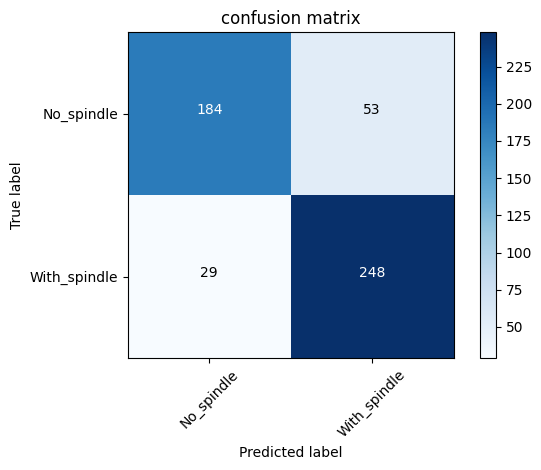

Score for fold 1: loss of 0.42446738481521606; accuracy of 84.04669165611267%
------------------------------------------------------------------------
Training for fold 2 ...
Epoch 1/400
37/37 [==============================] - 3s 10ms/step - loss: 1.4530 - accuracy: 0.5257
Epoch 2/400
37/37 [==============================] - 0s 9ms/step - loss: 1.2721 - accuracy: 0.5503
Epoch 3/400
37/37 [==============================] - 0s 8ms/step - loss: 1.1281 - accuracy: 0.5750
Epoch 4/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0864 - accuracy: 0.5850
Epoch 5/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9980 - accuracy: 0.6081
Epoch 6/400
37/37 [==============================] - 0s 8ms/step - loss: 0.9274 - accuracy: 0.6174
Epoch 7/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9035 - accuracy: 0.6213
Epoch 8/400
37/37 [==============================] - 0s 10ms/step - loss: 0.8668 - accuracy: 0.6328
Epoch 9/400
37/37 [============

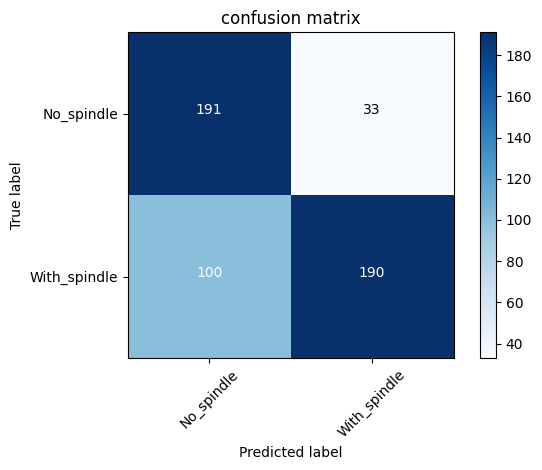

Score for fold 2: loss of 0.5207439064979553; accuracy of 74.12451505661011%
------------------------------------------------------------------------
Training for fold 3 ...
Epoch 1/400
37/37 [==============================] - 3s 10ms/step - loss: 1.4406 - accuracy: 0.5168
Epoch 2/400
37/37 [==============================] - 0s 8ms/step - loss: 1.3259 - accuracy: 0.5263
Epoch 3/400
37/37 [==============================] - 0s 9ms/step - loss: 1.2366 - accuracy: 0.5341
Epoch 4/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1370 - accuracy: 0.5506
Epoch 5/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0853 - accuracy: 0.5438
Epoch 6/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0377 - accuracy: 0.5609
Epoch 7/400
37/37 [==============================] - 0s 10ms/step - loss: 0.9957 - accuracy: 0.5635
Epoch 8/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9737 - accuracy: 0.5640
Epoch 9/400
37/37 [=============

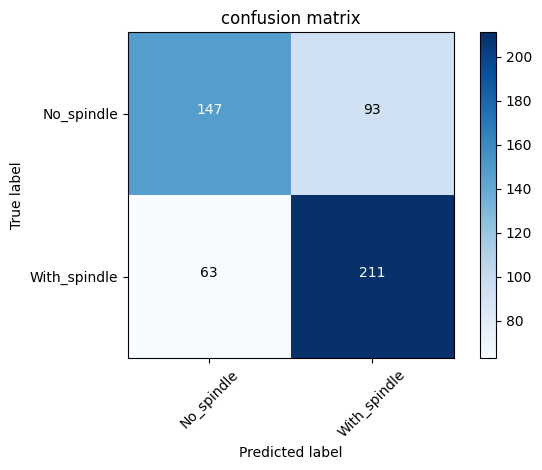

Score for fold 3: loss of 0.6549584865570068; accuracy of 69.64980363845825%
------------------------------------------------------------------------
Training for fold 4 ...
Epoch 1/400
37/37 [==============================] - 3s 14ms/step - loss: 1.3332 - accuracy: 0.5006
Epoch 2/400
37/37 [==============================] - 0s 8ms/step - loss: 1.2104 - accuracy: 0.5190
Epoch 3/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1393 - accuracy: 0.5149
Epoch 4/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0936 - accuracy: 0.5305
Epoch 5/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0028 - accuracy: 0.5452
Epoch 6/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0043 - accuracy: 0.5229
Epoch 7/400
37/37 [==============================] - 0s 10ms/step - loss: 0.9766 - accuracy: 0.5396
Epoch 8/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9562 - accuracy: 0.5396
Epoch 9/400
37/37 [=============

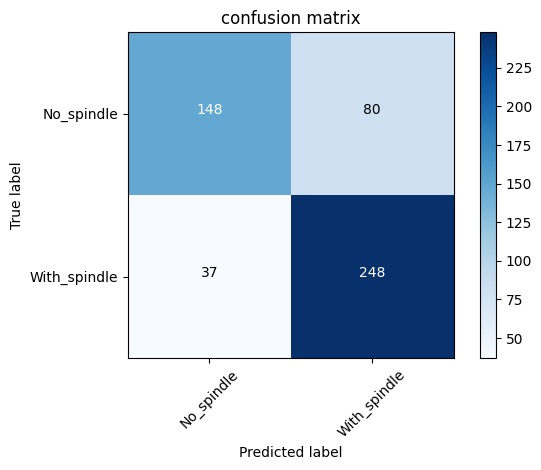

Score for fold 4: loss of 0.5002901554107666; accuracy of 77.19298005104065%
------------------------------------------------------------------------
Training for fold 5 ...
Epoch 1/400
37/37 [==============================] - 3s 10ms/step - loss: 1.4441 - accuracy: 0.5197
Epoch 2/400
37/37 [==============================] - 0s 9ms/step - loss: 1.2986 - accuracy: 0.5403
Epoch 3/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1608 - accuracy: 0.5548
Epoch 4/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1322 - accuracy: 0.5500
Epoch 5/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1013 - accuracy: 0.5500
Epoch 6/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0324 - accuracy: 0.5623
Epoch 7/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0198 - accuracy: 0.5729
Epoch 8/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9516 - accuracy: 0.5784
Epoch 9/400
37/37 [==============

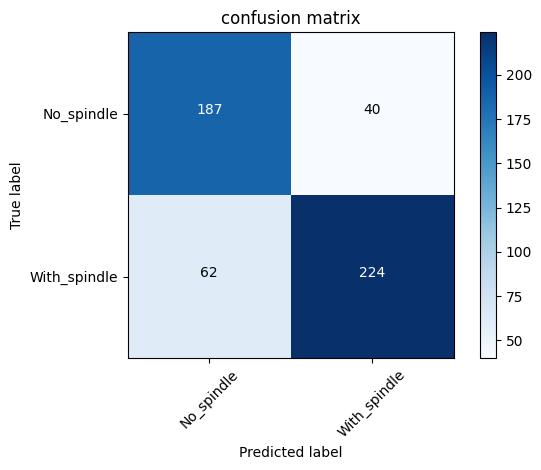

Score for fold 5: loss of 0.45036962628364563; accuracy of 80.11695742607117%
------------------------------------------------------------------------
Training for fold 6 ...
Epoch 1/400
37/37 [==============================] - 3s 10ms/step - loss: 1.3238 - accuracy: 0.5346
Epoch 2/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1917 - accuracy: 0.5578
Epoch 3/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0979 - accuracy: 0.5660
Epoch 4/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0479 - accuracy: 0.5777
Epoch 5/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0240 - accuracy: 0.5762
Epoch 6/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0096 - accuracy: 0.5760
Epoch 7/400
37/37 [==============================] - 0s 8ms/step - loss: 0.9827 - accuracy: 0.5931
Epoch 8/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9440 - accuracy: 0.5868
Epoch 9/400
37/37 [=============

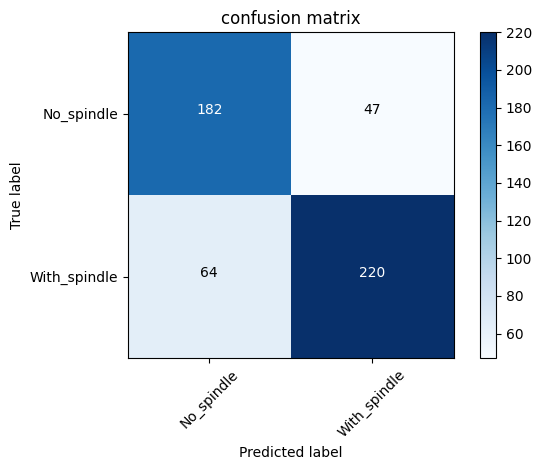

Score for fold 6: loss of 0.5094231963157654; accuracy of 78.36257219314575%
------------------------------------------------------------------------
Training for fold 7 ...
Epoch 1/400
37/37 [==============================] - 3s 10ms/step - loss: 1.4631 - accuracy: 0.5160
Epoch 2/400
37/37 [==============================] - 0s 8ms/step - loss: 1.2510 - accuracy: 0.5312
Epoch 3/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1092 - accuracy: 0.5673
Epoch 4/400
37/37 [==============================] - 0s 8ms/step - loss: 1.0500 - accuracy: 0.5833
Epoch 5/400
37/37 [==============================] - 0s 8ms/step - loss: 0.9754 - accuracy: 0.5894
Epoch 6/400
37/37 [==============================] - 0s 8ms/step - loss: 0.9589 - accuracy: 0.5983
Epoch 7/400
37/37 [==============================] - 0s 8ms/step - loss: 0.9154 - accuracy: 0.6141
Epoch 8/400
37/37 [==============================] - 0s 8ms/step - loss: 0.9043 - accuracy: 0.6212
Epoch 9/400
37/37 [==============

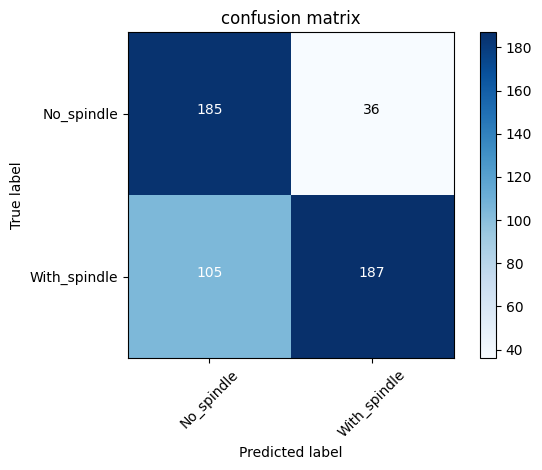

Score for fold 7: loss of 0.5966556072235107; accuracy of 72.51461744308472%
------------------------------------------------------------------------
Training for fold 8 ...
Epoch 1/400
37/37 [==============================] - 3s 10ms/step - loss: 1.3277 - accuracy: 0.5331
Epoch 2/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1324 - accuracy: 0.5695
Epoch 3/400
37/37 [==============================] - 0s 8ms/step - loss: 1.0631 - accuracy: 0.5948
Epoch 4/400
37/37 [==============================] - 0s 8ms/step - loss: 1.0078 - accuracy: 0.5937
Epoch 5/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9747 - accuracy: 0.6037
Epoch 6/400
37/37 [==============================] - 0s 8ms/step - loss: 0.9508 - accuracy: 0.5987
Epoch 7/400
37/37 [==============================] - 0s 8ms/step - loss: 0.9144 - accuracy: 0.6095
Epoch 8/400
37/37 [==============================] - 0s 9ms/step - loss: 0.8930 - accuracy: 0.6154
Epoch 9/400
37/37 [==============

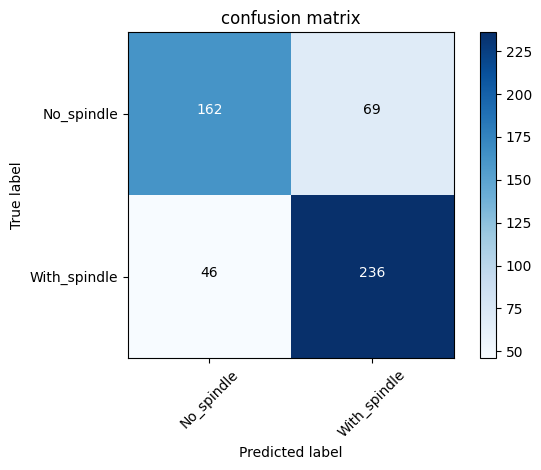

Score for fold 8: loss of 0.4935340881347656; accuracy of 77.582848072052%
------------------------------------------------------------------------
Training for fold 9 ...
Epoch 1/400
37/37 [==============================] - 3s 11ms/step - loss: 1.4247 - accuracy: 0.5019
Epoch 2/400
37/37 [==============================] - 0s 9ms/step - loss: 1.2456 - accuracy: 0.5286
Epoch 3/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1607 - accuracy: 0.5461
Epoch 4/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0904 - accuracy: 0.5584
Epoch 5/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0784 - accuracy: 0.5619
Epoch 6/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9825 - accuracy: 0.5838
Epoch 7/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9697 - accuracy: 0.5892
Epoch 8/400
37/37 [==============================] - 0s 9ms/step - loss: 0.9050 - accuracy: 0.6019
Epoch 9/400
37/37 [================

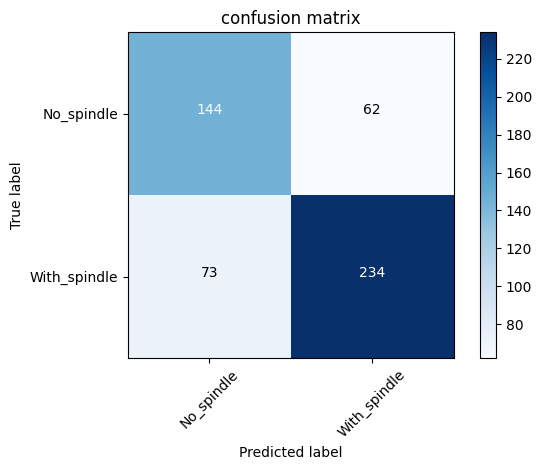

Score for fold 9: loss of 0.5606971383094788; accuracy of 73.68420958518982%
------------------------------------------------------------------------
Training for fold 10 ...
Epoch 1/400
37/37 [==============================] - 3s 9ms/step - loss: 1.2993 - accuracy: 0.5113
Epoch 2/400
37/37 [==============================] - 0s 9ms/step - loss: 1.2179 - accuracy: 0.5238
Epoch 3/400
37/37 [==============================] - 0s 9ms/step - loss: 1.1290 - accuracy: 0.5452
Epoch 4/400
37/37 [==============================] - 0s 9ms/step - loss: 1.0511 - accuracy: 0.5489
Epoch 5/400
37/37 [==============================] - 0s 11ms/step - loss: 1.0228 - accuracy: 0.5677
Epoch 6/400
37/37 [==============================] - 0s 13ms/step - loss: 1.0061 - accuracy: 0.5617
Epoch 7/400
37/37 [==============================] - 0s 13ms/step - loss: 1.0210 - accuracy: 0.5554
Epoch 8/400
37/37 [==============================] - 0s 12ms/step - loss: 0.9712 - accuracy: 0.5690
Epoch 9/400
37/37 [==========

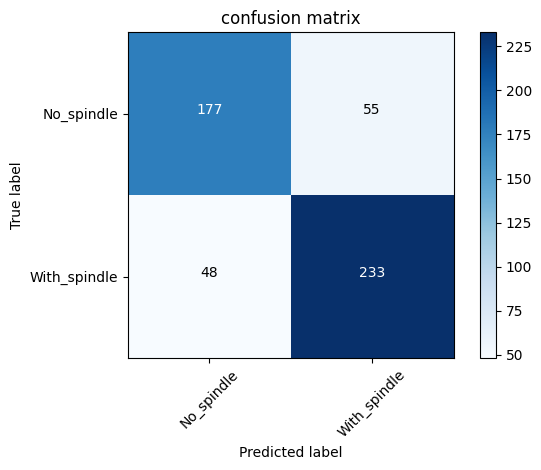

Score for fold 10: loss of 0.5733026266098022; accuracy of 79.92202639579773%
------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 0.42446738481521606 - Accuracy: 84.04669165611267%
------------------------------------------------------------------------
> Fold 2 - Loss: 0.5207439064979553 - Accuracy: 74.12451505661011%
------------------------------------------------------------------------
> Fold 3 - Loss: 0.6549584865570068 - Accuracy: 69.64980363845825%
------------------------------------------------------------------------
> Fold 4 - Loss: 0.5002901554107666 - Accuracy: 77.19298005104065%
------------------------------------------------------------------------
> Fold 5 - Loss: 0.45036962628364563 - Accuracy: 80.11695742607117%
------------------------------------------------------------------------
> Fold 6 - Loss: 0.5094231963157654 - Accuracy: 78.36257219

In [20]:
#10 fold cross validation
from sklearn.model_selection import KFold
import numpy as np

# Define per-fold score containers
acc_per_fold = []
loss_per_fold = []

# Merge inputs and targets
inputs = np.concatenate((train_data, valid_data), axis=0)
targets = np.concatenate((train_labels, valid_labels), axis=0)


# loss_function = sparse_categorical_crossentropy
# no_epochs = 25
# optimizer = Adam()
# # verbosity = 1
num_folds = 10

# Define the K-fold Cross Validator
kfold = KFold(n_splits=num_folds, shuffle=True)

from keras import regularizers
num_classes = 2
epochs = 400
batch_size = 128
timesteps = 1000
data_dim = 1
input_shape = (timesteps, data_dim)

# K-fold Cross Validation model evaluation
fold_no = 1
for train, test in kfold.split(inputs, targets):

  # Define the model architecture
    model = Sequential()
    model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=5, strides=1))
    # model.add(Dropout(0.5))
    model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=5, strides=1))
    # model.add(Dropout(0.5))
    model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=5, strides=1))
    # model.add(Dropout(0.5))
    model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=5, strides=1))
    # model.add(Dropout(0.5))
    model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=5, strides=1))
    # model.add(LSTM(100, return_sequences=True, stateful=False))
    model.add(Flatten())
    model.add(Dropout(0.5))
    # model.add(Dense(100,activation='relu',kernel_regularizer=regularizers.l2(l=0.001)))  
    # ##lambda為正規化需要設定的超參數，若太小會導致懲罰項無用，若太大則會影響模型收斂的情形
    # model.add(Dropout(0.5))  # p會決定每個神經網路是否關閉的機率
    # # 使用L1正規化
    # model.add(Dense(50,activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    
    # Compile model
#     model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), optimizer='adam', metrics=['accuracy'])
    model.compile(tf.keras.optimizers.SGD(0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])


    # Generate a print
    print('------------------------------------------------------------------------')
    print(f'Training for fold {fold_no} ...')

    # Fit data to model
    history = model.fit(inputs[train], targets[train],
                  batch_size=batch_size,
                  epochs=epochs)
    
    
    #  Generate confudion matrix(main function)
    y_predict = model.predict(inputs[test], batch_size=None, verbose=0, steps=None)
#     print(y_predict)
    y_pred = convert_to_labels(y_predict)
#     print(y_pred)
    y_true = targets[test]
    target_names = ['No_spindle','With_spindle']
    print(classification_report(y_true, y_pred, target_names=target_names))
    print ("**************************************************************")
    plt.figure()
    cnf_matrix = confusion_matrix(y_true, y_pred)
    plot_confusion_matrix(cnf_matrix, classes=target_names, normalize=False, title='confusion matrix')
    plt.show()
    
    
    # Generate generalization metrics
    scores = model.evaluate(inputs[test], targets[test], verbose=0)
    print(f'Score for fold {fold_no}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}%')
    acc_per_fold.append(scores[1] * 100)
    loss_per_fold.append(scores[0])

    # Increase fold number
    fold_no = fold_no + 1

# == Provide average scores ==
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(0, len(acc_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Loss: {loss_per_fold[i]} - Accuracy: {acc_per_fold[i]}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Accuracy: {np.mean(acc_per_fold)} (+- {np.std(acc_per_fold)})')
print(f'> Loss: {np.mean(loss_per_fold)}')
print('------------------------------------------------------------------------')

In [ ]:
print(train_data.shape)
print(valid_data.shape)
print(test_data.shape)
print(train_labels.shape)
print(valid_labels.shape)
print(test_labels.shape)
train_count = 0
valid_count = 0
test_count = 0
for i in range(len(train_labels)):
  if(train_labels[i]==1):
    train_count += 1
for i in range(len(valid_labels)):
  if(valid_labels[i]==1):
    valid_count += 1
for i in range(len(valid_labels)):
  if(test_labels[i]==1):
    test_count += 1

print(train_count)
print(valid_count)
print(test_count)

In [18]:
from sklearn.metrics import classification_report

import itertools
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import numpy as np

# Confusion matrix
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

In [19]:
# 透過convert_to_labels 將one-hot-encode的資料轉成label
def convert_to_labels(X):
  return np.argmax(X, axis=1)

# Leave-one-subject-out cross validation

In [10]:
#LOSO validation(func.)
from sklearn.utils import shuffle
from keras import regularizers

# Define per-subject-left-out score containers
acc_per_subject_left_out = []
loss_per_subject_left_out = []


# CNN model parameters
num_classes = 2
epochs = 400
batch_size = 128
timesteps = 1000
data_dim = 1
input_shape = (timesteps, data_dim)
def LOSO_cross_validation():
    for i in range(0, len(excerpt_eeg)): 
        #preprocess

        #leave on subject out as test data
        data_infront_test_subject = eeg[:subjects_data_index_mark[i,0],:]
        print(data_infront_test_subject.shape)
        label_infront_test_subject = labels_int[:subjects_data_index_mark[i,0]]
        data_behind_test_subject = eeg[subjects_data_index_mark[i,1]:,:]
        print(data_behind_test_subject.shape)
        label_behind_test_subject = labels_int[subjects_data_index_mark[i,1]:]

        train_data = np.concatenate([data_infront_test_subject, data_behind_test_subject], axis=0)
        train_labels = np.concatenate([label_infront_test_subject, label_behind_test_subject], axis=0)
        test_data = eeg[subjects_data_index_mark[i,0]:subjects_data_index_mark[i,1],:]
        test_labels = labels_int[subjects_data_index_mark[i,0]:subjects_data_index_mark[i,1]]


        #shuffle
        train_data,train_labels= shuffle(train_data, train_labels, random_state=0)
        test_data,test_labels= shuffle(test_data, test_labels, random_state=0)

        #preprocess
        mean_value = train_data.mean()
        std_value = train_data.std()
        print(mean_value)
        print(std_value)
        for i in range(train_data.shape[0]):
            train_data[i] = (train_data[i]-mean_value) / std_value

        for i in range(test_data.shape[0]):
            test_data[i] = (test_data[i]-mean_value) / std_value

        #validation data partition?

#         #統計兩類數量
#         print(train_data.shape)
#     #     print(valid_images.shape)
#         print(test_data.shape)
#         print(train_labels.shape)
#     #     print(valid_labels.shape)
#         print(test_labels.shape)
#         train_count = 0
#     #     valid_count = 0
#         test_count = 0
#         for i in range(len(train_labels)):
#           if(train_labels[i]==1):
#             train_count += 1
#     #     for i in range(len(valid_labels)):
#     #       if(valid_labels[i]==1):
#     #         valid_count += 1
#         for i in range(len(test_labels)):
#           if(test_labels[i]==1):
#             test_count += 1

#         print(train_count)
#     #     print(valid_count)
#         print(test_count)


        #Construct model
        model = Sequential()
        model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', input_shape=input_shape))
        model.add(BatchNormalization())
        model.add(MaxPooling1D(pool_size=5, strides=1))
        # model.add(Dropout(0.5))
        model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(MaxPooling1D(pool_size=5, strides=1))
        # model.add(Dropout(0.5))
        model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(MaxPooling1D(pool_size=5, strides=1))
        # model.add(Dropout(0.5))
        model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(MaxPooling1D(pool_size=5, strides=1))
        # model.add(Dropout(0.5))
        model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(MaxPooling1D(pool_size=5, strides=1))
        # model.add(LSTM(100, return_sequences=True, stateful=False))
        model.add(Flatten())
        model.add(Dropout(0.5))
        # model.add(Dense(100,activation='relu',kernel_regularizer=regularizers.l2(l=0.001)))  
        # ##lambda為正規化需要設定的超參數，若太小會導致懲罰項無用，若太大則會影響模型收斂的情形
        # model.add(Dropout(0.5))  # p會決定每個神經網路是否關閉的機率
        # # 使用L1正規化
        # model.add(Dense(50,activation='relu'))
        model.add(Dense(num_classes, activation='softmax'))

        # Compile model
    #     model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), optimizer='adam', metrics=['accuracy'])
        model.compile(tf.keras.optimizers.SGD(0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])

        #star training
        history = model.fit(
            train_data,
            train_labels,
            epochs=epochs,
            batch_size=batch_size,
    #         class_weight={0: class_weights[0],1: class_weights[1]},
            validation_data=(test_data, test_labels)
        )

In [11]:
# Calculating the time consuming
import timeit

print(timeit.timeit(LOSO_cross_validation, number=1))

(0, 1000, 1)
(4928, 1000, 1)
0.019771935340984346
19.76687596137074
Epoch 1/400
39/39 [==============================] - 11s 30ms/step - loss: 1.2772 - accuracy: 0.4994 - val_loss: 0.7418 - val_accuracy: 0.4072
Epoch 2/400
39/39 [==============================] - 0s 12ms/step - loss: 1.1675 - accuracy: 0.5183 - val_loss: 0.7924 - val_accuracy: 0.3892
Epoch 3/400
39/39 [==============================] - 0s 11ms/step - loss: 1.1140 - accuracy: 0.5140 - val_loss: 0.7391 - val_accuracy: 0.4149
Epoch 4/400
39/39 [==============================] - 0s 11ms/step - loss: 1.0506 - accuracy: 0.5244 - val_loss: 0.7624 - val_accuracy: 0.4188
Epoch 5/400
39/39 [==============================] - 0s 11ms/step - loss: 1.0570 - accuracy: 0.5142 - val_loss: 0.7200 - val_accuracy: 0.4485
Epoch 6/400
39/39 [==============================] - 0s 11ms/step - loss: 1.0316 - accuracy: 0.5136 - val_loss: 0.6941 - val_accuracy: 0.5412
Epoch 7/400
39/39 [==============================] - 0s 11ms/step - loss: 1.024

(0, 1000, 1)
(4928, 1000, 1)
0.019771935340984346
19.76687596137074
(4928, 1000, 1)
(776, 1000, 1)
(4928,)
(776,)
2700
463
Epoch 1/500
39/39 [==============================] - 12s 29ms/step - loss: 1.3129 - accuracy: 0.5140 - val_loss: 0.6949 - val_accuracy: 0.5168
Epoch 2/500
39/39 [==============================] - 0s 10ms/step - loss: 1.1670 - accuracy: 0.5197 - val_loss: 0.7082 - val_accuracy: 0.4820
Epoch 3/500
39/39 [==============================] - 0s 10ms/step - loss: 1.1022 - accuracy: 0.5333 - val_loss: 0.7139 - val_accuracy: 0.4768
Epoch 4/500
39/39 [==============================] - 0s 10ms/step - loss: 1.0818 - accuracy: 0.5262 - val_loss: 0.7351 - val_accuracy: 0.4420
Epoch 5/500
39/39 [==============================] - 0s 11ms/step - loss: 1.0161 - accuracy: 0.5363 - val_loss: 0.7492 - val_accuracy: 0.4510
Epoch 6/500
39/39 [==============================] - 0s 10ms/step - loss: 1.0072 - accuracy: 0.5430 - val_loss: 0.7848 - val_accuracy: 0.4394
Epoch 7/500
39/39 [=====

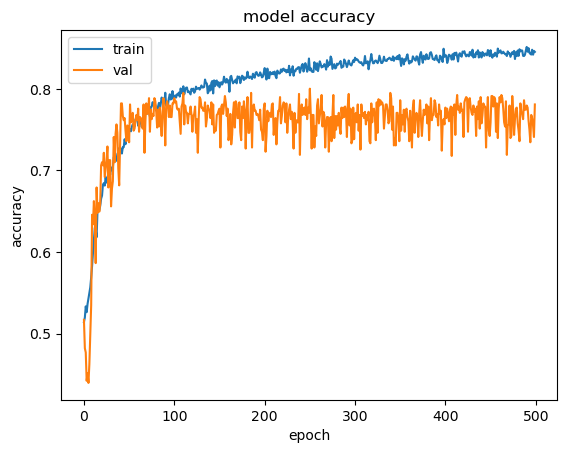

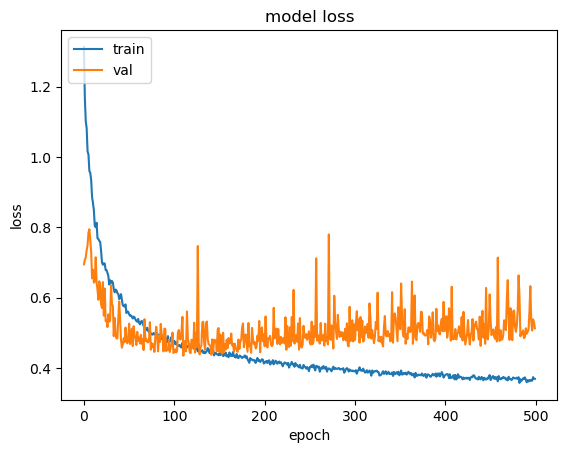

              precision    recall  f1-score   support

  No_spindle       0.71      0.76      0.74       313
With_spindle       0.83      0.79      0.81       463

    accuracy                           0.78       776
   macro avg       0.77      0.78      0.77       776
weighted avg       0.78      0.78      0.78       776

**************************************************************
Confusion matrix, without normalization
[[238  75]
 [ 95 368]]


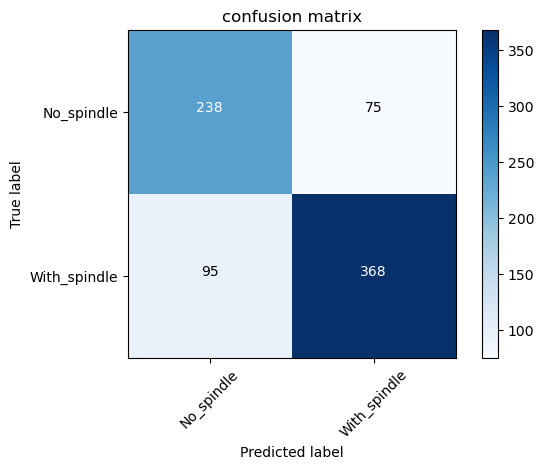

(776, 1000, 1)
(4096, 1000, 1)
0.09502971789949292
18.80152957972854
(4872, 1000, 1)
(832, 1000, 1)
(4872,)
(832,)
2634
529
Epoch 1/500
39/39 [==============================] - 3s 27ms/step - loss: 1.4826 - accuracy: 0.5021 - val_loss: 0.7724 - val_accuracy: 0.4183
Epoch 2/500
39/39 [==============================] - 1s 15ms/step - loss: 1.2934 - accuracy: 0.5361 - val_loss: 1.0033 - val_accuracy: 0.3582
Epoch 3/500
39/39 [==============================] - 1s 14ms/step - loss: 1.1839 - accuracy: 0.5577 - val_loss: 1.2878 - val_accuracy: 0.3618
Epoch 4/500
39/39 [==============================] - 0s 10ms/step - loss: 1.0945 - accuracy: 0.5794 - val_loss: 1.3271 - val_accuracy: 0.3618
Epoch 5/500
39/39 [==============================] - 0s 11ms/step - loss: 1.0622 - accuracy: 0.5657 - val_loss: 1.2979 - val_accuracy: 0.3666
Epoch 6/500
39/39 [==============================] - 0s 10ms/step - loss: 1.0168 - accuracy: 0.5761 - val_loss: 1.2137 - val_accuracy: 0.3834
Epoch 7/500
39/39 [=====

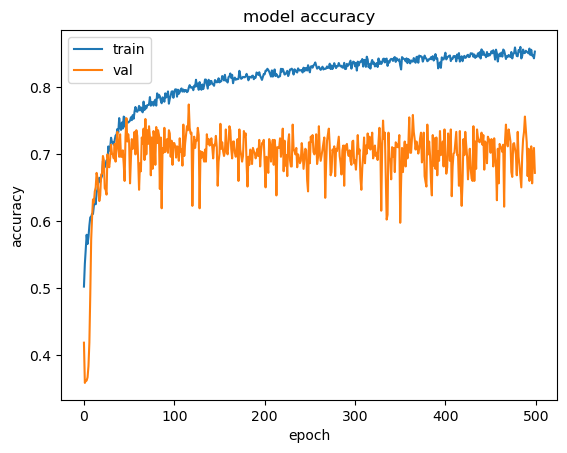

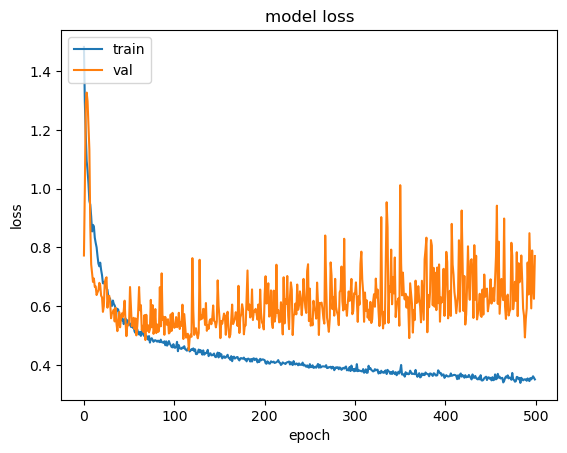

              precision    recall  f1-score   support

  No_spindle       0.53      0.93      0.67       303
With_spindle       0.93      0.52      0.67       529

    accuracy                           0.67       832
   macro avg       0.73      0.73      0.67       832
weighted avg       0.78      0.67      0.67       832

**************************************************************
Confusion matrix, without normalization
[[282  21]
 [252 277]]


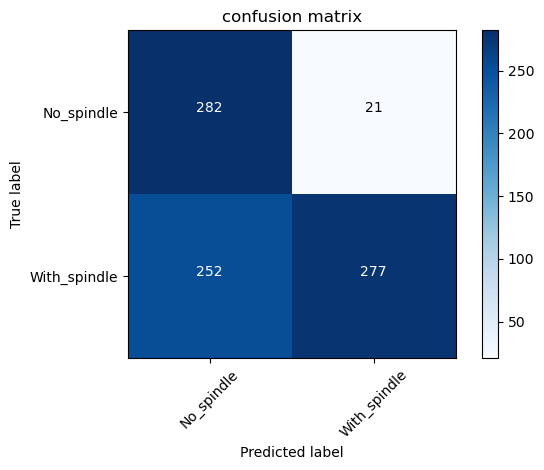

(1608, 1000, 1)
(3696, 1000, 1)
0.03528592220832505
19.835157639458664
(5304, 1000, 1)
(400, 1000, 1)
(5304,)
(400,)
3118
45
Epoch 1/500
42/42 [==============================] - 4s 32ms/step - loss: 1.4908 - accuracy: 0.5187 - val_loss: 0.6028 - val_accuracy: 0.8875
Epoch 2/500
42/42 [==============================] - 0s 11ms/step - loss: 1.2790 - accuracy: 0.5528 - val_loss: 0.5171 - val_accuracy: 0.8875
Epoch 3/500
42/42 [==============================] - 0s 9ms/step - loss: 1.1988 - accuracy: 0.5600 - val_loss: 0.3919 - val_accuracy: 0.8875
Epoch 4/500
42/42 [==============================] - 0s 9ms/step - loss: 1.1086 - accuracy: 0.5633 - val_loss: 0.3737 - val_accuracy: 0.8875
Epoch 5/500
42/42 [==============================] - 0s 10ms/step - loss: 1.0637 - accuracy: 0.5741 - val_loss: 0.3368 - val_accuracy: 0.8875
Epoch 6/500
42/42 [==============================] - 0s 10ms/step - loss: 0.9754 - accuracy: 0.5931 - val_loss: 0.3227 - val_accuracy: 0.8900
Epoch 7/500
42/42 [======

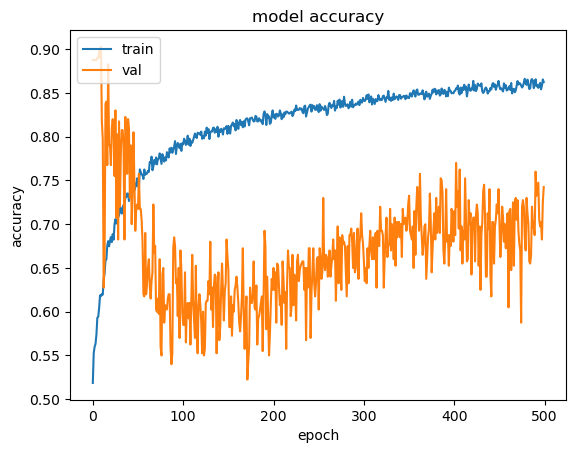

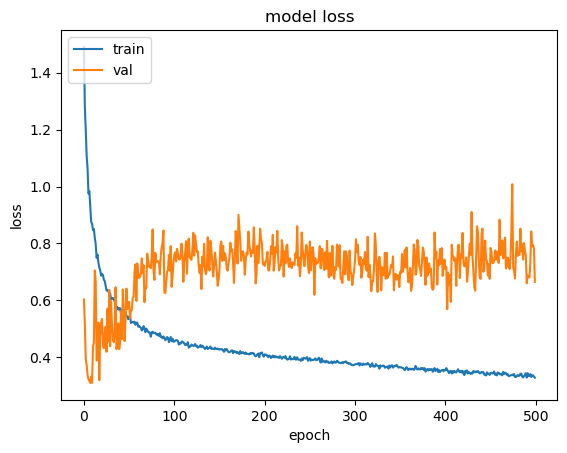

              precision    recall  f1-score   support

  No_spindle       0.99      0.72      0.83       355
With_spindle       0.30      0.96      0.46        45

    accuracy                           0.74       400
   macro avg       0.65      0.84      0.64       400
weighted avg       0.91      0.74      0.79       400

**************************************************************
Confusion matrix, without normalization
[[254 101]
 [  2  43]]


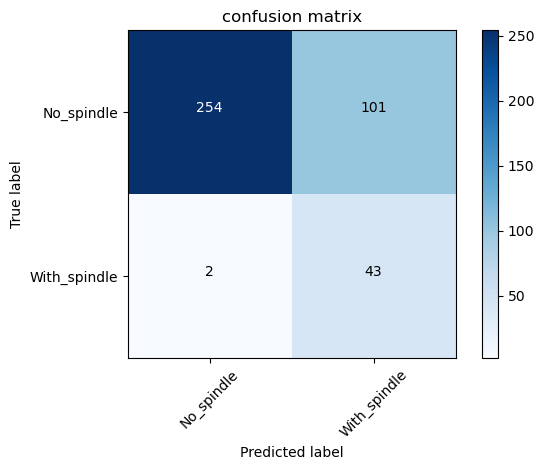

(2008, 1000, 1)
(2984, 1000, 1)
0.004872009194686102
20.205748939914734
(4992, 1000, 1)
(712, 1000, 1)
(4992,)
(712,)
2764
399
Epoch 1/500
39/39 [==============================] - 3s 19ms/step - loss: 1.4419 - accuracy: 0.5210 - val_loss: 0.6962 - val_accuracy: 0.4480
Epoch 2/500
39/39 [==============================] - 0s 8ms/step - loss: 1.2687 - accuracy: 0.5419 - val_loss: 0.7653 - val_accuracy: 0.4382
Epoch 3/500
39/39 [==============================] - 0s 8ms/step - loss: 1.1388 - accuracy: 0.5651 - val_loss: 0.9104 - val_accuracy: 0.4396
Epoch 4/500
39/39 [==============================] - 0s 8ms/step - loss: 1.0996 - accuracy: 0.5723 - val_loss: 1.0031 - val_accuracy: 0.4396
Epoch 5/500
39/39 [==============================] - 0s 9ms/step - loss: 1.0635 - accuracy: 0.5677 - val_loss: 1.1530 - val_accuracy: 0.4396
Epoch 6/500
39/39 [==============================] - 0s 8ms/step - loss: 0.9978 - accuracy: 0.5843 - val_loss: 1.2110 - val_accuracy: 0.4368
Epoch 7/500
39/39 [=======

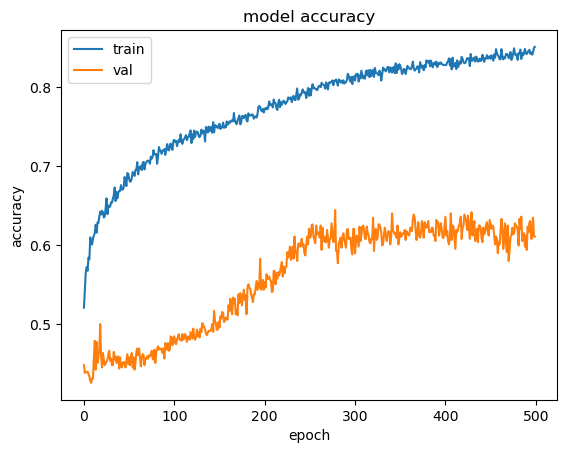

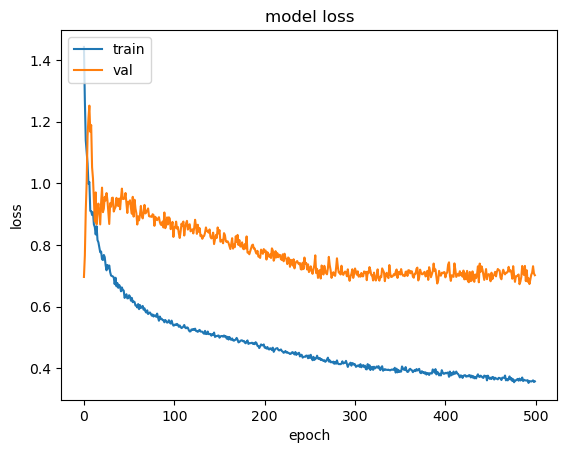

              precision    recall  f1-score   support

  No_spindle       0.54      0.73      0.62       313
With_spindle       0.71      0.51      0.60       399

    accuracy                           0.61       712
   macro avg       0.63      0.62      0.61       712
weighted avg       0.64      0.61      0.61       712

**************************************************************
Confusion matrix, without normalization
[[230  83]
 [194 205]]


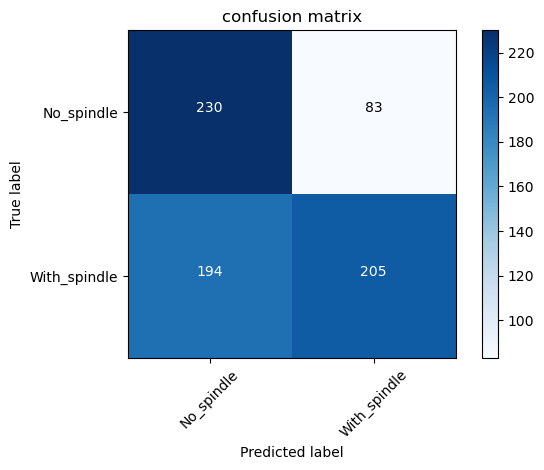

(2720, 1000, 1)
(2176, 1000, 1)
-0.018183869115282678
20.155842732528054
(4896, 1000, 1)
(808, 1000, 1)
(4896,)
(808,)
2663
500
Epoch 1/500
39/39 [==============================] - 4s 24ms/step - loss: 1.4729 - accuracy: 0.5053 - val_loss: 0.7041 - val_accuracy: 0.4443
Epoch 2/500
39/39 [==============================] - 0s 10ms/step - loss: 1.3319 - accuracy: 0.5121 - val_loss: 0.7147 - val_accuracy: 0.4418
Epoch 3/500
39/39 [==============================] - 0s 10ms/step - loss: 1.2049 - accuracy: 0.5196 - val_loss: 0.7438 - val_accuracy: 0.4307
Epoch 4/500
39/39 [==============================] - 0s 10ms/step - loss: 1.1235 - accuracy: 0.5227 - val_loss: 0.7541 - val_accuracy: 0.4406
Epoch 5/500
39/39 [==============================] - 0s 10ms/step - loss: 1.0568 - accuracy: 0.5408 - val_loss: 0.7413 - val_accuracy: 0.5000
Epoch 6/500
39/39 [==============================] - 0s 10ms/step - loss: 1.0331 - accuracy: 0.5378 - val_loss: 0.7428 - val_accuracy: 0.4963
Epoch 7/500
39/39 [=

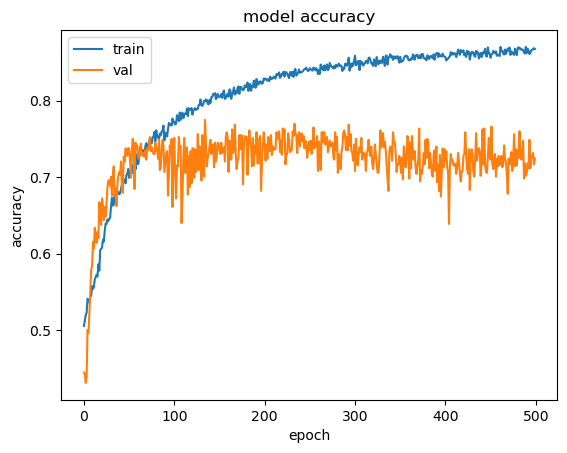

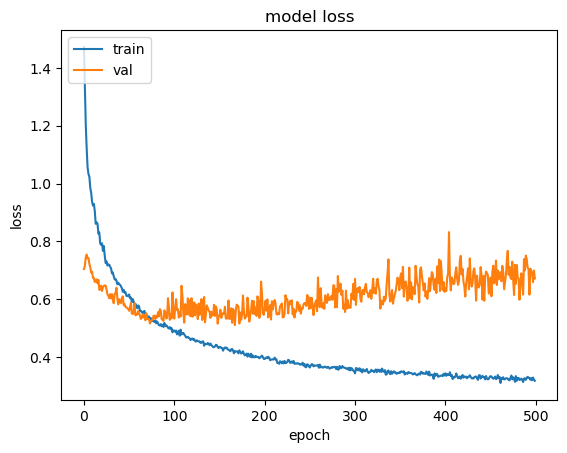

              precision    recall  f1-score   support

  No_spindle       0.60      0.80      0.69       308
With_spindle       0.85      0.68      0.75       500

    accuracy                           0.72       808
   macro avg       0.73      0.74      0.72       808
weighted avg       0.75      0.72      0.73       808

**************************************************************
Confusion matrix, without normalization
[[247  61]
 [162 338]]


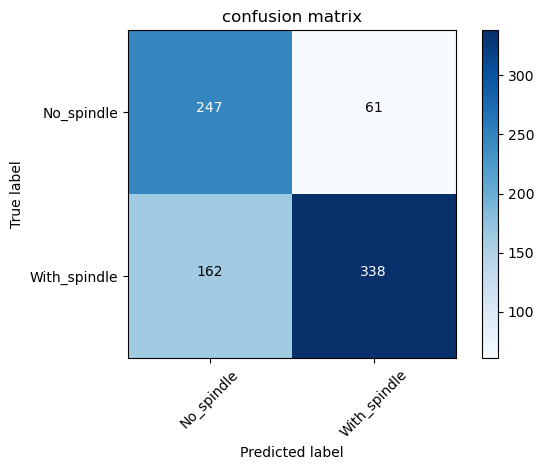

(3528, 1000, 1)
(1248, 1000, 1)
-0.0046322864905825895
19.795477332788572
(4776, 1000, 1)
(928, 1000, 1)
(4776,)
(928,)
2529
634
Epoch 1/500
38/38 [==============================] - 3s 23ms/step - loss: 1.3892 - accuracy: 0.5071 - val_loss: 0.7715 - val_accuracy: 0.3168
Epoch 2/500
38/38 [==============================] - 0s 11ms/step - loss: 1.2565 - accuracy: 0.5182 - val_loss: 0.8293 - val_accuracy: 0.3222
Epoch 3/500
38/38 [==============================] - 0s 9ms/step - loss: 1.1930 - accuracy: 0.5255 - val_loss: 0.8526 - val_accuracy: 0.3330
Epoch 4/500
38/38 [==============================] - 0s 10ms/step - loss: 1.0996 - accuracy: 0.5373 - val_loss: 0.8015 - val_accuracy: 0.3944
Epoch 5/500
38/38 [==============================] - 0s 11ms/step - loss: 1.0921 - accuracy: 0.5274 - val_loss: 0.8184 - val_accuracy: 0.4106
Epoch 6/500
38/38 [==============================] - 0s 9ms/step - loss: 1.0544 - accuracy: 0.5408 - val_loss: 0.7912 - val_accuracy: 0.4580
Epoch 7/500
38/38 [==

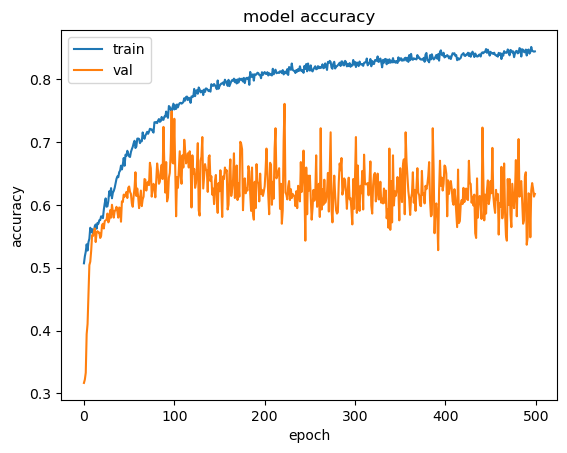

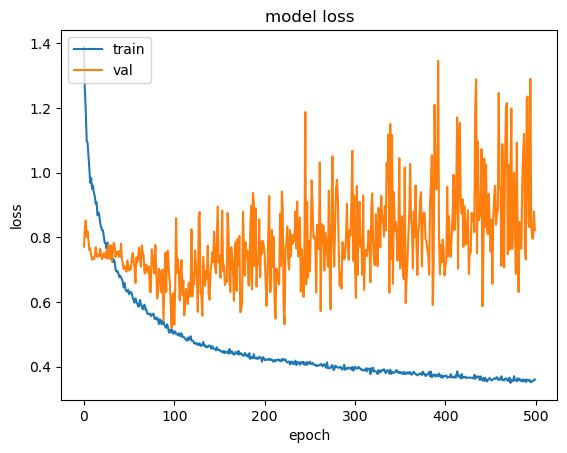

              precision    recall  f1-score   support

  No_spindle       0.45      0.86      0.59       294
With_spindle       0.89      0.50      0.64       634

    accuracy                           0.62       928
   macro avg       0.67      0.68      0.62       928
weighted avg       0.75      0.62      0.63       928

**************************************************************
Confusion matrix, without normalization
[[254  40]
 [315 319]]


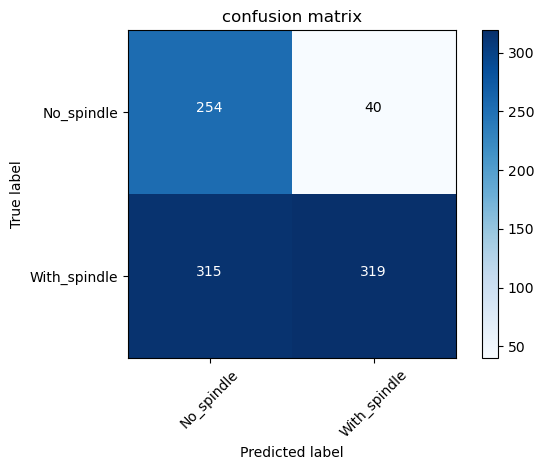

(4456, 1000, 1)
(744, 1000, 1)
0.024685310583313563
19.58843657897907
(5200, 1000, 1)
(504, 1000, 1)
(5200,)
(504,)
3000
163
Epoch 1/500
41/41 [==============================] - 4s 25ms/step - loss: 1.4231 - accuracy: 0.5281 - val_loss: 0.6318 - val_accuracy: 0.6746
Epoch 2/500
41/41 [==============================] - 0s 9ms/step - loss: 1.1833 - accuracy: 0.5742 - val_loss: 0.6859 - val_accuracy: 0.6766
Epoch 3/500
41/41 [==============================] - 0s 9ms/step - loss: 1.0961 - accuracy: 0.5994 - val_loss: 0.7165 - val_accuracy: 0.6766
Epoch 4/500
41/41 [==============================] - 0s 10ms/step - loss: 1.0392 - accuracy: 0.6158 - val_loss: 0.6896 - val_accuracy: 0.6766
Epoch 5/500
41/41 [==============================] - 0s 9ms/step - loss: 0.9629 - accuracy: 0.6290 - val_loss: 0.6229 - val_accuracy: 0.6845
Epoch 6/500
41/41 [==============================] - 0s 9ms/step - loss: 0.9257 - accuracy: 0.6460 - val_loss: 0.5366 - val_accuracy: 0.7361
Epoch 7/500
41/41 [========

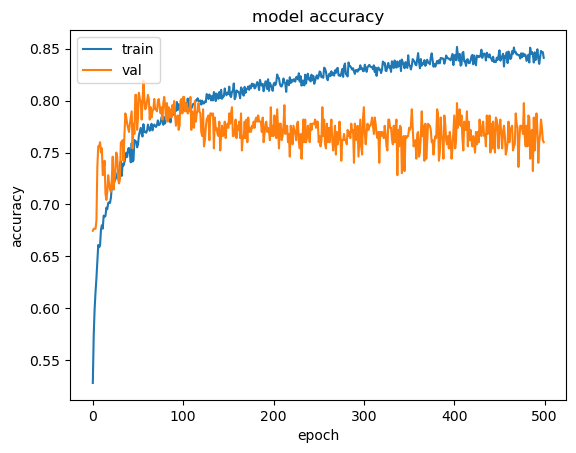

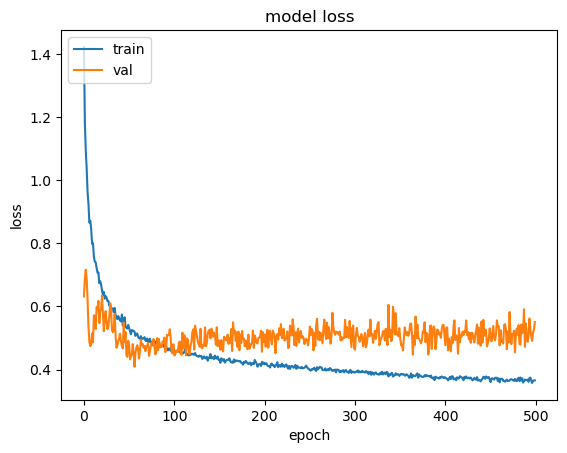

              precision    recall  f1-score   support

  No_spindle       0.88      0.74      0.81       341
With_spindle       0.60      0.80      0.68       163

    accuracy                           0.76       504
   macro avg       0.74      0.77      0.74       504
weighted avg       0.79      0.76      0.77       504

**************************************************************
Confusion matrix, without normalization
[[253  88]
 [ 33 130]]


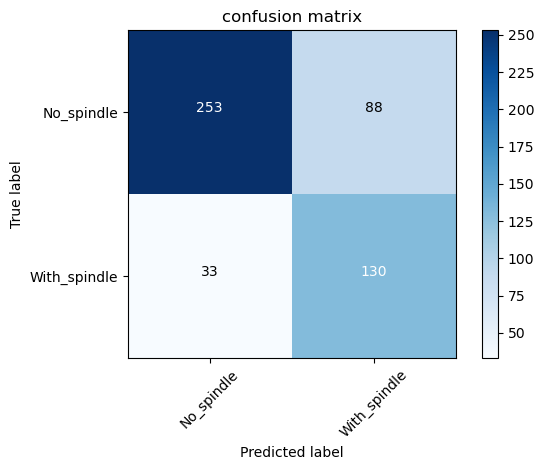

(4960, 1000, 1)
(0, 1000, 1)
0.08385094888631013
20.127287799667464
(4960, 1000, 1)
(744, 1000, 1)
(4960,)
(744,)
2733
430
Epoch 1/500
39/39 [==============================] - 3s 26ms/step - loss: 1.2617 - accuracy: 0.5115 - val_loss: 0.6858 - val_accuracy: 0.5484
Epoch 2/500
39/39 [==============================] - 0s 9ms/step - loss: 1.1509 - accuracy: 0.5246 - val_loss: 0.6820 - val_accuracy: 0.5766
Epoch 3/500
39/39 [==============================] - 0s 9ms/step - loss: 1.0353 - accuracy: 0.5492 - val_loss: 0.6911 - val_accuracy: 0.5766
Epoch 4/500
39/39 [==============================] - 0s 10ms/step - loss: 1.0266 - accuracy: 0.5407 - val_loss: 0.7061 - val_accuracy: 0.5860
Epoch 5/500
39/39 [==============================] - 0s 9ms/step - loss: 0.9619 - accuracy: 0.5556 - val_loss: 0.7288 - val_accuracy: 0.5833
Epoch 6/500
39/39 [==============================] - 0s 9ms/step - loss: 0.9402 - accuracy: 0.5633 - val_loss: 0.7572 - val_accuracy: 0.5887
Epoch 7/500
39/39 [==========

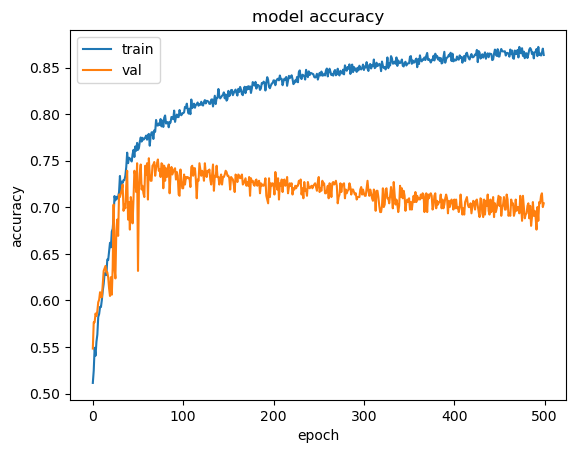

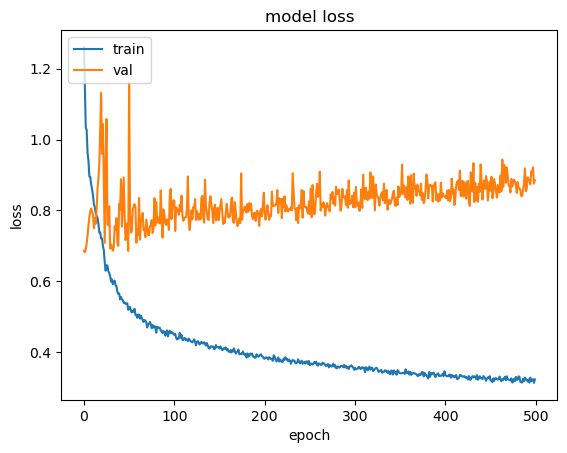

              precision    recall  f1-score   support

  No_spindle       0.66      0.61      0.63       314
With_spindle       0.73      0.77      0.75       430

    accuracy                           0.70       744
   macro avg       0.70      0.69      0.69       744
weighted avg       0.70      0.70      0.70       744

**************************************************************
Confusion matrix, without normalization
[[191 123]
 [ 97 333]]


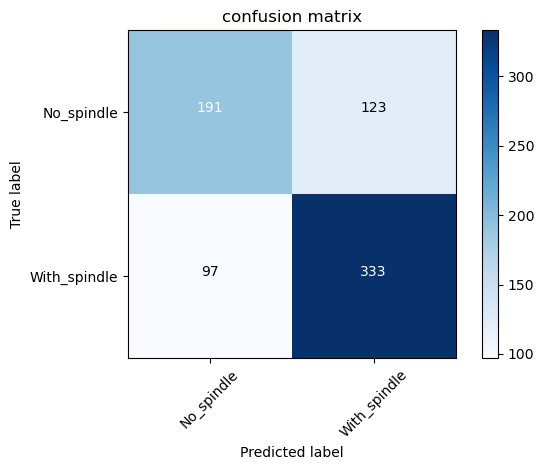

------------------------------------------------------------------------
Score per subject
------------------------------------------------------------------------
> Sublect 1 - Loss: 0.5131573677062988 - Accuracy: 78.0927836894989%
------------------------------------------------------------------------
> Sublect 2 - Loss: 0.7706231474876404 - Accuracy: 67.1875%
------------------------------------------------------------------------
> Sublect 3 - Loss: 0.6647263169288635 - Accuracy: 74.25000071525574%
------------------------------------------------------------------------
> Sublect 4 - Loss: 0.7018346786499023 - Accuracy: 61.09550595283508%
------------------------------------------------------------------------
> Sublect 5 - Loss: 0.6718122363090515 - Accuracy: 72.40098714828491%
------------------------------------------------------------------------
> Sublect 6 - Loss: 0.8224254250526428 - Accuracy: 61.74569129943848%
--------------------------------------------------------------

In [13]:
#LOSO validation
from sklearn.utils import shuffle
from keras import regularizers

# Define per-subject-left-out score containers
acc_per_subject_left_out = []
loss_per_subject_left_out = []


# CNN model parameters
num_classes = 2
epochs = 500
batch_size = 128
timesteps = 1000
data_dim = 1
input_shape = (timesteps, data_dim)


#data partition
for i in range(0, len(excerpt_eeg)): 
    #preprocess
    
    #leave on subject out as test data
    data_infront_test_subject = eeg[:subjects_data_index_mark[i,0],:]
    print(data_infront_test_subject.shape)
    label_infront_test_subject = labels_int[:subjects_data_index_mark[i,0]]
    data_behind_test_subject = eeg[subjects_data_index_mark[i,1]:,:]
    print(data_behind_test_subject.shape)
    label_behind_test_subject = labels_int[subjects_data_index_mark[i,1]:]
    
    train_data = np.concatenate([data_infront_test_subject, data_behind_test_subject], axis=0)
    train_labels = np.concatenate([label_infront_test_subject, label_behind_test_subject], axis=0)
    test_data = eeg[subjects_data_index_mark[i,0]:subjects_data_index_mark[i,1],:]
    test_labels = labels_int[subjects_data_index_mark[i,0]:subjects_data_index_mark[i,1]]
    
    
    #shuffle
    train_data,train_labels= shuffle(train_data, train_labels, random_state=0)
    test_data,test_labels= shuffle(test_data, test_labels, random_state=0)
    
    #preprocess
    mean_value = train_data.mean()
    std_value = train_data.std()
    print(mean_value)
    print(std_value)
    for i in range(train_data.shape[0]):
        for j in range(train_data.shape[1]):
            for k in range(train_data.shape[2]):
                train_data[i,j,k] = (train_data[i,j,k]-mean_value) / std_value
                
    for i in range(test_data.shape[0]):
        for j in range(test_data.shape[1]):
            for k in range(test_data.shape[2]):
                test_data[i,j,k] = (test_data[i,j,k]-mean_value) / std_value
    
    #validation data partition?
    
    #統計兩類數量
    print(train_data.shape)
#     print(valid_images.shape)
    print(test_data.shape)
    print(train_labels.shape)
#     print(valid_labels.shape)
    print(test_labels.shape)
    train_count = 0
#     valid_count = 0
    test_count = 0
    for i in range(len(train_labels)):
      if(train_labels[i]==1):
        train_count += 1
#     for i in range(len(valid_labels)):
#       if(valid_labels[i]==1):
#         valid_count += 1
    for i in range(len(test_labels)):
      if(test_labels[i]==1):
        test_count += 1

    print(train_count)
#     print(valid_count)
    print(test_count)
    
    
    #Construct model
    model = Sequential()
    model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=5, strides=1))
    # model.add(Dropout(0.5))
    model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=5, strides=1))
    # model.add(Dropout(0.5))
    model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=5, strides=1))
    # model.add(Dropout(0.5))
    model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=5, strides=1))
    # model.add(Dropout(0.5))
    model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=5, strides=1))
    # model.add(LSTM(100, return_sequences=True, stateful=False))
    model.add(Flatten())
    model.add(Dropout(0.5))
    # model.add(Dense(100,activation='relu',kernel_regularizer=regularizers.l2(l=0.001)))  
    # ##lambda為正規化需要設定的超參數，若太小會導致懲罰項無用，若太大則會影響模型收斂的情形
    # model.add(Dropout(0.5))  # p會決定每個神經網路是否關閉的機率
    # # 使用L1正規化
    # model.add(Dense(50,activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    
    # Compile model
#     model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), optimizer='adam', metrics=['accuracy'])
    model.compile(tf.keras.optimizers.SGD(0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])
    
    #star training
    history = model.fit(
        train_data,
        train_labels,
        epochs=epochs,
        batch_size=batch_size,
#         class_weight={0: class_weights[0],1: class_weights[1]},
        validation_data=(test_data, test_labels)
    )
    
    
    # Generate generalization metrics
    scores = model.evaluate(test_data, test_labels, verbose=0)
    print(f'Score for subject{i+1} left out: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}%')
    acc_per_subject_left_out.append(scores[1] * 100)
    loss_per_subject_left_out.append(scores[0])
    
    
    #Plot training, validation and test set accuracy
    print("Training Curve")
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    #Plot training, validation and test set loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    
    
    
    #  Generate confudion matrix(main function)
    y_predict = model.predict(test_data, batch_size=None, verbose=0, steps=None)
#     print(y_predict)
    y_pred = convert_to_labels(y_predict)
#     print(y_pred)
    y_true = test_labels
    target_names = ['No_spindle','With_spindle']
    print(classification_report(y_true, y_pred, target_names=target_names))
    print ("**************************************************************")
    plt.figure()
    cnf_matrix = confusion_matrix(y_true, y_pred)
    plot_confusion_matrix(cnf_matrix, classes=target_names, normalize=False, title='confusion matrix')
    plt.show()
    
    
    



# == Provide average scores ==
print('------------------------------------------------------------------------')
print('Score per subject')
for i in range(0, len(acc_per_subject_left_out)):
  print('------------------------------------------------------------------------')
  print(f'> Sublect {i+1} - Loss: {loss_per_subject_left_out[i]} - Accuracy: {acc_per_subject_left_out[i]}%')
print('------------------------------------------------------------------------')
print('Average scores for all subjects:')
print(f'> Accuracy: {np.mean(acc_per_subject_left_out)} (+- {np.std(acc_per_subject_left_out)})')
print(f'> Loss: {np.mean(loss_per_subject_left_out)}')
print('------------------------------------------------------------------------')
    
    
    
    
    
    
    
    

# Fine-tuning for model

In [10]:
# paper survey model 2

from keras import regularizers

num_classes = 2
epochs = 1000
batch_size = 128
timesteps = 1000
data_dim = 1
input_shape = (timesteps, data_dim)

model = Sequential()
model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', input_shape=input_shape))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=5, strides=1))
# model.add(Dropout(0.5))
model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=5, strides=1))
# model.add(Dropout(0.5))
model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=5, strides=1))
# model.add(Dropout(0.5))
model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=5, strides=1))
# model.add(Dropout(0.5))
model.add(Conv1D(4, kernel_size=7, strides=1, activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=5, strides=1))
# model.add(LSTM(100, return_sequences=True, stateful=False))
model.add(Flatten())
model.add(Dropout(0.5))
# model.add(Dense(100,activation='relu',kernel_regularizer=regularizers.l2(l=0.001)))  
# ##lambda為正規化需要設定的超參數，若太小會導致懲罰項無用，若太大則會影響模型收斂的情形
# model.add(Dropout(0.5))  # p會決定每個神經網路是否關閉的機率
# # 使用L1正規化
# model.add(Dense(50,activation='relu'))
model.add(Dense(num_classes, activation='softmax'))



# model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), optimizer='adam', metrics=['accuracy'])
model.compile(tf.keras.optimizers.SGD(0.001), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])

from sklearn.utils import class_weight
class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_labels),y=train_labels)
print(class_weights)
# fit network
history = model.fit(train_data, train_labels, epochs=epochs, batch_size=batch_size
                    # , class_weight={0: class_weights[0],1: class_weights[1]}
                    , validation_data=(valid_data, valid_labels))

[1.11184211 0.90860215]
Epoch 1/1000
36/36 [==============================] - 12s 39ms/step - loss: 1.3599 - accuracy: 0.5201 - val_loss: 0.6809 - val_accuracy: 0.5772
Epoch 2/1000
36/36 [==============================] - 1s 16ms/step - loss: 1.2784 - accuracy: 0.5238 - val_loss: 0.7259 - val_accuracy: 0.5772
Epoch 3/1000
36/36 [==============================] - 0s 14ms/step - loss: 1.1466 - accuracy: 0.5411 - val_loss: 0.7755 - val_accuracy: 0.5772
Epoch 4/1000
36/36 [==============================] - 0s 10ms/step - loss: 1.0533 - accuracy: 0.5613 - val_loss: 0.8396 - val_accuracy: 0.5772
Epoch 5/1000
36/36 [==============================] - 0s 10ms/step - loss: 1.0557 - accuracy: 0.5672 - val_loss: 0.9246 - val_accuracy: 0.5772
Epoch 6/1000
36/36 [==============================] - 0s 10ms/step - loss: 0.9758 - accuracy: 0.5834 - val_loss: 0.9839 - val_accuracy: 0.5772
Epoch 7/1000
36/36 [==============================] - 0s 10ms/step - loss: 0.9522 - accuracy: 0.5891 - val_loss: 1.04

In [5]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_5 (Conv1D)           (None, 994, 4)            32        
                                                                 
 batch_normalization_5 (Batc  (None, 994, 4)           16        
 hNormalization)                                                 
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 990, 4)           0         
 1D)                                                             
                                                                 
 conv1d_6 (Conv1D)           (None, 990, 4)            116       
                                                                 
 batch_normalization_6 (Batc  (None, 990, 4)           16        
 hNormalization)                                                 
                                                      

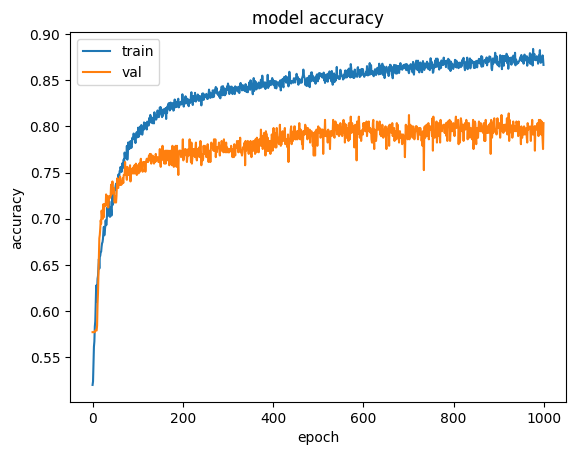

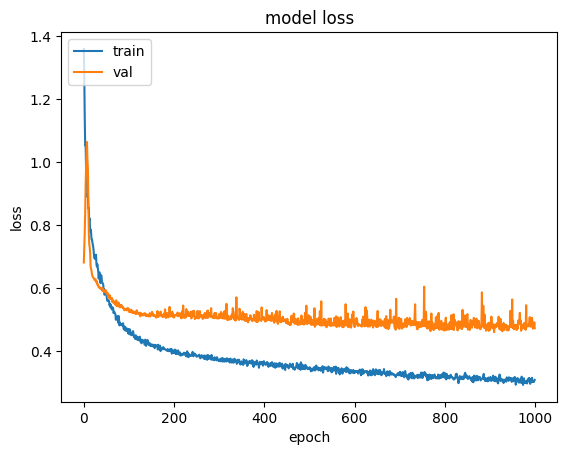

In [11]:
#Plot training, validation and test set accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
#Plot training, validation and test set loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [11]:
#10 fold cross validation
from sklearn.model_selection import KFold
import numpy as np

# Define per-fold score containers
acc_per_fold = []
loss_per_fold = []

# Merge inputs and targets
inputs = np.concatenate((train_data, valid_data), axis=0)
targets = np.concatenate((train_labels, valid_labels), axis=0)


# loss_function = sparse_categorical_crossentropy
# no_epochs = 25
# optimizer = Adam()
# # verbosity = 1
num_folds = 10

# Define the K-fold Cross Validator
kfold = KFold(n_splits=num_folds, shuffle=True)

from keras import regularizers
num_classes = 2
epochs = 50
batch_size = 128
timesteps = 1000
data_dim = 1
input_shape = (timesteps, data_dim)

# K-fold Cross Validation model evaluation
fold_no = 1
for train, test in kfold.split(inputs, targets):

  # Define the model architecture
  model = Sequential()
  model.add(Conv1D(40, kernel_size=7, strides=1, activation='relu', input_shape=input_shape))
  model.add(MaxPooling1D(pool_size=5, strides=1))
  model.add(Conv1D(40, kernel_size=7, strides=1, activation='relu', padding='same'))
  model.add(MaxPooling1D(pool_size=5, strides=1))
  model.add(Conv1D(40, kernel_size=7, strides=1, activation='relu', padding='same'))
  model.add(MaxPooling1D(pool_size=5, strides=1))
  model.add(Conv1D(40, kernel_size=7, strides=1, activation='relu', padding='same'))
  model.add(MaxPooling1D(pool_size=5, strides=1))
  model.add(Conv1D(40, kernel_size=7, strides=1, activation='relu', padding='same'))
  model.add(MaxPooling1D(pool_size=5, strides=1))
  # model.add(LSTM(100, return_sequences=True, stateful=False))
  model.add(Flatten())
  model.add(Dropout(0.5))
  model.add(Dense(100,activation='relu',kernel_regularizer=regularizers.l2(l=0.001)))  
  ##lambda為正規化需要設定的超參數，若太小會導致懲罰項無用，若太大則會影響模型收斂的情形
  model.add(Dropout(0.5))  # p會決定每個神經網路是否關閉的機率
  # 使用L1正規化
  model.add(Dense(50,activation='relu',kernel_regularizer=regularizers.l1(0.001)))
  model.add(Dense(num_classes, activation='softmax'))

  # Compile the model
  # cross_valid_model.compile(loss=loss_function, optimizer=optimizer, metrics=['accuracy'])
  model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), optimizer='adam', metrics=['accuracy'])



  # Generate a print
  print('------------------------------------------------------------------------')
  print(f'Training for fold {fold_no} ...')

  # Fit data to model
  history = model.fit(inputs[train], targets[train],
              batch_size=batch_size,
              epochs=epochs)

  # Generate generalization metrics
  scores = model.evaluate(inputs[test], targets[test], verbose=0)
  print(f'Score for fold {fold_no}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}%')
  acc_per_fold.append(scores[1] * 100)
  loss_per_fold.append(scores[0])

  # Increase fold number
  fold_no = fold_no + 1

# == Provide average scores ==
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(0, len(acc_per_fold)):
  print('------------------------------------------------------------------------')
  print(f'> Fold {i+1} - Loss: {loss_per_fold[i]} - Accuracy: {acc_per_fold[i]}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Accuracy: {np.mean(acc_per_fold)} (+- {np.std(acc_per_fold)})')
print(f'> Loss: {np.mean(loss_per_fold)}')
print('------------------------------------------------------------------------')

------------------------------------------------------------------------
Training for fold 1 ...
Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


27/27 [==============================] - 14s 52ms/step - loss: 1.1817 - accuracy: 0.5533
Epoch 2/50
27/27 [==============================] - 1s 35ms/step - loss: 1.0255 - accuracy: 0.5582
Epoch 3/50
27/27 [==============================] - 1s 35ms/step - loss: 0.9307 - accuracy: 0.5757
Epoch 4/50
27/27 [==============================] - 1s 35ms/step - loss: 0.8473 - accuracy: 0.5929
Epoch 5/50
27/27 [==============================] - 1s 34ms/step - loss: 0.7602 - accuracy: 0.6676
Epoch 6/50
27/27 [==============================] - 1s 35ms/step - loss: 0.6608 - accuracy: 0.7461
Epoch 7/50
27/27 [==============================] - 1s 36ms/step - loss: 0.6236 - accuracy: 0.7558
Epoch 8/50
27/27 [==============================] - 1s 36ms/step - loss: 0.5923 - accuracy: 0.7753
Epoch 9/50
27/27 [==============================] - 1s 35ms/step - loss: 0.5739 - accuracy: 0.7823
Epoch 10/50
27/27 [==============================] - 1s 35ms/step - loss: 0.5285 - accuracy: 0.8121
Epoch 11/50
27/27 [

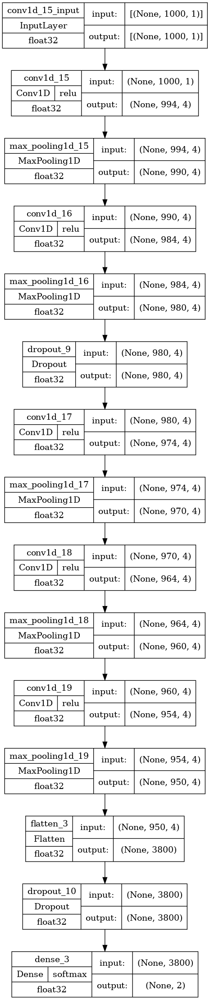

In [25]:
# 顯示model in detail
from tensorflow.keras.utils import plot_model

tf.keras.utils.plot_model(
    model,
    to_file='model.png',
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=True,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)

In [14]:
from sklearn.metrics import classification_report

import itertools
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import numpy as np

# Confusion matrix
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

In [15]:
# 透過convert_to_labels 將one-hot-encode的資料轉成label
def convert_to_labels(X):
  return np.argmax(X, axis=1)

(571, 1000, 1)
[[9.6375155e-01 3.6248464e-02]
 [6.5736526e-12 1.0000000e+00]
 [9.7616881e-01 2.3831217e-02]
 ...
 [9.7200859e-01 2.7991382e-02]
 [7.4231084e-09 1.0000000e+00]
 [1.1700599e-15 1.0000000e+00]]
[0 1 0 1 0 0 1 1 1 1 0 1 0 1 0 0 0 0 1 0 1 1 1 1 1 1 0 0 0 1 0 1 0 0 0 1 1
 1 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 1 0 1 0 1 1 1 1 0 0 1 0 1 0 0 0 1 1 0 0
 0 1 0 0 1 1 0 1 1 1 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 1 0 0
 1 0 0 0 1 0 0 1 0 1 0 1 0 1 1 0 0 1 0 0 1 1 1 0 1 0 0 0 1 1 0 1 0 1 1 1 0
 1 1 1 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 1 0 1 1 0 0 1 0 1 0 1 0 1 0 1 0 1 0
 1 0 1 0 1 0 1 1 0 1 0 0 1 0 0 1 1 0 1 1 0 1 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1
 1 1 1 1 0 0 1 0 0 1 0 0 1 1 1 0 1 0 1 1 0 1 0 0 1 1 0 1 1 0 0 0 1 0 0 0 0
 1 0 0 1 1 0 1 1 0 0 1 1 0 0 0 1 0 0 1 0 1 1 0 1 0 1 1 0 1 0 0 0 1 0 1 1 0
 0 1 1 0 1 0 1 1 0 1 1 1 0 0 1 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 1 1 1 1 0 0 1 1 1 1 1 0 1 0 0 0 1 1 0 1 0 1
 1 1 0 0 0 0 1 0 1 0 0 1 1 0 0 1 1 0 1 1 0 

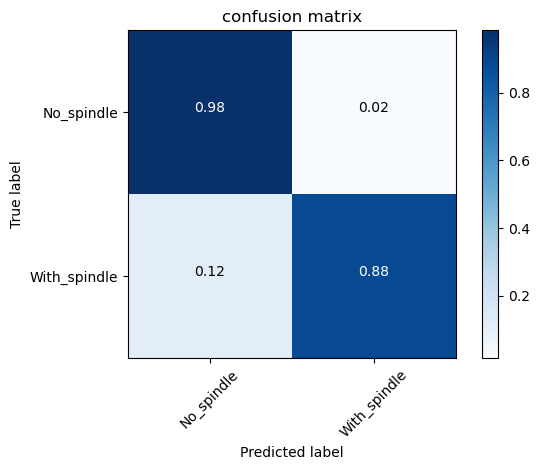

In [38]:
#  Generate confudion matrix(main function)
print(test_data.shape)
y_predict = model.predict(test_data, batch_size=None, verbose=0, steps=None)
print(y_predict)
y_pred = convert_to_labels(y_predict)
print(y_pred)
y_true = test_labels
target_names = ['No_spindle','With_spindle']
print(classification_report(y_true, y_pred, target_names=target_names))
print ("**************************************************************")








plt.figure()
cnf_matrix = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(cnf_matrix, classes=target_names, normalize=True, title='confusion matrix')

plt.show()

In [16]:
model.summary()

Model: "sequential"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 conv1d (Conv1D)             (None, 244, 40)           320       

                                                                 

 max_pooling1d (MaxPooling1D  (None, 240, 40)          0         

 )                                                               

                                                                 

 conv1d_1 (Conv1D)           (None, 234, 40)           11240     

                                                                 

 max_pooling1d_1 (MaxPooling  (None, 230, 40)          0         

 1D)                                                             

                                                                 

 conv1d_2 (Conv1D)           (None, 224, 40)           11240     

                                                                 

 max_pooling1d_2 (MaxPooling  (None, 220

# XAI: Grad-CAM

In [ ]:
# 1d-cnn grad-cam 
from tensorflow.keras import models
import keras.backend as K
import cv2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
import tensorflow as tf


last_conv_layer = model.get_layer(index=8)
heatmap_model = models.Model([model.input], [last_conv_layer.output, model.output])

misclassify_count = 0
correct_record = np.zeros((30,), dtype=int)

for i in range(0,30):
  
  x = np.expand_dims(test_data[i:i+1,:,:],axis=0)

  # pred = model.predict(x)
  # class_idx = np.argmax(pred[0])
  # class_output = model.output[:,class_idx]
  # grads = K.gradients(class_output,last_conv_layer.output)[0]
  # pooled_grads = K.mean(grads,axis=(0,1,2))


  preds = model.predict(x)
  pred_class = np.argmax(preds)
  with tf.GradientTape() as gtape:
    conv_output, Predictions = heatmap_model(x)
    prob = Predictions[:, np.argmax(Predictions[0])]
    grads = gtape.gradient(prob, conv_output)
    pooled_grads = K.mean(grads, axis=(0,1)) 

  print([last_conv_layer.output[0]])
  print([pooled_grads])
  iterate_grads = K.function([model.input], [pooled_grads])
  iterate_conv_output = K.function([model.input], [last_conv_layer.output[0]])
    
    # 傳入影像矩陣 x，並得到分類對 feature map 的梯度與最後一層 convolution layer 的 
    # feature map
  pooled_grads_value = iterate_grads([x])
  conv_layer_output_value = iterate_conv_output([x])
    
    # 將 feature map 乘以權重，等於該 feature map 中的某些區域對於該分類的重要性
  for i in range(pooled_grads_value.shape[0]):
      conv_layer_output_value[:, :, i] *= (pooled_grads_value[i])


  # heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
  heatmap = np.sum(conv_layer_output_value, axis=-1)
  heatmap = np.maximum(heatmap,0)
  max_heat = np.max(heatmap)
  if max_heat == 0:
    max_heat = 1e-10
  heatmap /= max_heat


  data_points_per_epoch = 250
  sec_per_epoch = 5


  heatmap1 = cv2.resize(heatmap,(data_points_per_epoch,1), interpolation=cv2.INTER_CUBIC)
  # print(heatmap1.shape)
  heatmap_weight = heatmap1[0]
  # print(heatmap_weight.shape)


  time = np.linspace(0, sec_per_epoch, data_points_per_epoch)
  EEG = check_data[i,:]#SELECT DATA
  EEG_points = np.array([time, EEG]).T.reshape(-1, 1, 2)
  EEG_segments = np.concatenate([EEG_points[:-1], EEG_points[1:]], axis=1)

  # fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

  # # Create a continuous norm to map from data points to colors
  # norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
  # EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
  # # Set the values used for colormapping
  # EEG_lc.set_array(heatmap_weight)
  # EEG_lc.set_linewidth(2)
  # EEG_line = axs.add_collection(EEG_lc)
  # fig.colorbar(EEG_line, ax=axs)

  # axs.set_xlim(time.min(), time.max())
  # axs.set_ylim(-0.5, 0.5)

  if(pred_class==0):
    if(check_data_label[i]==1):
      misclassify_count += 1
      fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

      # Create a continuous norm to map from data points to colors
      norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
      EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
      # Set the values used for colormapping
      EEG_lc.set_array(heatmap_weight)
      EEG_lc.set_linewidth(2)
      EEG_line = axs.add_collection(EEG_lc)
      fig.colorbar(EEG_line, ax=axs)

      axs.set_xlim(time.min(), time.max())
      axs.set_ylim(-0.5, 0.5)
      plt.title('Groundtruth: Spindle/ Prediction: NoSpindle')
      print(i)
      correct_record[i] = 1
    # if(check_data_label[i]==1):
    #   plt.title('Groundtruth: Spindle/ Prediction: Spindle')
    # elif(check_data_label[i]==0):
    #   plt.title('Groundtruth: NoSpindle/ Prediction: Spindle')
    #   print(i)
  # elif(pred_class==1):
  #   if(check_data_label[i]==0):
  #     misclassify_count += 1
  #     fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

  #     # Create a continuous norm to map from data points to colors
  #     norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
  #     EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
  #     # Set the values used for colormapping
  #     EEG_lc.set_array(heatmap_weight)
  #     EEG_lc.set_linewidth(2)
  #     EEG_line = axs.add_collection(EEG_lc)
  #     fig.colorbar(EEG_line, ax=axs)

  #     axs.set_xlim(time.min(), time.max())
  #     axs.set_ylim(-0.5, 0.5)
  #     plt.title('Groundtruth: NoSpindle/ Prediction: Spindle')
  #     print(i)
  #     correct_record[i] = 1
  #   # elif(check_data_label[i]==0):
  #   #   plt.title('Groundtruth: NoSpindle/ Prediction: NoSpindle')
  plt.show()
print(misclassify_count)
for index, value in enumerate(correct_record):
  if value == 1:
    print(index)

In [ ]:
# 1d-cnn grad-cam 
from tensorflow.keras import models
import keras.backend as K
import cv2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
import tensorflow as tf

import matplotlib.cm as cm

grad_model = tf.keras.models.Model([model.inputs], [model.get_layer("conv1d_4").output, model.output])

for i in range(0,30):

  pred_index = None

  x = check_data[i,:]
  img = np.expand_dims(x, axis=0)

  # Then, we compute the gradient of the top predicted class for our input image
  # with respect to the activations of the last conv layer
  with tf.GradientTape() as tape:
      last_conv_layer_output, preds = grad_model(img)
      if pred_index is None:
          pred_index = tf.argmax(preds[0])
      class_channel = preds[:, pred_index]

  # This is the gradient of the output neuron (top predicted or chosen)
  # with regard to the output feature map of the last conv layer
  grads = tape.gradient(class_channel, last_conv_layer_output)

  # This is a vector where each entry is the mean intensity of the gradient
  # over a specific feature map channel
  pooled_grads = tf.reduce_mean(grads, axis=(0, 1))

  # We multiply each channel in the feature map array
  # by "how important this channel is" with regard to the top predicted class
  # then sum all the channels to obtain the heatmap class activation
  last_conv_layer_output = last_conv_layer_output[0]
  heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
  heatmap = tf.squeeze(heatmap)

  # For visualization purpose, we will also normalize the heatmap between 0 & 1
  heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
  print(heatmap.shape)
  # print(heatmap)
  heatmap = np.expand_dims(heatmap, axis=0)

  data_points_per_epoch = 250
  sec_per_epoch = 5


  ##
  # # Rescale heatmap to a range 0-255
  # heatmap = np.uint8(255 * heatmap)
  # print(heatmap)

  # # Use jet colormap to colorize heatmap
  # jet = cm.get_cmap("jet")

  # # Use RGB values of the colormap
  # jet_colors = jet(np.arange(256))[:, :3]
  # jet_heatmap = jet_colors[heatmap]
  # print(jet_heatmap.shape)
  # jet_heatmap = np.expand_dims(jet_heatmap, axis=2)
  # print(jet_heatmap.shape)

  # # Create an image with RGB colorized heatmap
  # jet_heatmap = keras.utils.array_to_img(jet_heatmap)
  # jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  # jet_heatmap = keras.utils.img_to_array(jet_heatmap)
  # print(jet_heatmap.shape)

  # heatmap_weight = jet_heatmap[0,:,0]
  # print(heatmap_weight.shape)
  ##



  # plt.matshow(heatmap)
  # plt.show()
  


  heatmap1 = cv2.resize(heatmap,(data_points_per_epoch,1))
  print(heatmap1.shape)
  heatmap_weight = heatmap1[0]
  print(heatmap_weight.shape)
  print(heatmap_weight.dtype)


  time = np.linspace(0, sec_per_epoch, data_points_per_epoch)
  EEG = x #SELECT DATA
  EEG_points = np.array([time, EEG]).T.reshape(-1, 1, 2)
  EEG_segments = np.concatenate([EEG_points[:-1], EEG_points[1:]], axis=1)



  fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

  # Create a continuous norm to map from data points to colors
  norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
  EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
  # Set the values used for colormapping
  EEG_lc.set_array(heatmap_weight)
  EEG_lc.set_linewidth(2)
  EEG_line = axs.add_collection(EEG_lc)
  fig.colorbar(EEG_line, ax=axs)

  axs.set_xlim(time.min(), time.max())
  axs.set_ylim(-0.5, 0.5)

  plt.show()

  

In [59]:
model.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_75 (Conv1D)          (None, 994, 4)            32        
                                                                 
 batch_normalization (BatchN  (None, 994, 4)           16        
 ormalization)                                                   
                                                                 
 max_pooling1d_75 (MaxPoolin  (None, 990, 4)           0         
 g1D)                                                            
                                                                 
 conv1d_76 (Conv1D)          (None, 990, 4)            116       
                                                                 
 batch_normalization_1 (Batc  (None, 990, 4)           16        
 hNormalization)                                                 
                                                     

In [23]:
# load raw data (no augment & shuffle)
# eeg_path = r'/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data/'
eeg_path = r'/kaggle/input/5s-based-sleep-spindle-200-upsamplerate-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_raw_data/'
excerpt_eeg = os.listdir(eeg_path)
excerpt_eeg = sorted(excerpt_eeg)

print(excerpt_eeg)
# f = sio.loadmat('/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data/' + excerpt_eeg[0])
f = sio.loadmat('/kaggle/input/5s-based-sleep-spindle-200-upsamplerate-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_raw_data/' + excerpt_eeg[0])
data = f['EEG']
data_count = data.shape[1]
# c,r = data.shape
# train_c = (c//10)*8
# label_c = c - train_c
# subject_partition_train_eeg = data[0:train_c,:]
# subject_partition_valid_eeg = data[train_c:,:]
original_eeg = data
# print('train: ',subject_partition_train_eeg.shape)
# print('valid: ',subject_partition_valid_eeg.shape)
print('eeg ',eeg.shape)

for name in excerpt_eeg[1:]:
#     f = sio.loadmat('/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data/' + name)
    f = sio.loadmat('/kaggle/input/5s-based-sleep-spindle-200-upsamplerate-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_raw_data/' + name)
    #print(f)
    data = f['EEG']
    data_count = data.shape[1]
    # data1 = f['EOG1']
    #print(data.shape)
    # c,r = data1.shape
    # train_c = (c//10)*8
    # label_c = c - train_c
    # train_data1 = data1[0:train_c,:]
    # valid_data1 = data1[train_c:,:]
    # subject_partition_train_eog1 = np.append(subject_partition_train_eog1, train_data1, axis=0)
    # subject_partition_valid_eog1 = np.append(subject_partition_valid_eog1, valid_data1, axis=0)
    original_eeg = np.append(original_eeg, data, axis=1) #whole
    # print('train: ',subject_partition_train_eog1.shape)
    # print('valid: ',subject_partition_valid_eog1.shape)
    print('eeg',original_eeg.shape)
original_eeg = np.transpose(original_eeg)
print('eeg',original_eeg.shape)

original_eeg = np.expand_dims(original_eeg, axis=2)
print(original_eeg.shape)


# load label
# label_path = r'/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data_label_1/'
label_path = r'/kaggle/input/5s-based-sleep-spindle-200-upsamplerate-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_raw_data_label_1/'
excerpt_txt = os.listdir(label_path)
excerpt_txt = sorted(excerpt_txt)
print(excerpt_txt) 
# f = open('/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data_label_1/' + excerpt_txt[0], 'r')
f = open('/kaggle/input/5s-based-sleep-spindle-200-upsamplerate-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_raw_data_label_1/' + excerpt_txt[0], 'r')
txt = f.read().splitlines()
f.close()
arr = np.array(txt[:])
# c, = arr.shape
# train_c = (c//10)*8
# valid_c = c - train_c
# subject_partition_train_label = arr[0:train_c]
# subject_partition_valid_label = arr[train_c:]
label = arr
# print('train: ',subject_partition_train_label.shape)
# print('valid: ',subject_partition_valid_label.shape)
print('label',label.shape)


for name in excerpt_txt[1:]:
#   f = open('/kaggle/input/5s-withwithout-ss-upsample-slidewin-noise-aug-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_sliding_window_whiteNoise_augmented_raw_data_label_1/' + name, 'r')
  f = open('/kaggle/input/5s-based-sleep-spindle-200-upsamplerate-raw-data/5s_epoch_based_with_without_sleep_spindle_200_upsampleRate_raw_data_label_1/' + name, 'r')
  txt = f.read().splitlines()
  f.close()
  arr = np.array(txt[:])
  # c, = arr.shape
  # train_c = (c//10)*8
  # valid_c = c - train_c
  # subject_partition_train_label = np.append(subject_partition_train_label, arr[0:train_c])
  # subject_partition_valid_label = np.append(subject_partition_valid_label, arr[train_c:])
  label = np.append(label, arr) 
  # print('train: ',subject_partition_train_label.shape)
  # print('valid: ',subject_partition_valid_label.shape)
  print('label',label.shape)


original_eeg_labels_int = label.astype(np.int)
print(label)
print(original_eeg_labels_int)






# preprocess eeg (Z-score standardization)
before_z_tranform_eeg = original_eeg
print(before_z_tranform_eeg.max())
print(before_z_tranform_eeg.min())
print(mean_value)
print(std_value)

for i in range(original_eeg.shape[0]):
    after_z_tranform_eeg[i,:,:] = (before_z_tranform_eeg[i,:,:]-mean_value) / std_value

print(after_z_tranform_eeg.max())
print(after_z_tranform_eeg.min())

['excerpt1.mat', 'excerpt2.mat', 'excerpt3.mat', 'excerpt4.mat', 'excerpt5.mat', 'excerpt6.mat', 'excerpt7.mat', 'excerpt8.mat']
eeg  (5704, 1000, 1)
eeg (1000, 720)
eeg (1000, 1080)
eeg (1000, 1440)
eeg (1000, 1800)
eeg (1000, 2160)
eeg (1000, 2520)
eeg (1000, 2880)
eeg (2880, 1000)
(2880, 1000, 1)
['excerpt1.txt', 'excerpt2.txt', 'excerpt3.txt', 'excerpt4.txt', 'excerpt5.txt', 'excerpt6.txt', 'excerpt7.txt', 'excerpt8.txt']
label (360,)
label (720,)
label (1080,)
label (1440,)
label (1800,)
label (2160,)
label (2520,)
label (2880,)
['0' '0' '0' ... '0' '0' '0']
[0 0 0 ... 0 0 0]
339.64023941399273
-366.2757752112897
0.027796233719364807
19.917332498390017
17.051100753965187
-18.391196284674095


/tmp/ipykernel_28/544554465.py:87: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  original_eeg_labels_int = label.astype(np.int)


In [25]:
print(before_z_tranform_eeg.max())
print(before_z_tranform_eeg.min())
print(original_eeg.max())
print(original_eeg.min())

339.64023941399273
-366.2757752112897
339.64023941399273
-366.2757752112897


1/1 [==============================] - 0s 21ms/step
flase sample
56


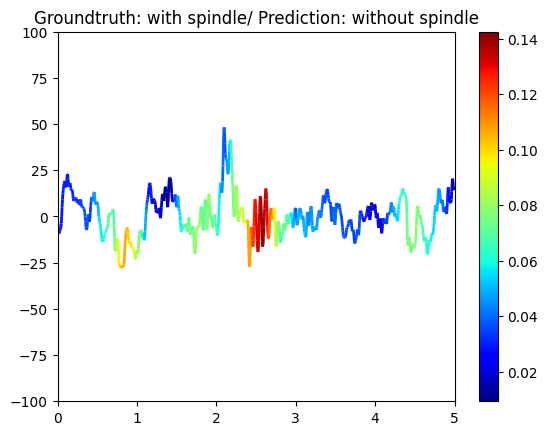

1/1 [==============================] - 0s 20ms/step
flase sample
62


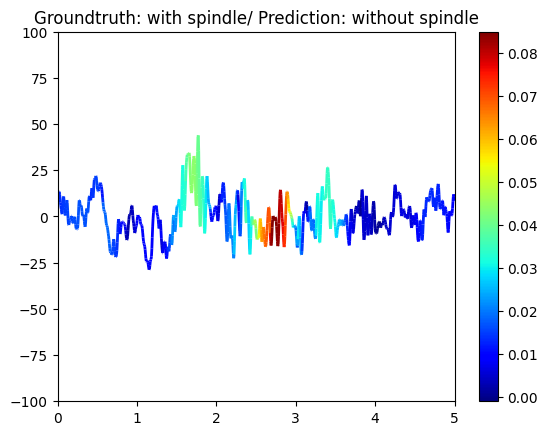

1/1 [==============================] - 0s 20ms/step
flase sample
68


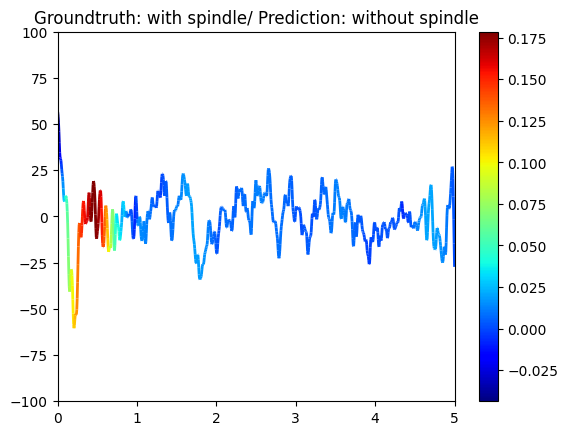

1/1 [==============================] - 0s 20ms/step
flase sample
73


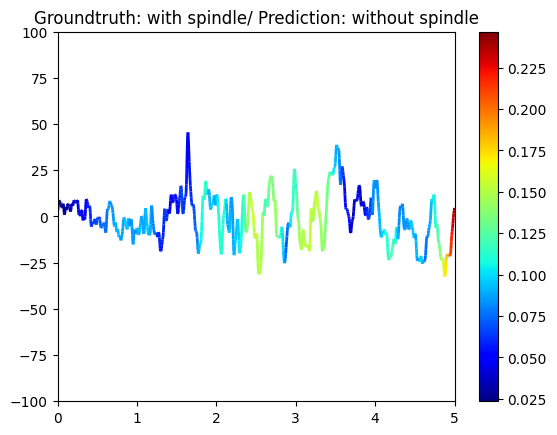

1/1 [==============================] - 0s 20ms/step
flase sample
74


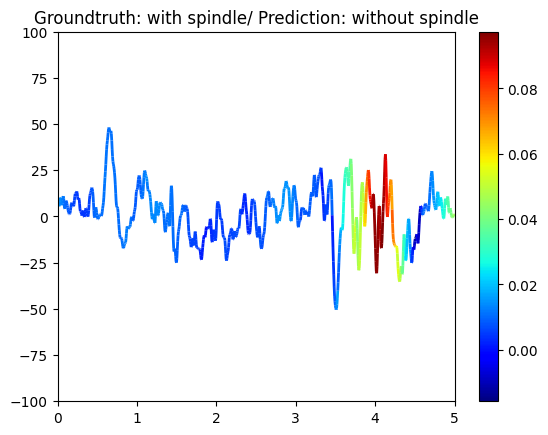

1/1 [==============================] - 0s 21ms/step
flase sample
78


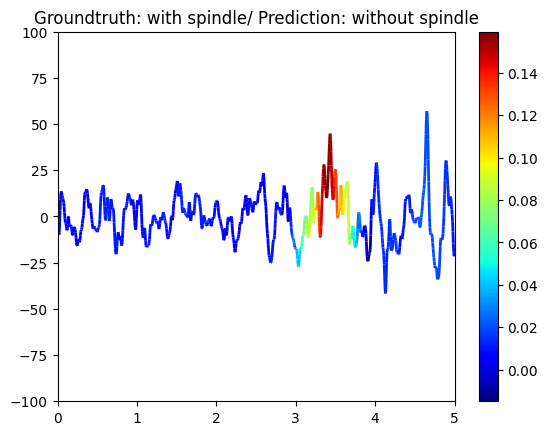

1/1 [==============================] - 0s 19ms/step
true positive sample
79
339.64023941399273
-366.2757752112897


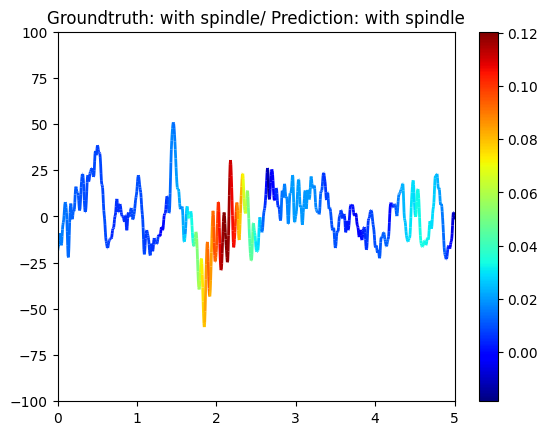

1/1 [==============================] - 0s 20ms/step
flase sample
80


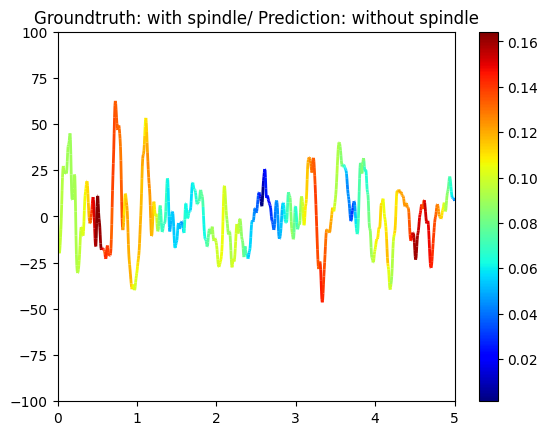

1/1 [==============================] - 0s 20ms/step
flase sample
84


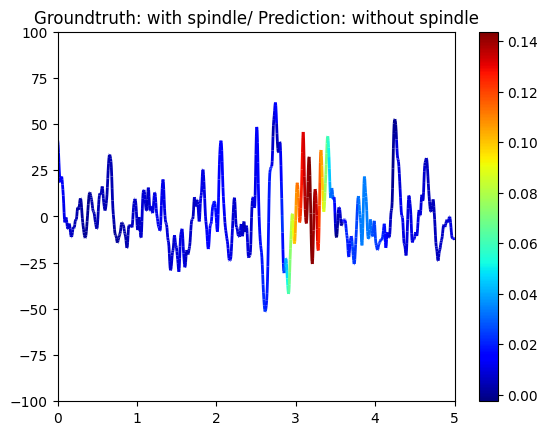

1/1 [==============================] - 0s 21ms/step
true positive sample
87
339.64023941399273
-366.2757752112897


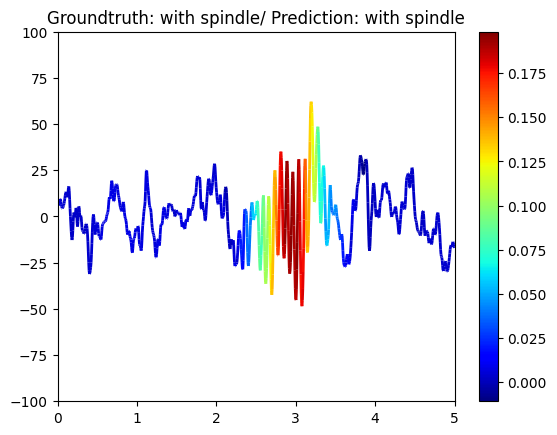

1/1 [==============================] - 0s 21ms/step
true positive sample
88
339.64023941399273
-366.2757752112897


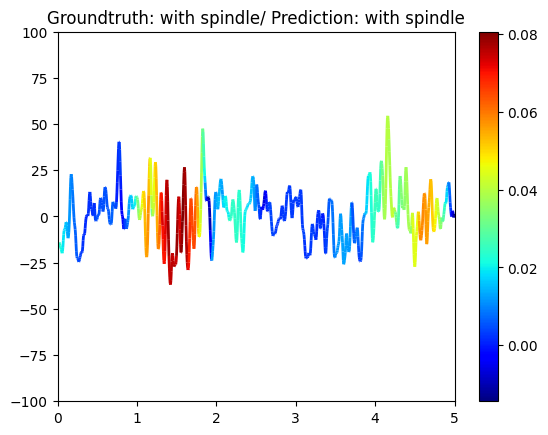

1/1 [==============================] - 0s 21ms/step
flase sample
89


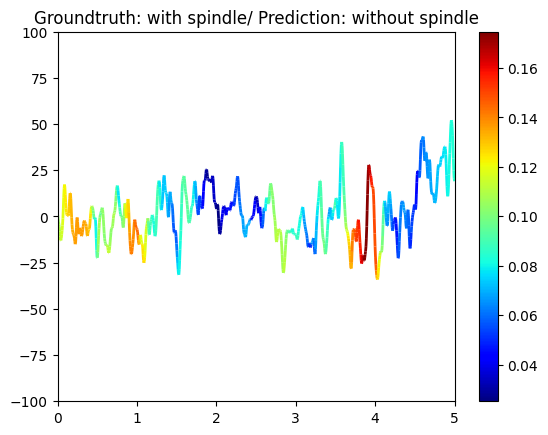

1/1 [==============================] - 0s 20ms/step
flase sample
90


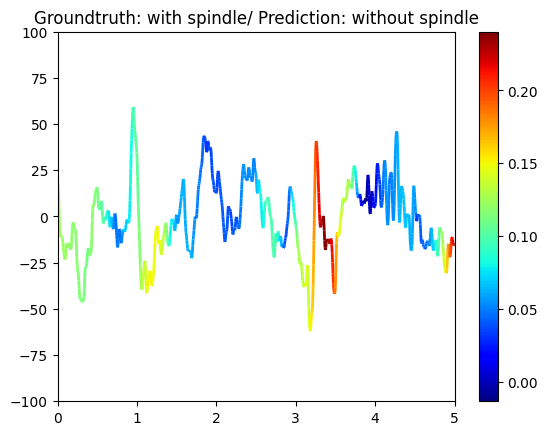

1/1 [==============================] - 0s 20ms/step
flase sample
105


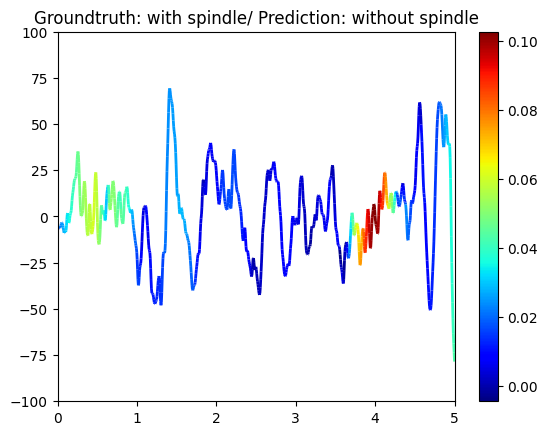

1/1 [==============================] - 0s 21ms/step
flase sample
106


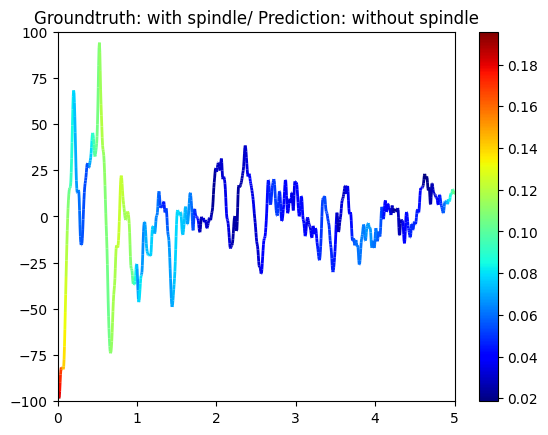

1/1 [==============================] - 0s 20ms/step
flase sample
108


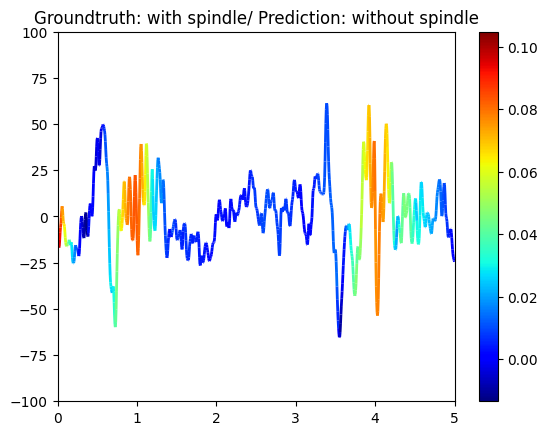

1/1 [==============================] - 0s 19ms/step
flase sample
110


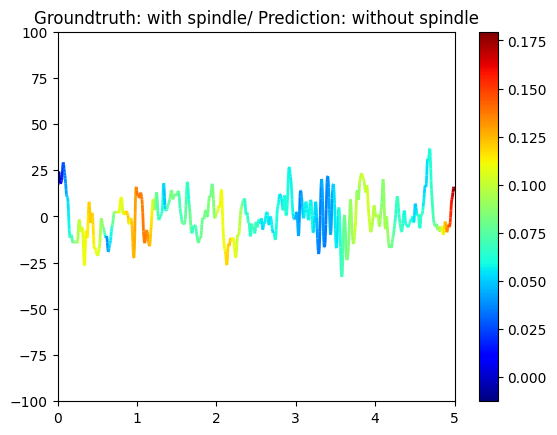

1/1 [==============================] - 0s 31ms/step
flase sample
112


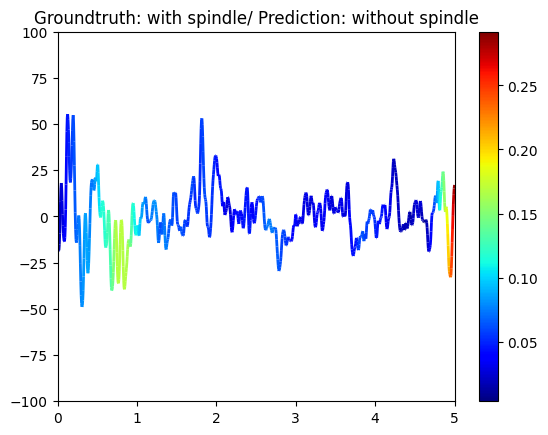

1/1 [==============================] - 0s 29ms/step
flase sample
115


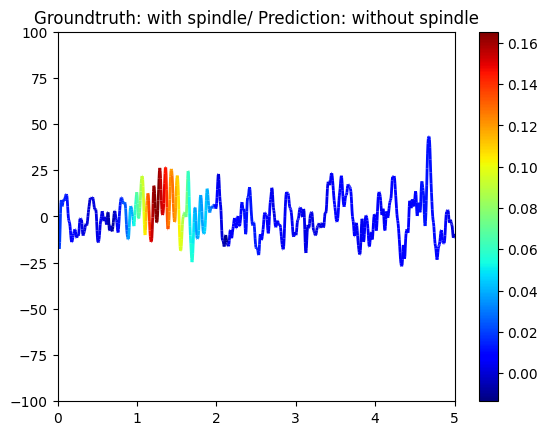

1/1 [==============================] - 0s 30ms/step
flase sample
116


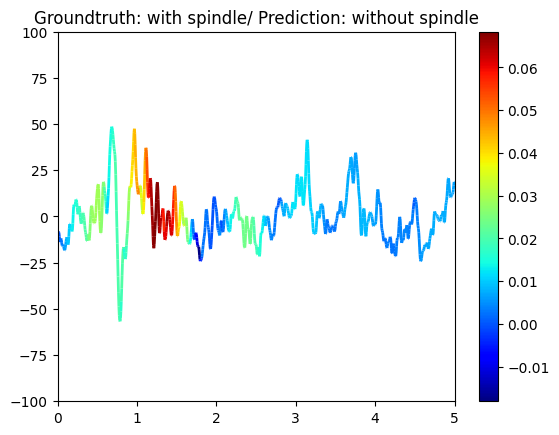

1/1 [==============================] - 0s 19ms/step
flase sample
122


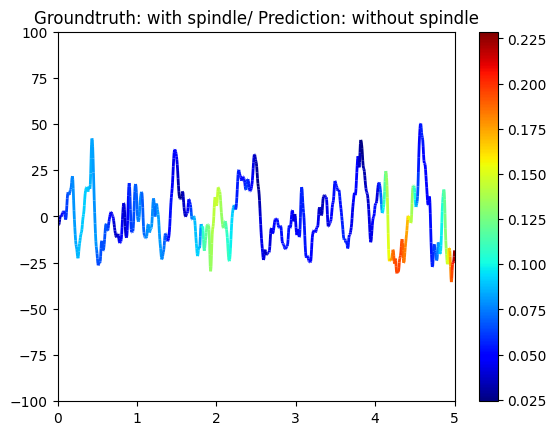

1/1 [==============================] - 0s 20ms/step
flase sample
123


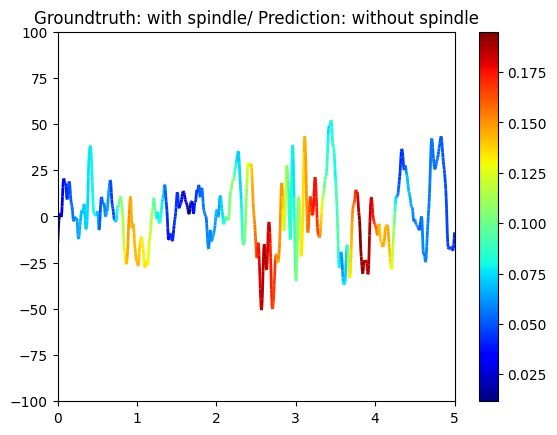

1/1 [==============================] - 0s 20ms/step
true positive sample
126
339.64023941399273
-366.2757752112897


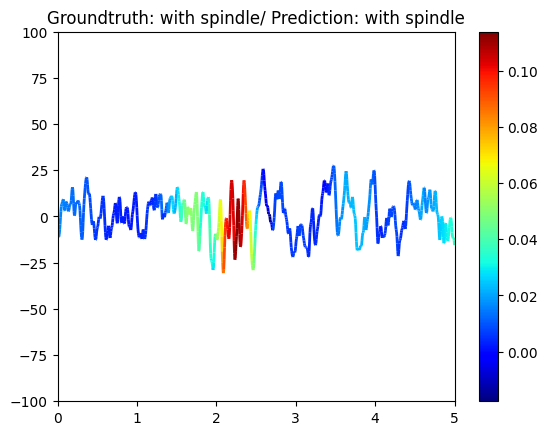

1/1 [==============================] - 0s 20ms/step
flase sample
127


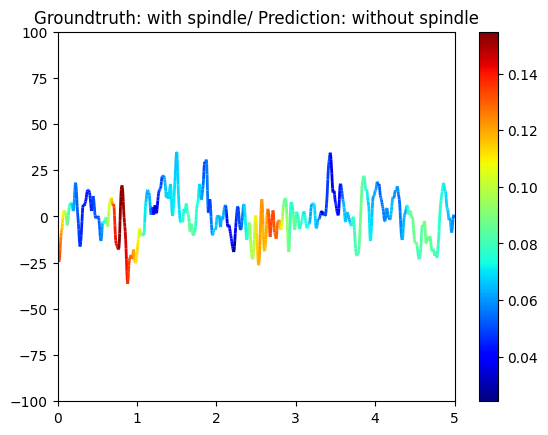

1/1 [==============================] - 0s 21ms/step
true positive sample
130
339.64023941399273
-366.2757752112897


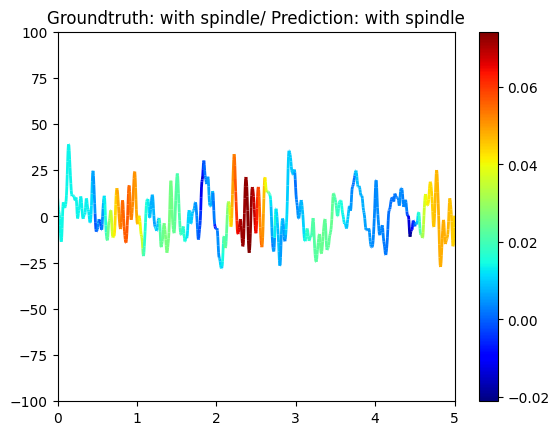

1/1 [==============================] - 0s 19ms/step
true positive sample
131
339.64023941399273
-366.2757752112897


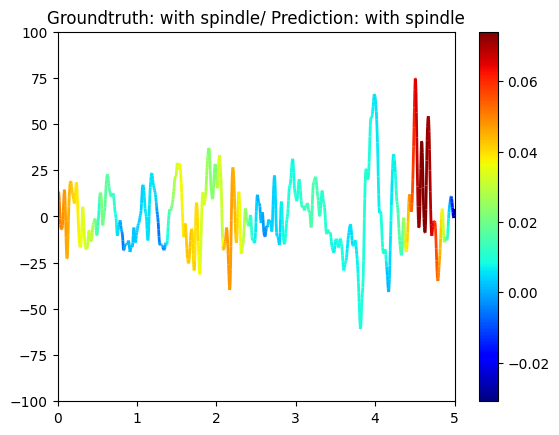

1/1 [==============================] - 0s 21ms/step
true positive sample
133
339.64023941399273
-366.2757752112897


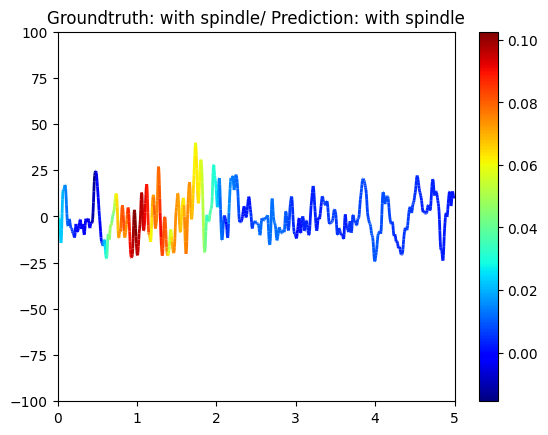

1/1 [==============================] - 0s 20ms/step
true positive sample
135
339.64023941399273
-366.2757752112897


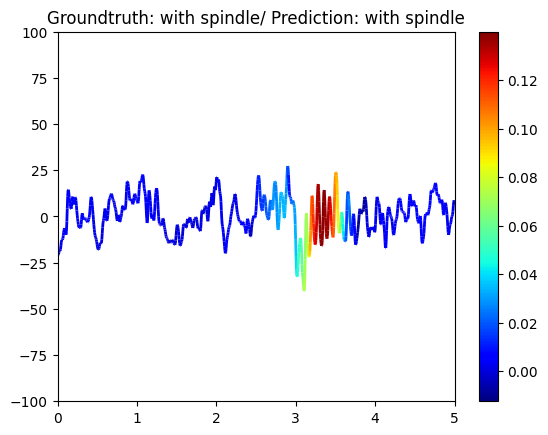

1/1 [==============================] - 0s 21ms/step
flase sample
137


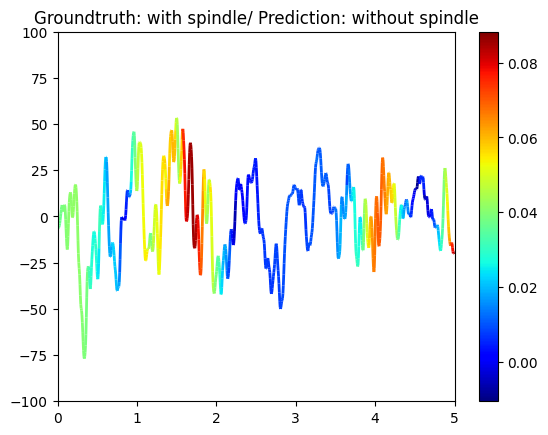

1/1 [==============================] - 0s 22ms/step
true positive sample
138
339.64023941399273
-366.2757752112897


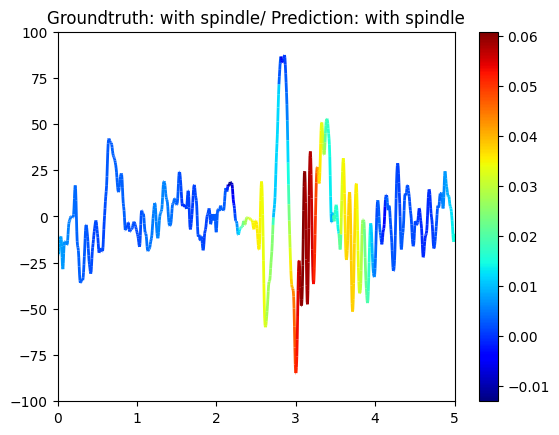

1/1 [==============================] - 0s 19ms/step
flase sample
140


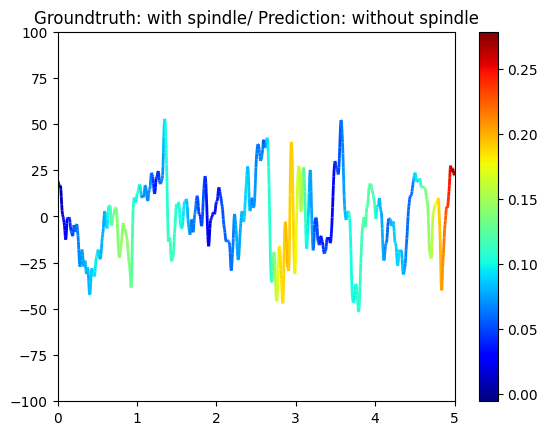

1/1 [==============================] - 0s 20ms/step
flase sample
141


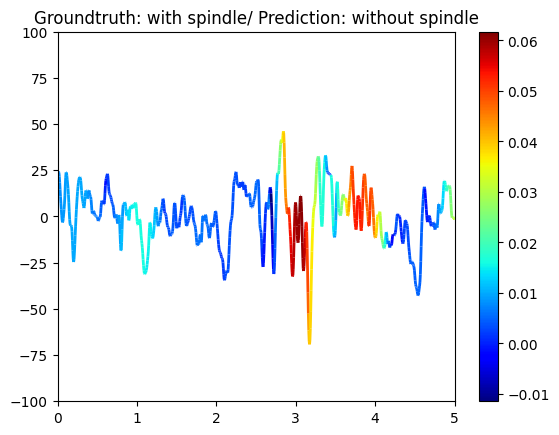

1/1 [==============================] - 0s 19ms/step
flase sample
144


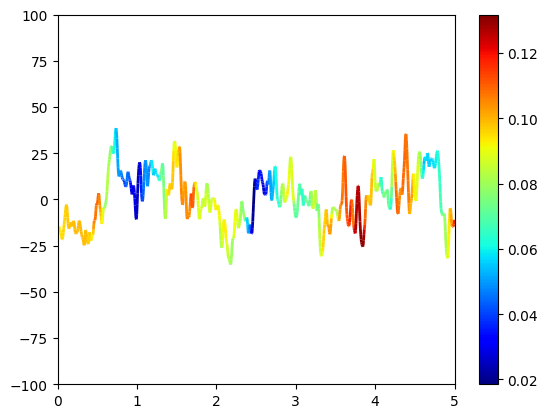

1/1 [==============================] - 0s 21ms/step
flase sample
145


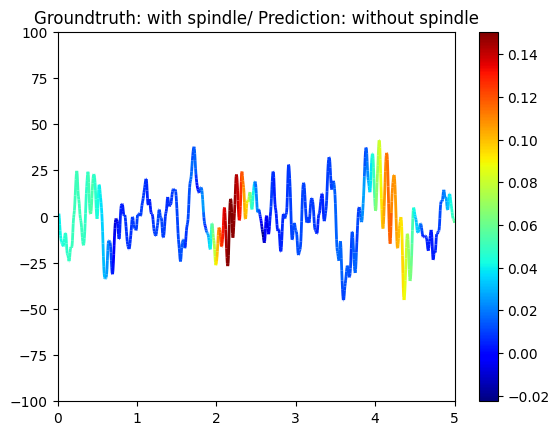

1/1 [==============================] - 0s 23ms/step
flase sample
147


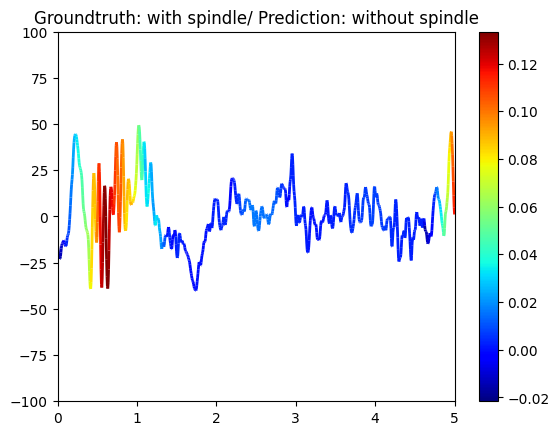

1/1 [==============================] - 0s 21ms/step
flase sample
148


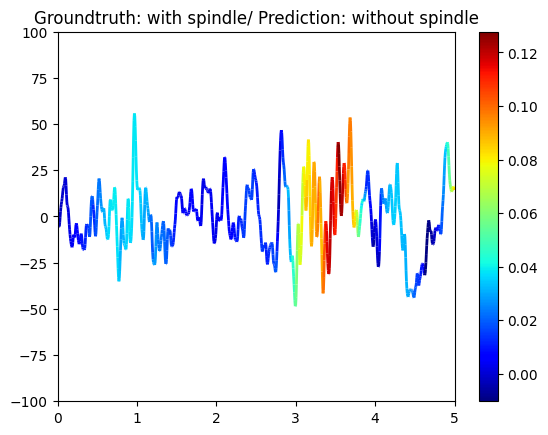

1/1 [==============================] - 0s 18ms/step
flase sample
159


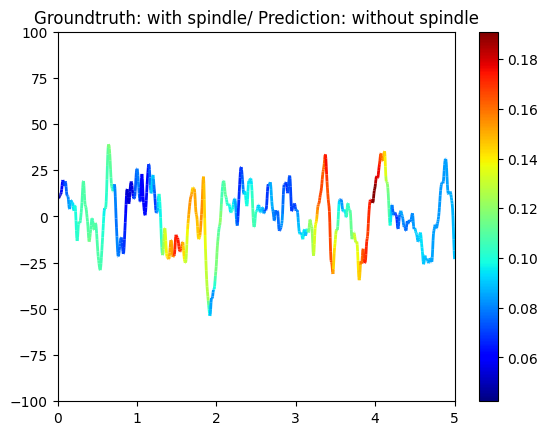

1/1 [==============================] - 0s 20ms/step
true positive sample
162
339.64023941399273
-366.2757752112897


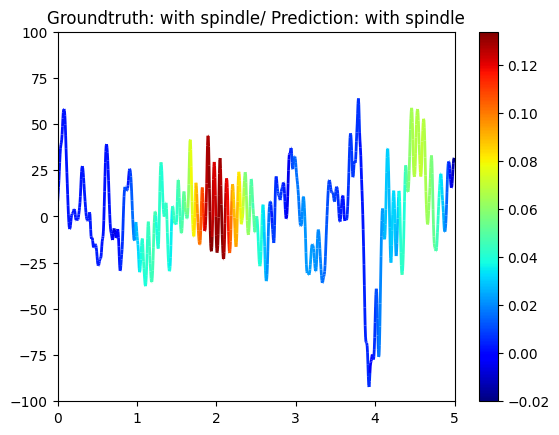

1/1 [==============================] - 0s 22ms/step
flase sample
164


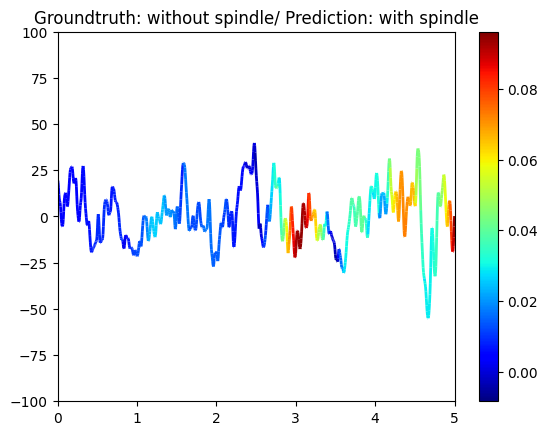

1/1 [==============================] - 0s 19ms/step
flase sample
165


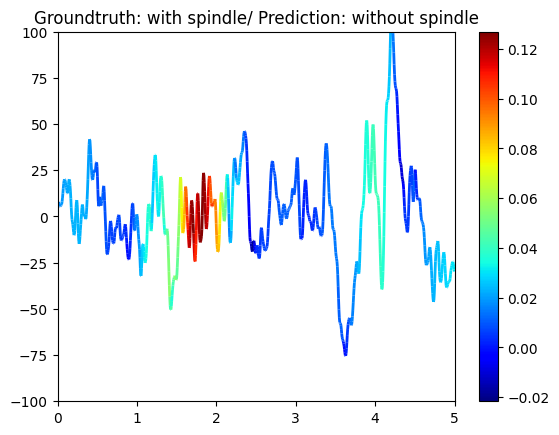

1/1 [==============================] - 0s 20ms/step
flase sample
166


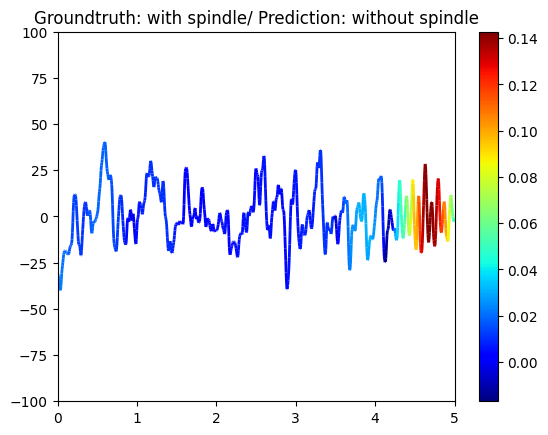

1/1 [==============================] - 0s 19ms/step
flase sample
167


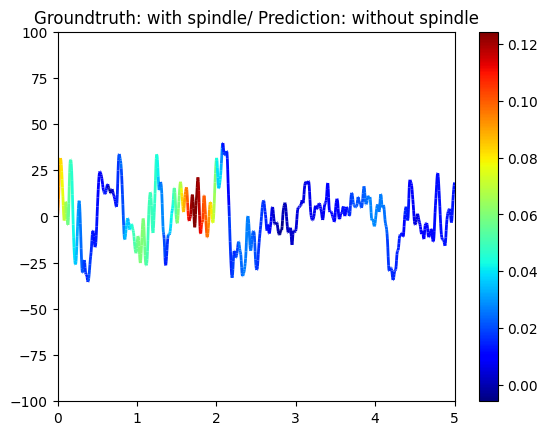

1/1 [==============================] - 0s 22ms/step
true positive sample
169
339.64023941399273
-366.2757752112897


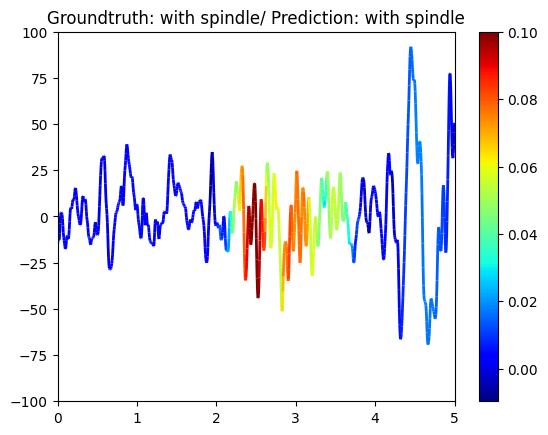

1/1 [==============================] - 0s 19ms/step
flase sample
178


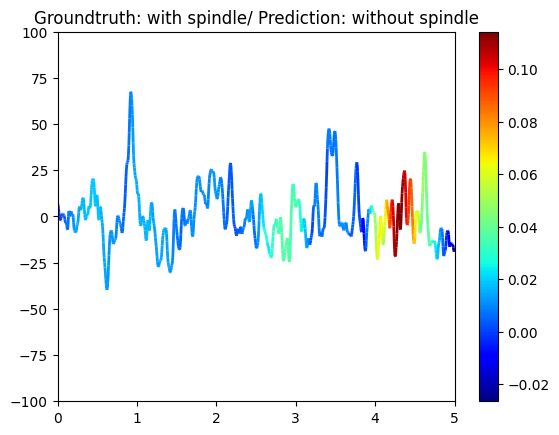

1/1 [==============================] - 0s 20ms/step
flase sample
179


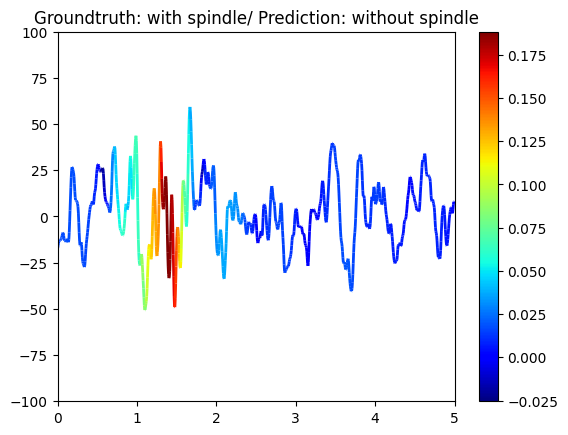

1/1 [==============================] - 0s 24ms/step
flase sample
185


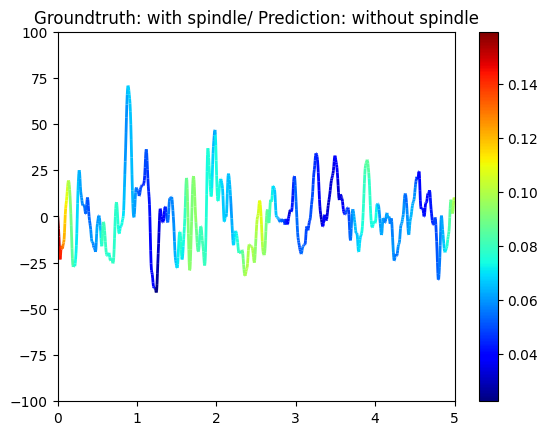

1/1 [==============================] - 0s 23ms/step
true positive sample
192
339.64023941399273
-366.2757752112897


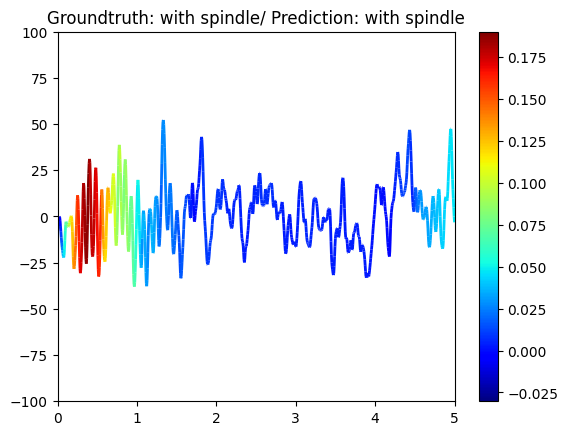

1/1 [==============================] - 0s 19ms/step
flase sample
195


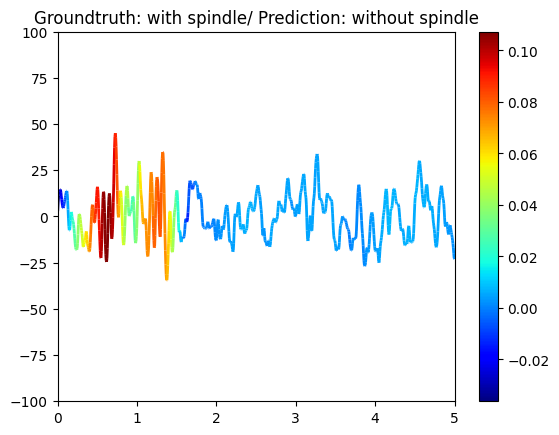

1/1 [==============================] - 0s 19ms/step
flase sample
198


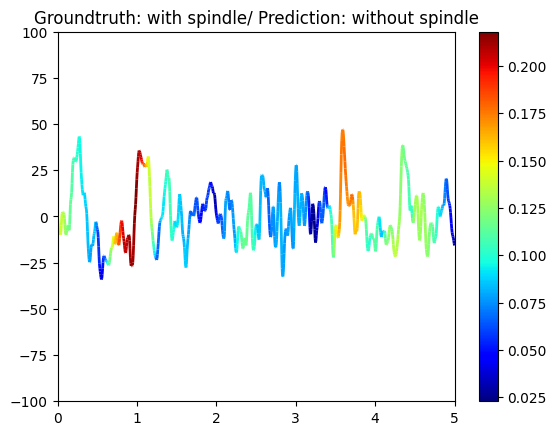

1/1 [==============================] - 0s 20ms/step


In [26]:
# 1d-cnn grad-cam for raw data (no augment & shuffle)
from tensorflow.keras import models
import tensorflow.keras.backend as K
import cv2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm

from scipy.signal import savgol_filter

last_conv_layer = model.get_layer(index=-6)
heatmap_model = models.Model([model.input], [last_conv_layer.output, model.output])

for i in range(0,200):
    preds = model.predict(original_eeg[i:i+1,:,:])
    pred_class = np.argmax(preds)
    if((pred_class == original_eeg_labels_int[i]) and (original_eeg_labels_int[i]==1)):
        print("true positive sample")
        print(i)
        with tf.GradientTape() as gtape:
            conv_output, Predictions = heatmap_model(after_z_tranform_eeg[i:i+1,:,:])
            prob = Predictions[:, np.argmax(Predictions[0])]
            grads = gtape.gradient(prob, conv_output)
            pooled_grads = K.mean(grads, axis=(0,1)) 


        heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
        heatmap = np.maximum(heatmap,0)
        max_heat = np.max(heatmap)
        if max_heat == 0:
            max_heat = 1e-10
        heatmap /= max_heat


        heatmap1 = cv2.resize(heatmap,(1000,1), interpolation=cv2.INTER_CUBIC)
        # print(heatmap1.shape)
        heatmap_weight = heatmap1[0]
#         print(heatmap_weight)


#         solve the trivial problem: smooth the heatmap_weight value
        heatmap_weight = savgol_filter(heatmap_weight, 151, 2)
        
        



        time = np.linspace(0, 5, 1000)
        print(original_eeg.max())
        print(original_eeg.min())
        EEG = original_eeg[i,:,0]#SELECT DATA

        EEG_points = np.array([time, EEG]).T.reshape(-1, 1, 2)
#         print(EEG_points.shape)
        EEG_segments = np.concatenate([EEG_points[:-1], EEG_points[1:]], axis=1)
#         print(EEG_segments.shape)

        fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

        # Create a continuous norm to map from data points to colors
        norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
        EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
#         print(EEG_lc)
        # Set the values used for colormapping
        EEG_lc.set_array(heatmap_weight)
        EEG_lc.set_linewidth(2)
        EEG_line = axs.add_collection(EEG_lc)
        fig.colorbar(EEG_line, ax=axs)

        axs.set_xlim(time.min(), time.max())
        axs.set_ylim(-100, 100)

        if(pred_class==1):
            if(original_eeg_labels_int[i]==1):
                plt.title('Groundtruth: with spindle/ Prediction: with spindle')
            elif(original_eeg_labels_int[i]==0):
                plt.title('Groundtruth: without spindle/ Prediction: with spindle')
        elif(pred_class==0):
            if(original_eeg_labels_int[i]==1):
                plt.title('Groundtruth: with spindle/ Prediction: without spindle')
            elif(original_eeg_labels_int[i]==0):
                plt.title('Groundtruth: without spindle/ Prediction: without spindle')

        plt.show()   
    elif(pred_class != original_eeg_labels_int[i]):
        print("flase sample")
        print(i)
        with tf.GradientTape() as gtape:
            conv_output, Predictions = heatmap_model(after_z_tranform_eeg[i:i+1,:,:])
            prob = Predictions[:, np.argmax(Predictions[0])]
            grads = gtape.gradient(prob, conv_output)
            pooled_grads = K.mean(grads, axis=(0,1)) 


        heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
        heatmap = np.maximum(heatmap,0)
        max_heat = np.max(heatmap)
        if max_heat == 0:
            max_heat = 1e-10
        heatmap /= max_heat


        heatmap1 = cv2.resize(heatmap,(1000,1), interpolation=cv2.INTER_CUBIC)
        # print(heatmap1.shape)
        heatmap_weight = heatmap1[0]
        # print(heatmap_weight.shape)
        
        #         solve the trivial problem: smooth the heatmap_weight value
        heatmap_weight = savgol_filter(heatmap_weight, 151, 2)


        time = np.linspace(0, 5, 1000)
        EEG = original_eeg[i,:,0]#SELECT DATA

        EEG_points = np.array([time, EEG]).T.reshape(-1, 1, 2)
        EEG_segments = np.concatenate([EEG_points[:-1], EEG_points[1:]], axis=1)

        fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

        # Create a continuous norm to map from data points to colors
        norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
        EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
        # Set the values used for colormapping
        EEG_lc.set_array(heatmap_weight)
        EEG_lc.set_linewidth(2)
        EEG_line = axs.add_collection(EEG_lc)
        fig.colorbar(EEG_line, ax=axs)

        axs.set_xlim(time.min(), time.max())
        axs.set_ylim(-100, 100)

        if(pred_class==1):
            if(original_eeg_labels_int[i]==1):
                plt.title('Groundtruth: with spindle/ Prediction: with spindle')
            elif(test_labels[i]==0):
                plt.title('Groundtruth: without spindle/ Prediction: with spindle')
        elif(pred_class==0):
            if(original_eeg_labels_int[i]==1):
                plt.title('Groundtruth: with spindle/ Prediction: without spindle')
            elif(original_eeg_labels_int[i]==0):
                plt.title('Groundtruth: without spindle/ Prediction: without spindle')

        plt.show()

1/1 [==============================] - 0s 26ms/step
flase sample


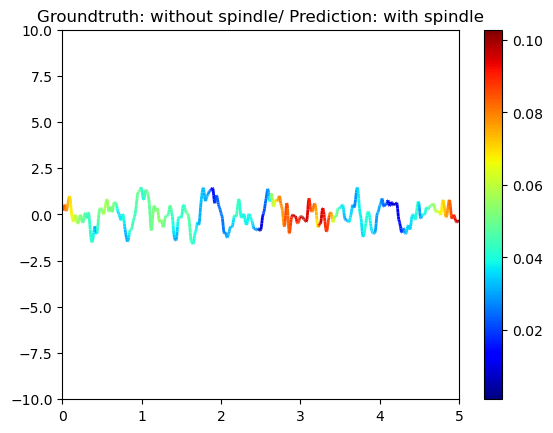

1/1 [==============================] - 0s 25ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


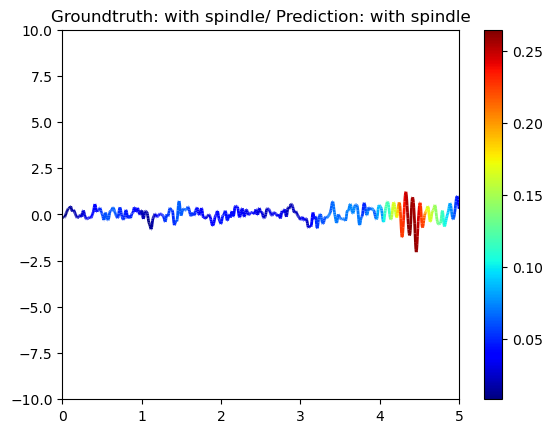

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


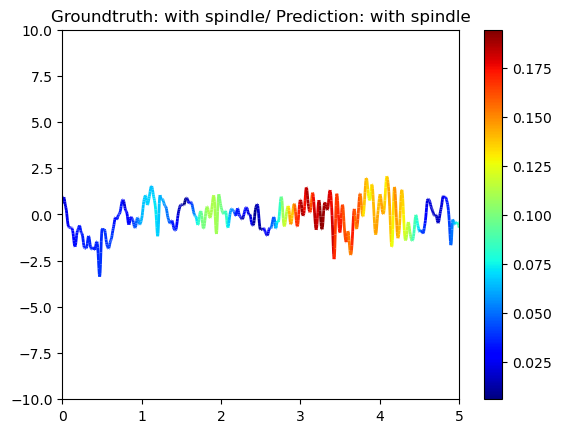

1/1 [==============================] - 0s 25ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


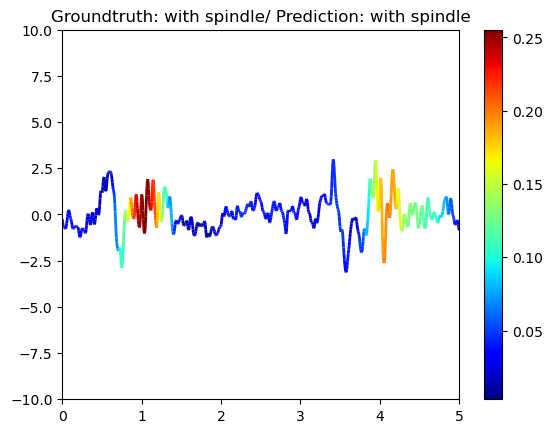

1/1 [==============================] - 0s 25ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


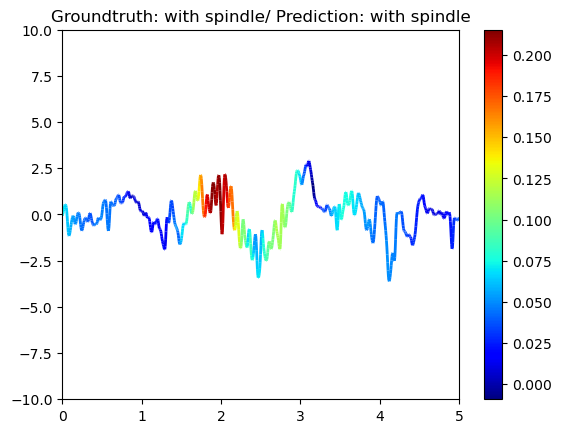

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


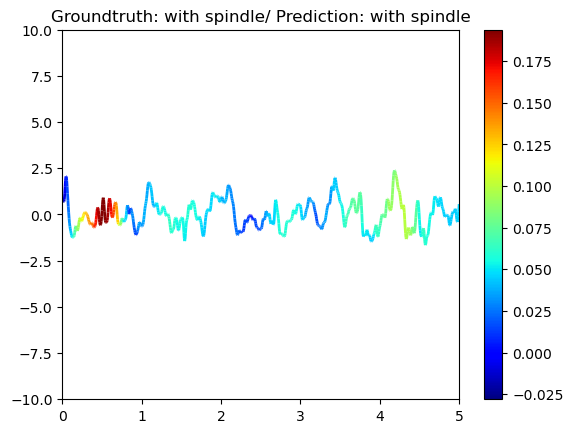

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


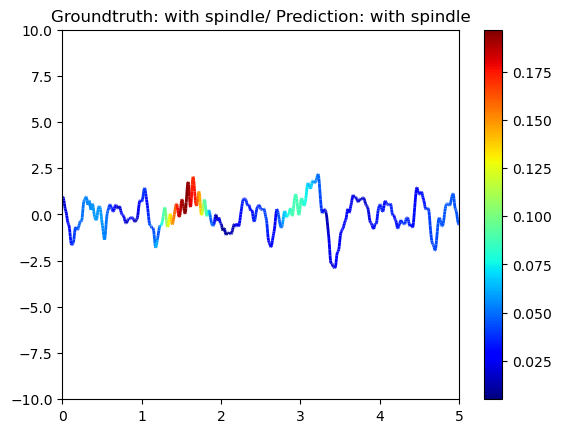

1/1 [==============================] - 0s 23ms/step
flase sample


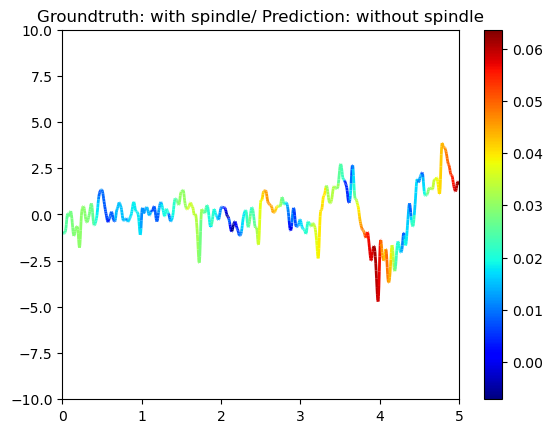

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


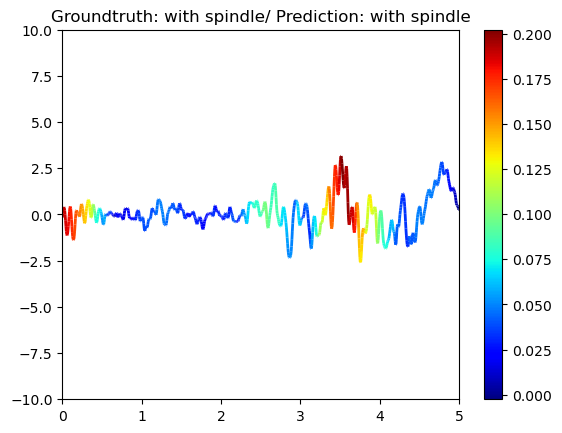

1/1 [==============================] - 0s 22ms/step
flase sample


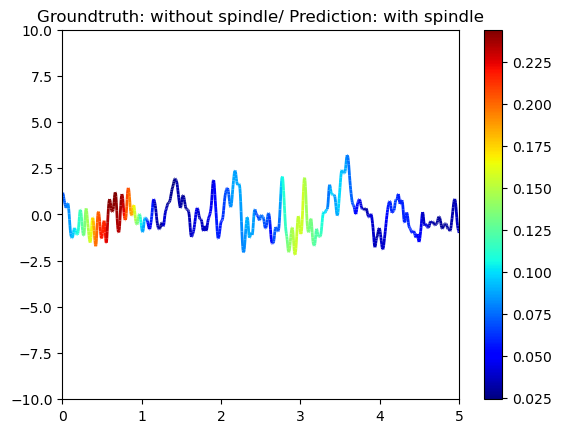

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


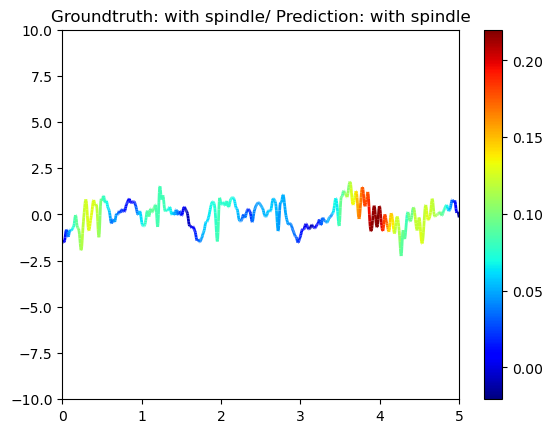

1/1 [==============================] - 0s 24ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


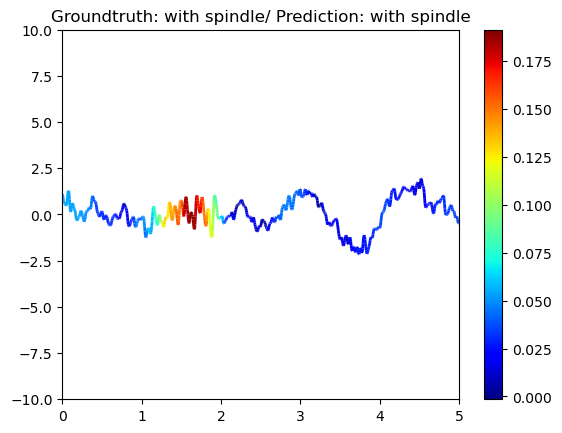

1/1 [==============================] - 0s 21ms/step
flase sample


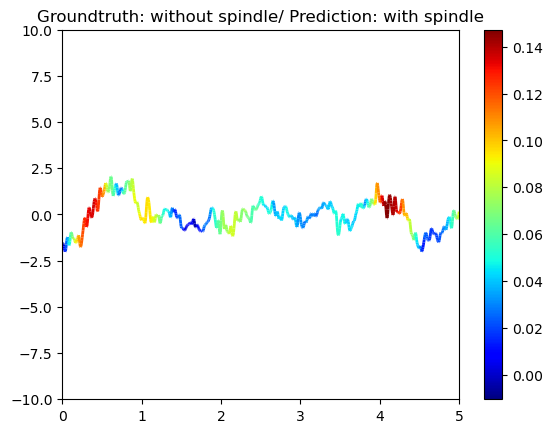

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


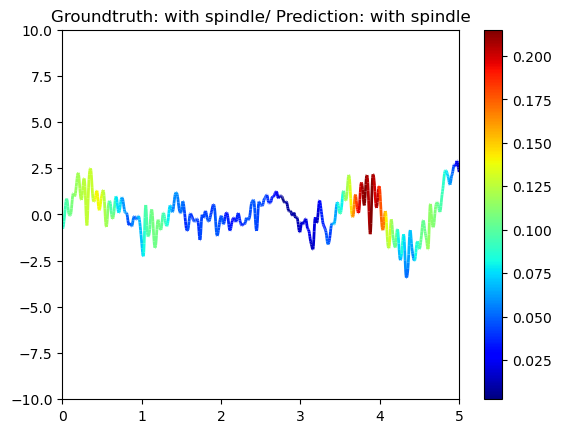

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


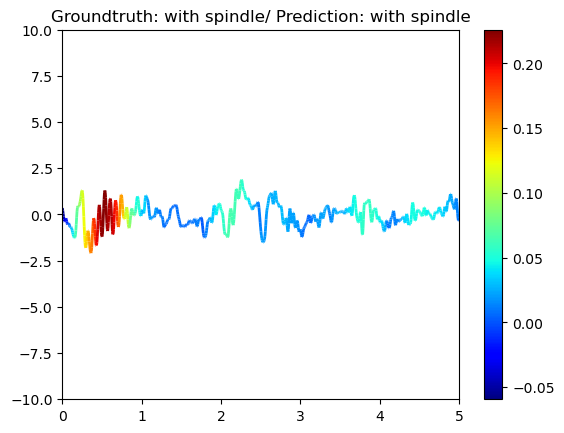

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


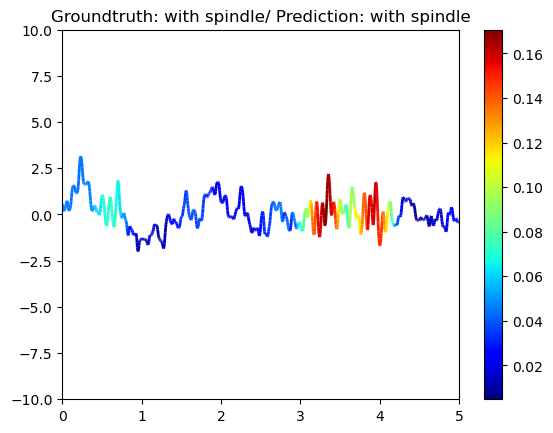

1/1 [==============================] - 0s 25ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


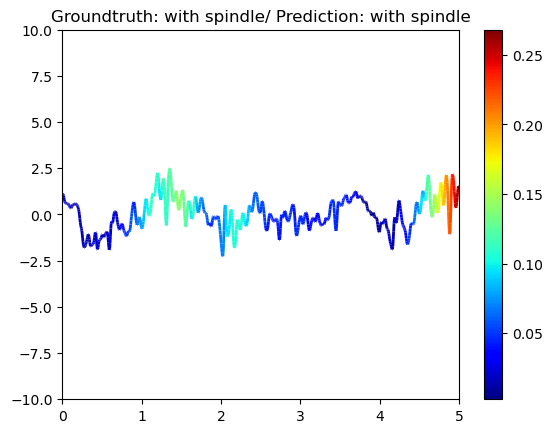

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


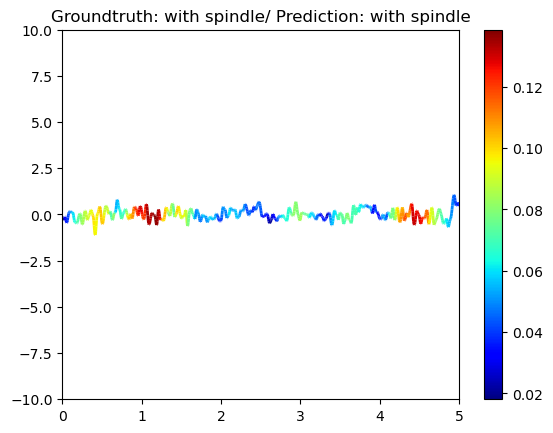

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


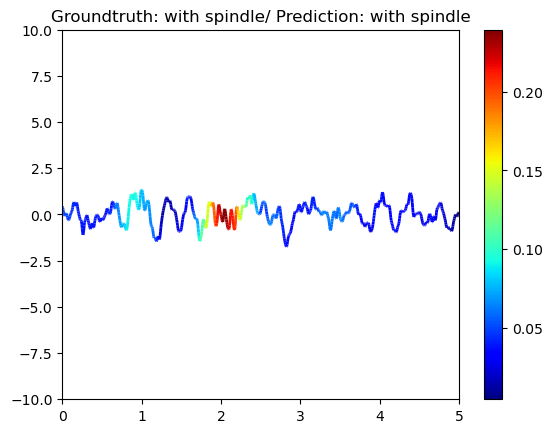

1/1 [==============================] - 0s 21ms/step
flase sample


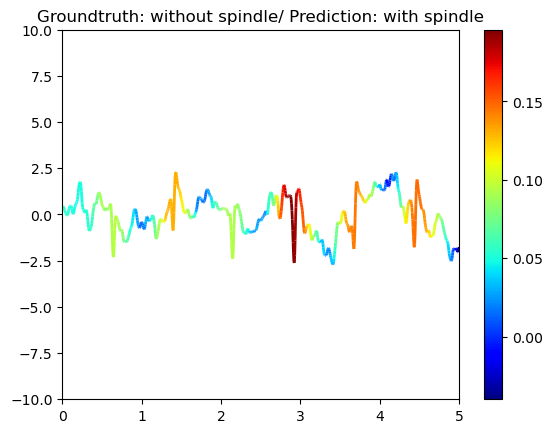

1/1 [==============================] - 0s 21ms/step
flase sample


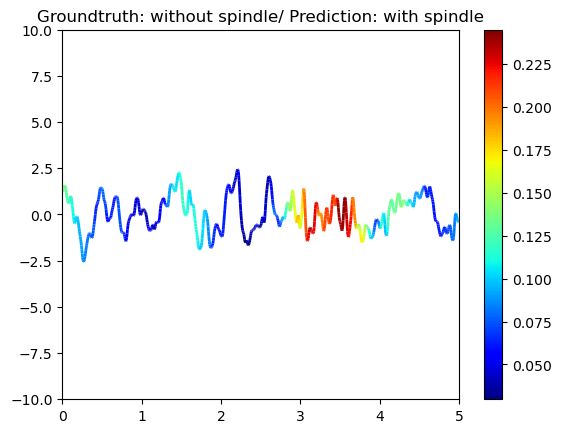

1/1 [==============================] - 0s 20ms/step
flase sample


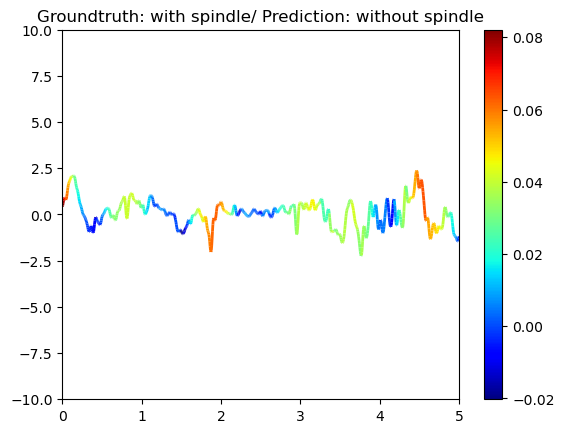

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


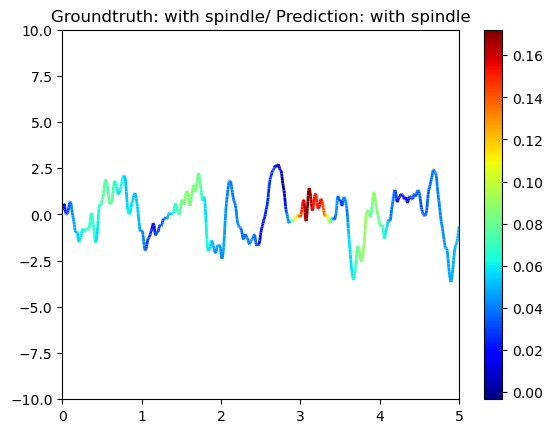

1/1 [==============================] - 0s 20ms/step
flase sample


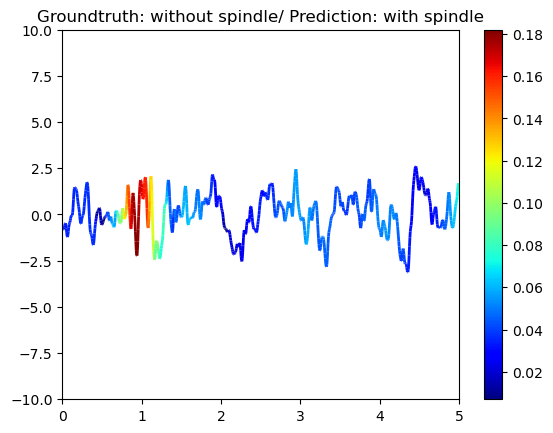

1/1 [==============================] - 0s 22ms/step
flase sample


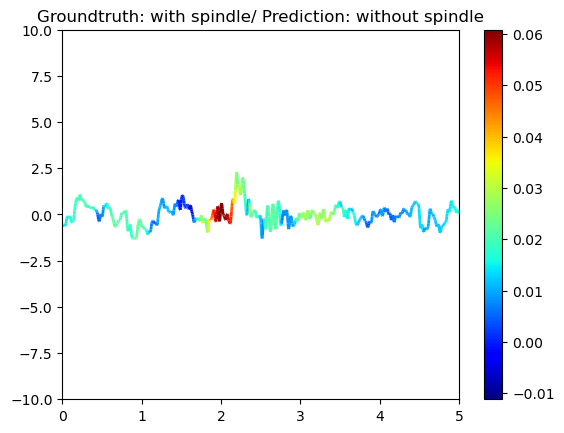

1/1 [==============================] - 0s 21ms/step
flase sample


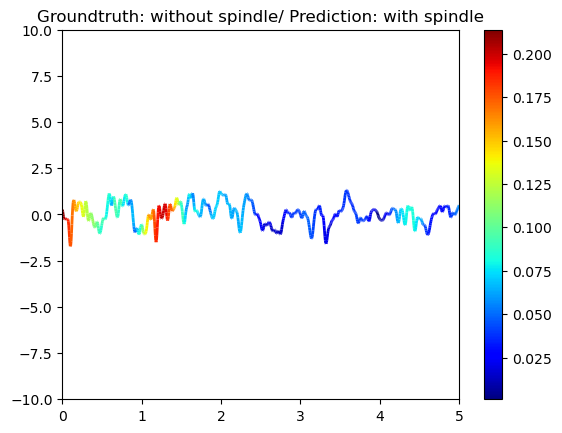

1/1 [==============================] - 0s 19ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


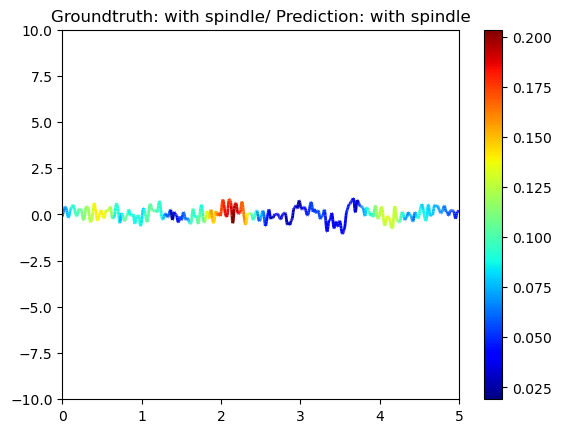

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


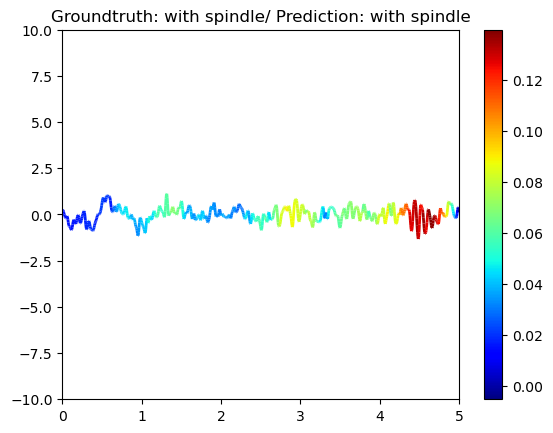

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


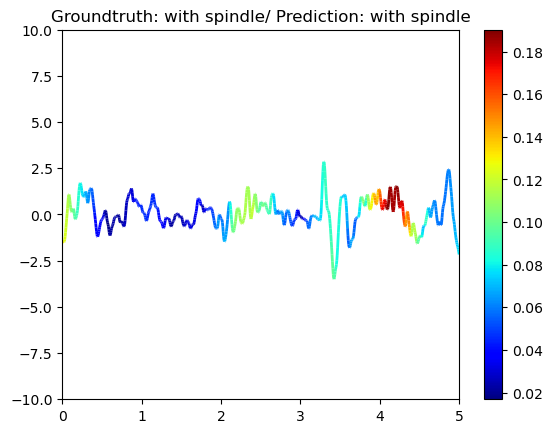

1/1 [==============================] - 0s 21ms/step
flase sample


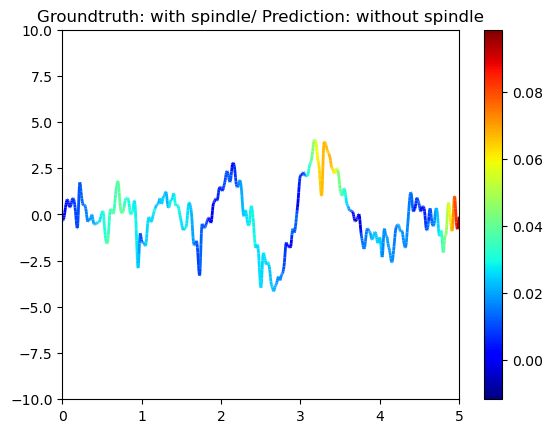

1/1 [==============================] - 0s 20ms/step
flase sample


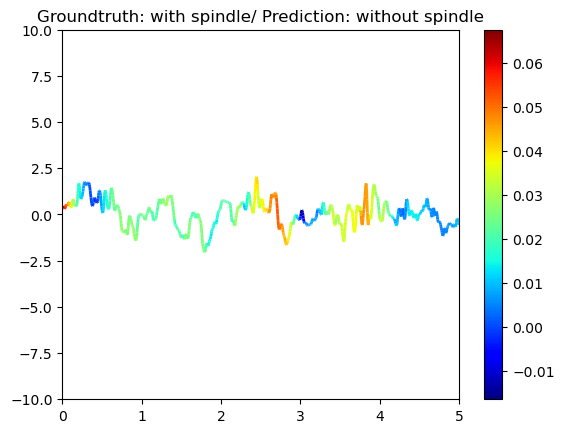

1/1 [==============================] - 0s 46ms/step
flase sample


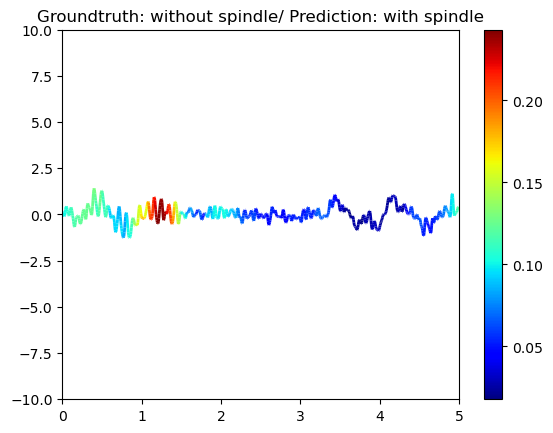

1/1 [==============================] - 0s 30ms/step
flase sample


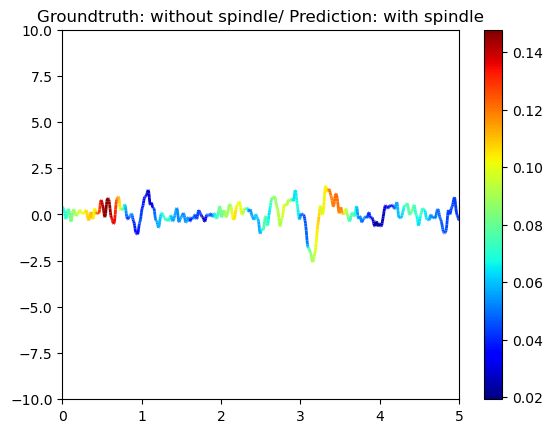

1/1 [==============================] - 0s 35ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


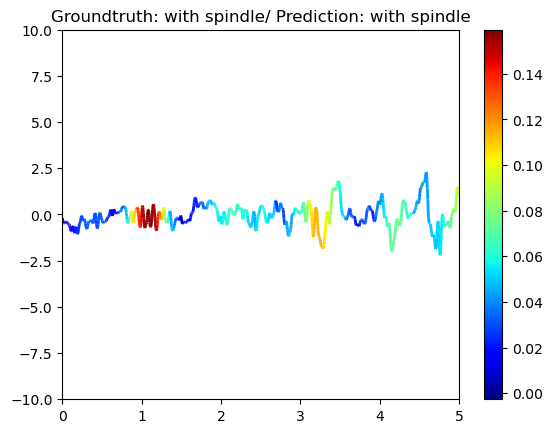

1/1 [==============================] - 0s 21ms/step
flase sample


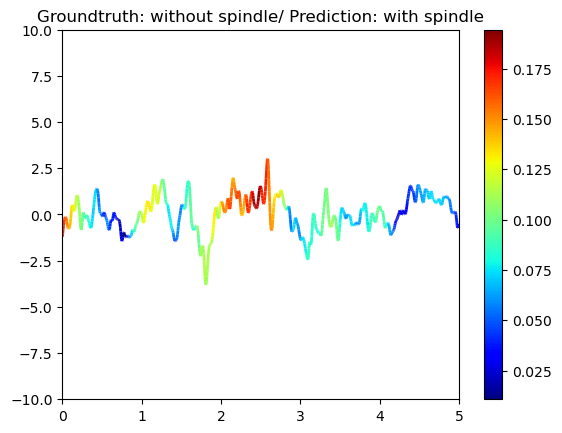

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


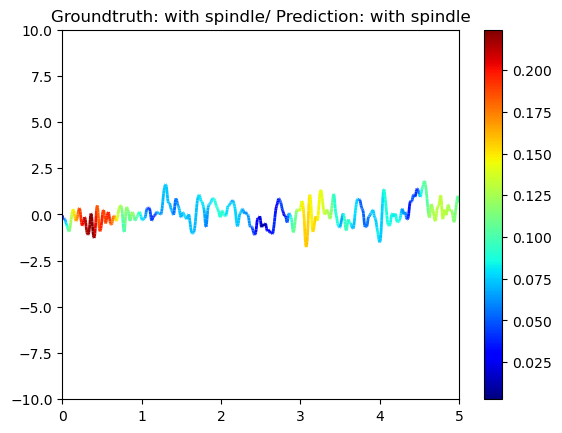

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


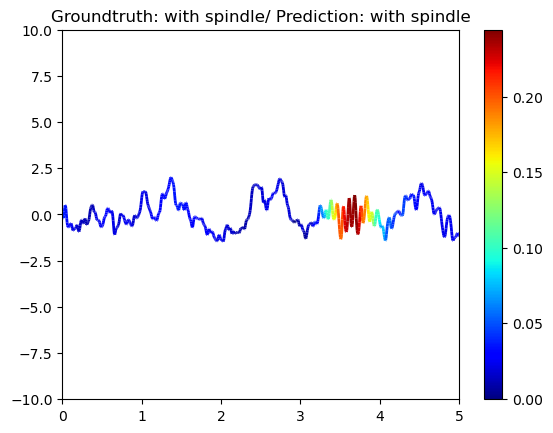

1/1 [==============================] - 0s 24ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


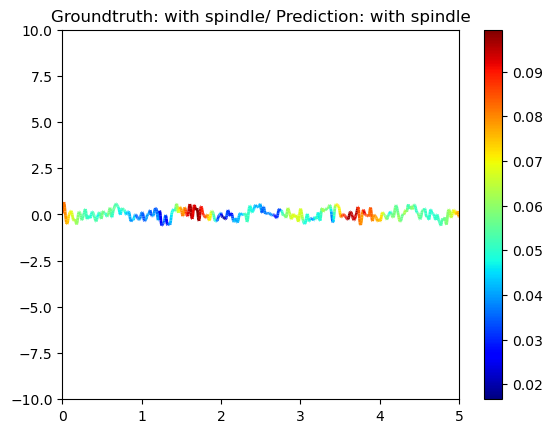

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


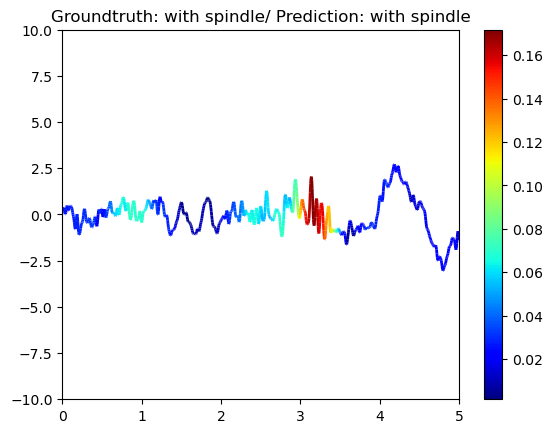

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


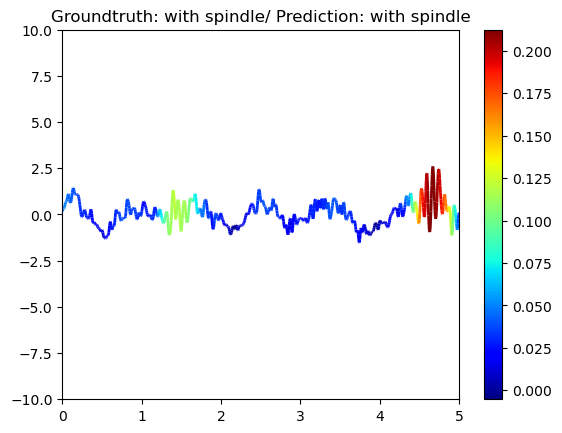

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


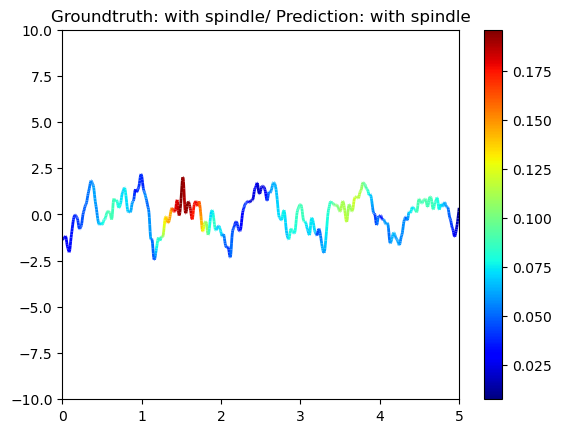

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


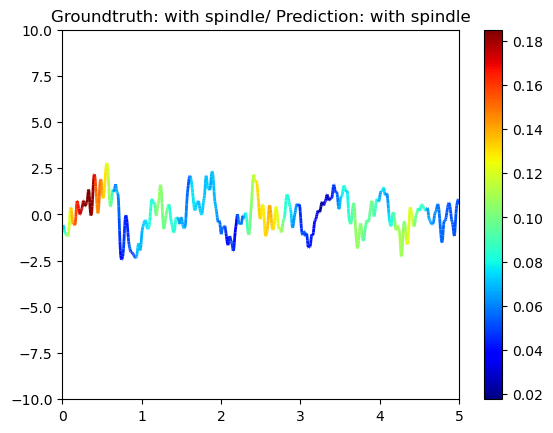

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


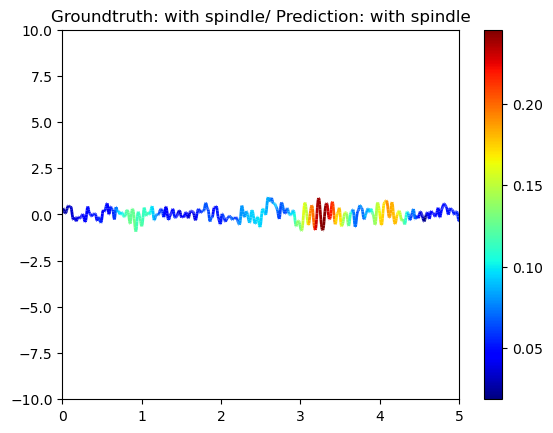

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


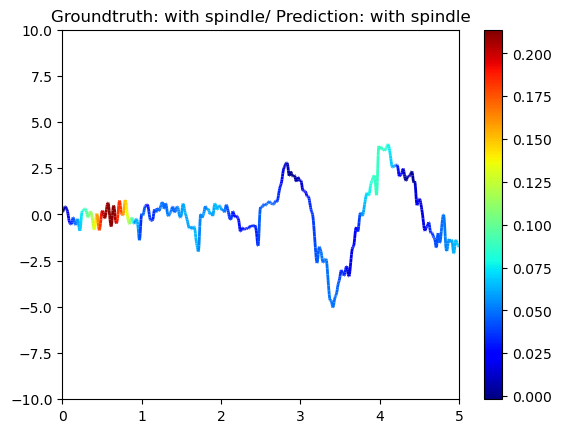

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


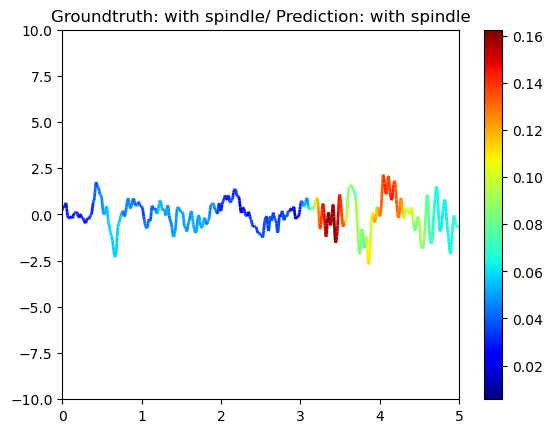

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


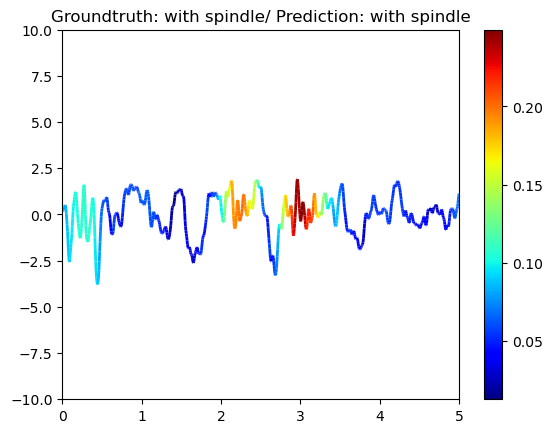

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


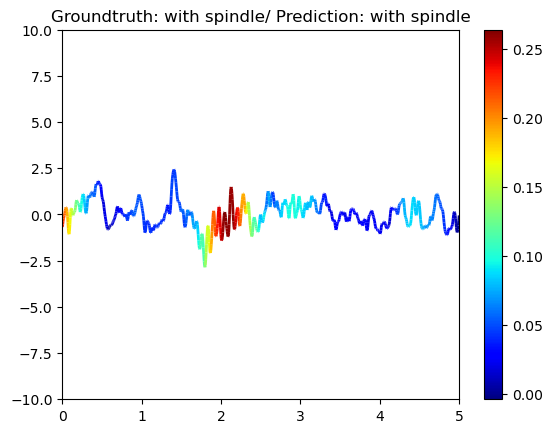

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


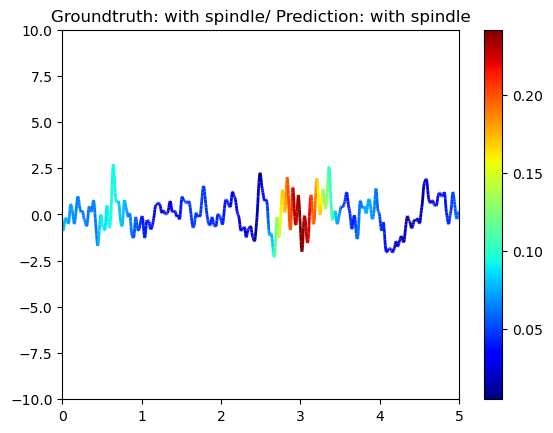

1/1 [==============================] - 0s 20ms/step
flase sample


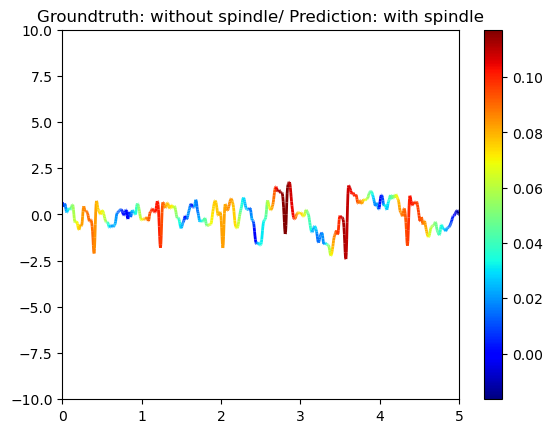

1/1 [==============================] - 0s 22ms/step
flase sample


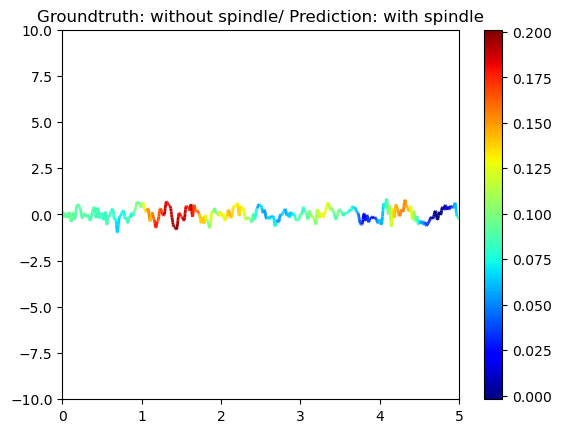

1/1 [==============================] - 0s 38ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


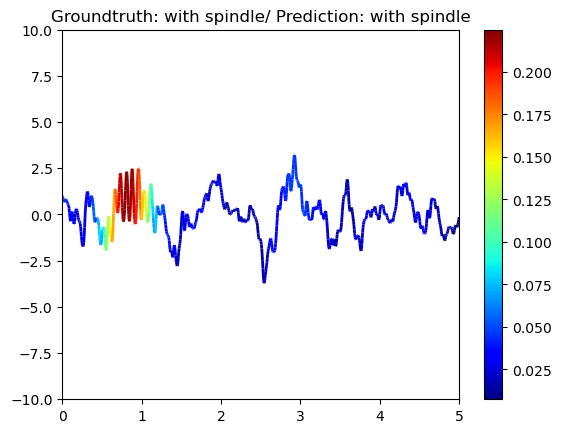

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


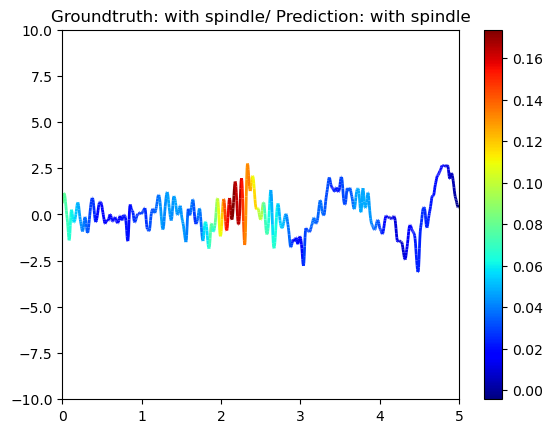

1/1 [==============================] - 0s 21ms/step
flase sample


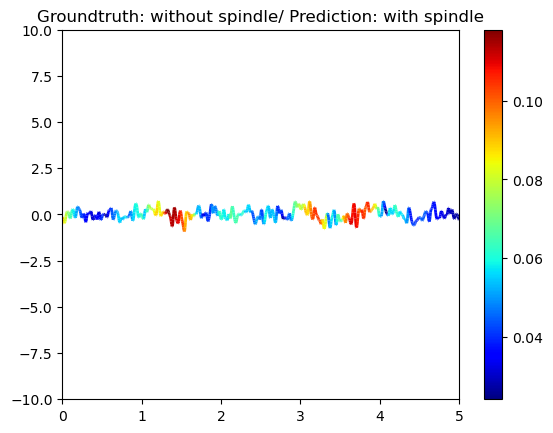

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


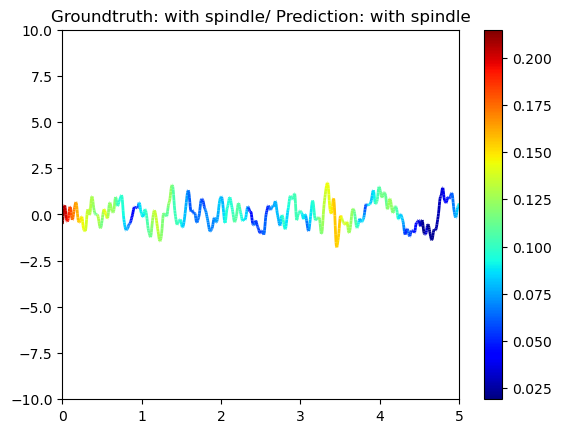

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


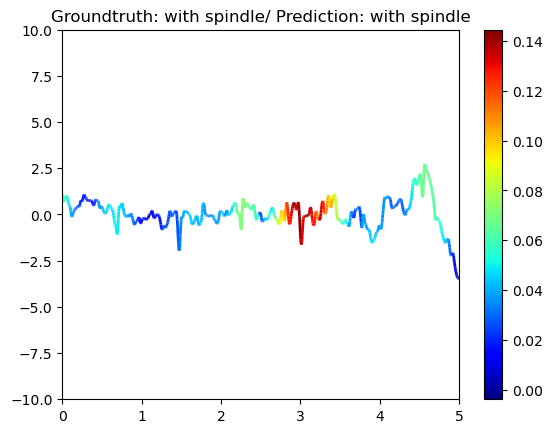

1/1 [==============================] - 0s 20ms/step
flase sample


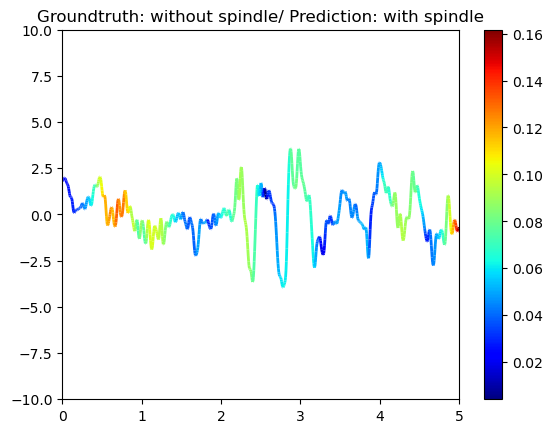

1/1 [==============================] - 0s 21ms/step
flase sample


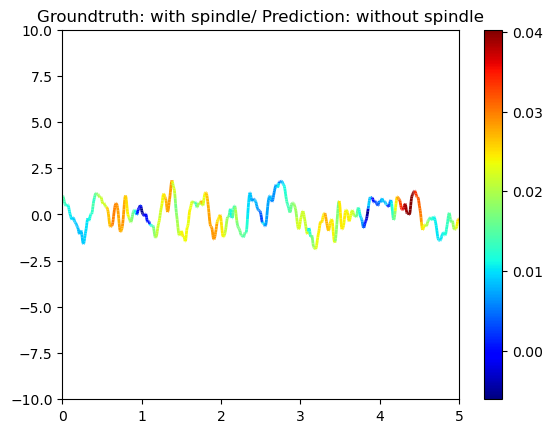

1/1 [==============================] - 0s 26ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


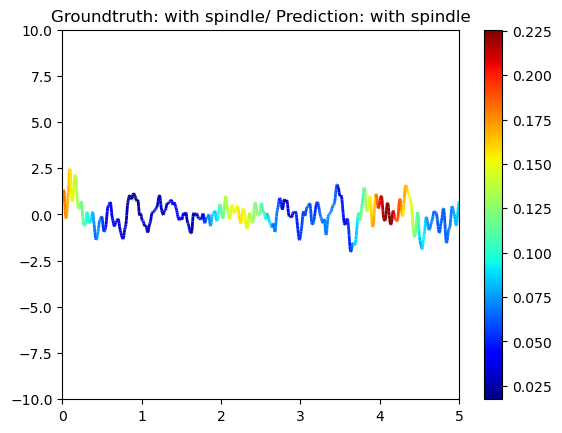

1/1 [==============================] - 0s 25ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


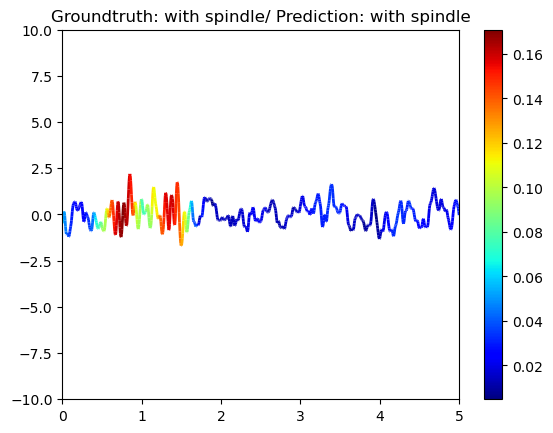

1/1 [==============================] - 0s 25ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


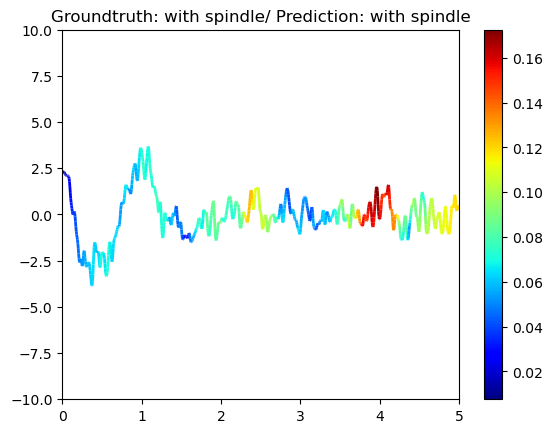

1/1 [==============================] - 0s 24ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


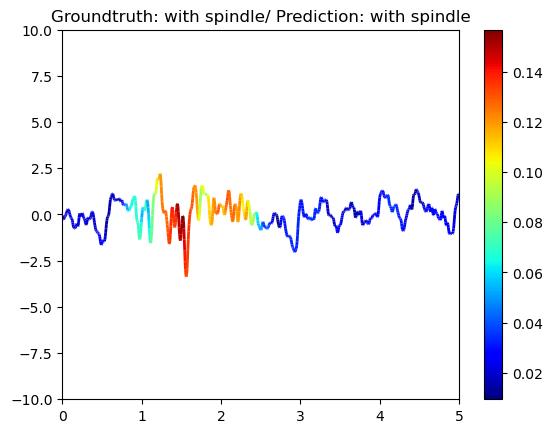

1/1 [==============================] - 0s 26ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


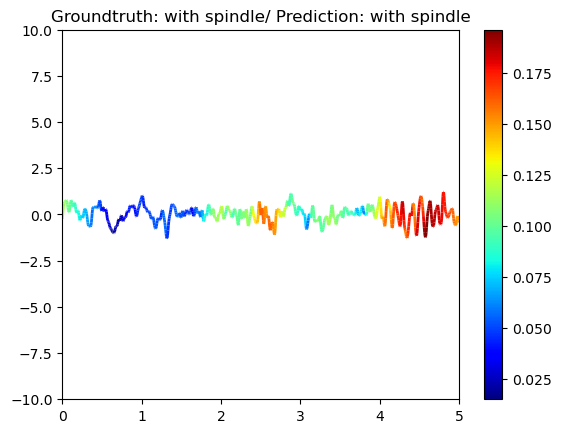

1/1 [==============================] - 0s 24ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


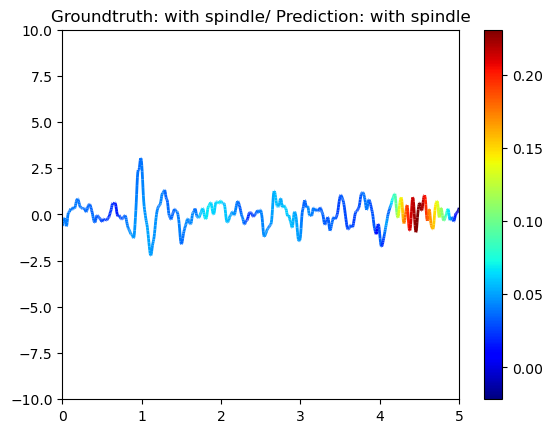

1/1 [==============================] - 0s 25ms/step
flase sample


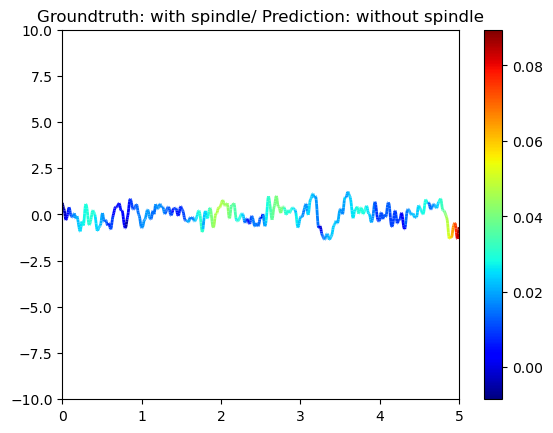

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


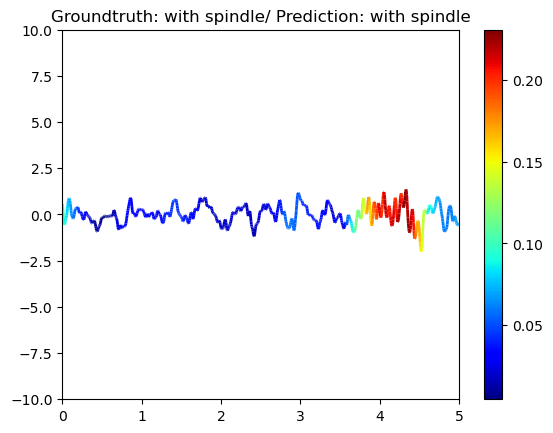

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


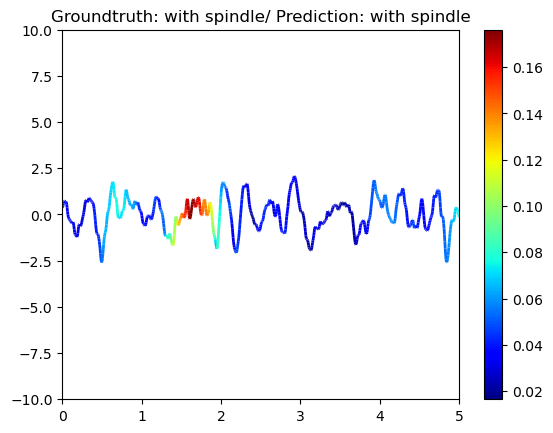

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


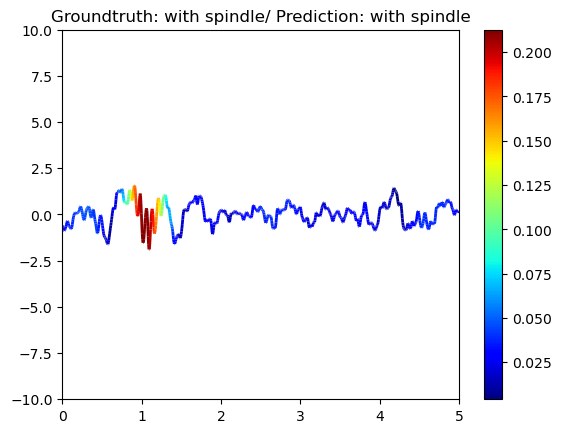

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


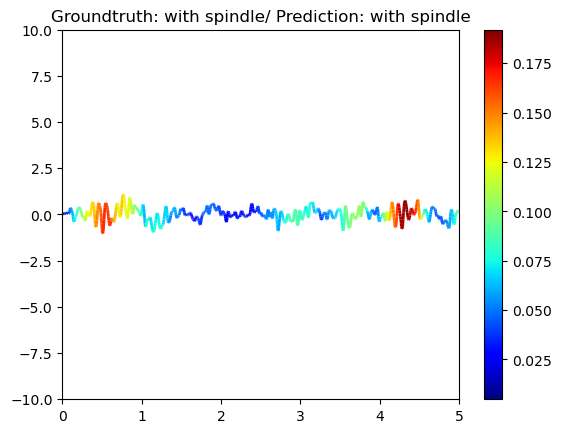

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


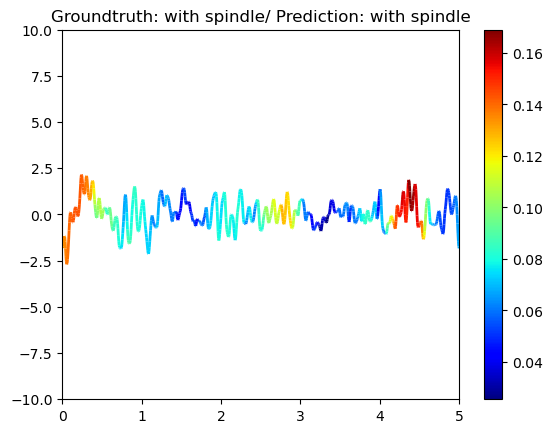

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


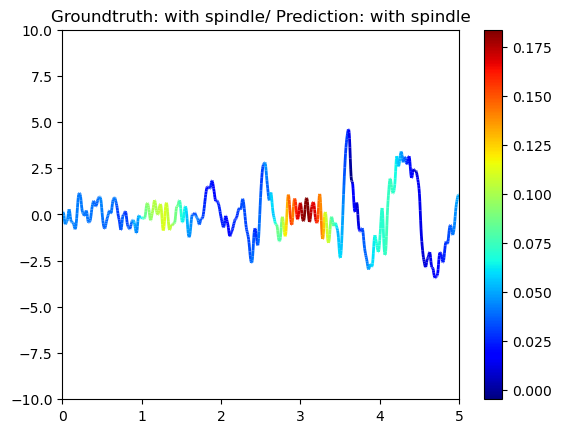

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


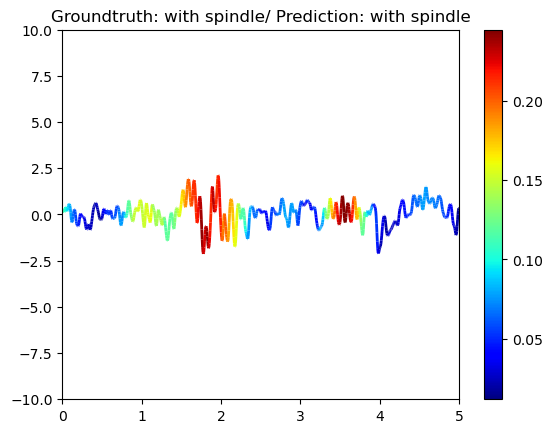

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


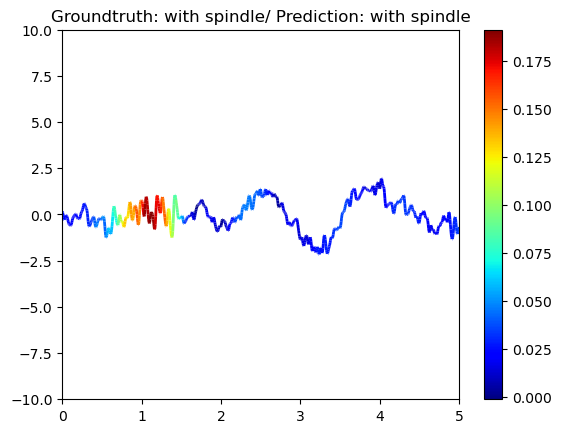

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


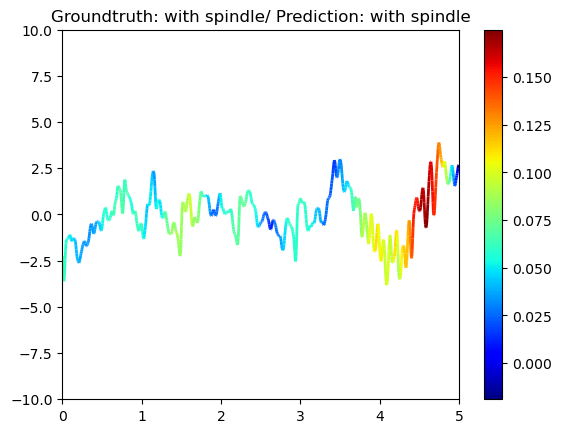

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


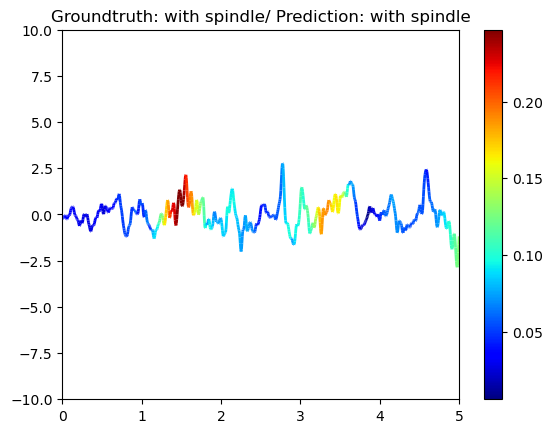

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


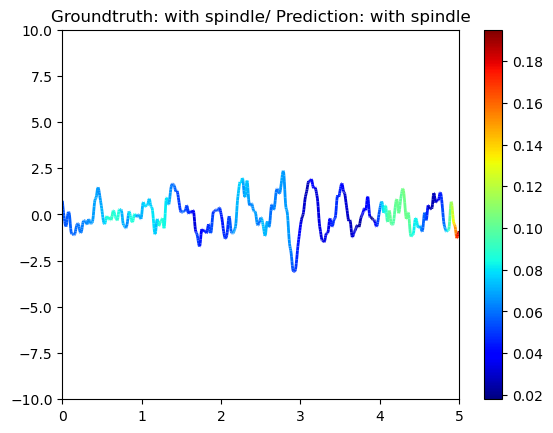

1/1 [==============================] - 0s 20ms/step
flase sample


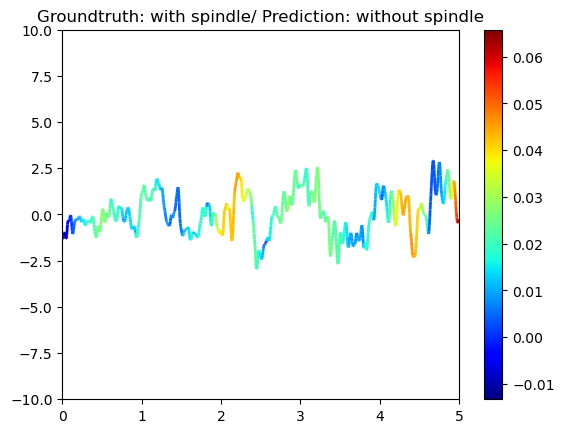

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


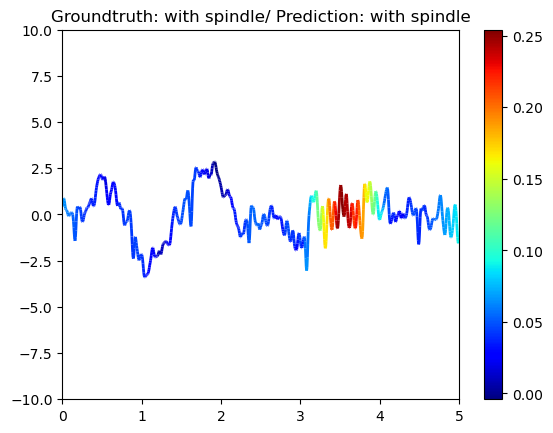

1/1 [==============================] - 0s 21ms/step
flase sample


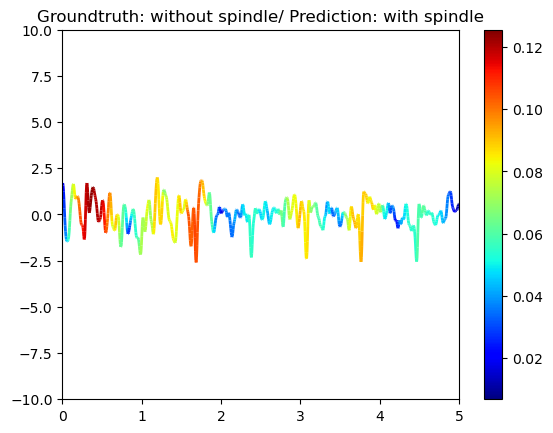

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


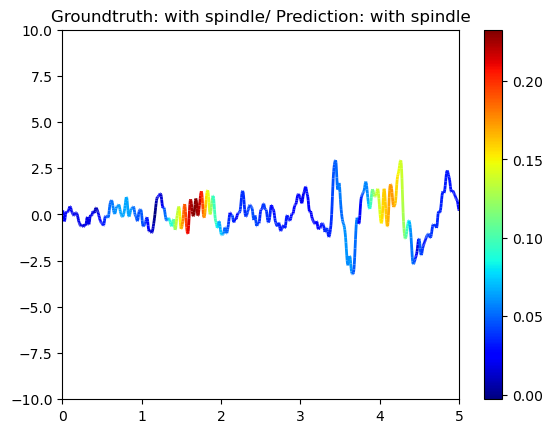

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


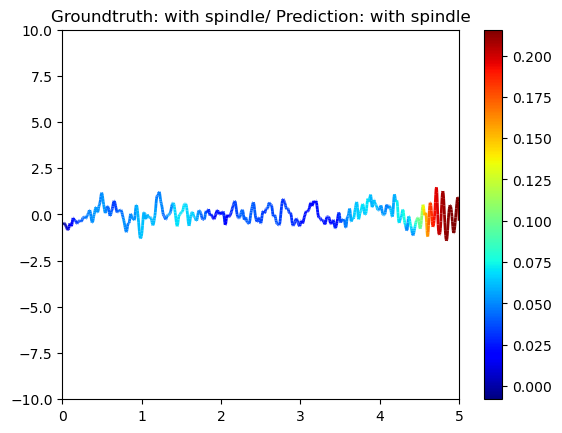

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


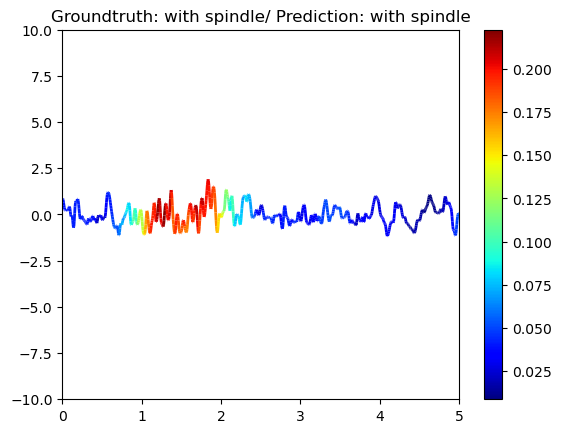

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


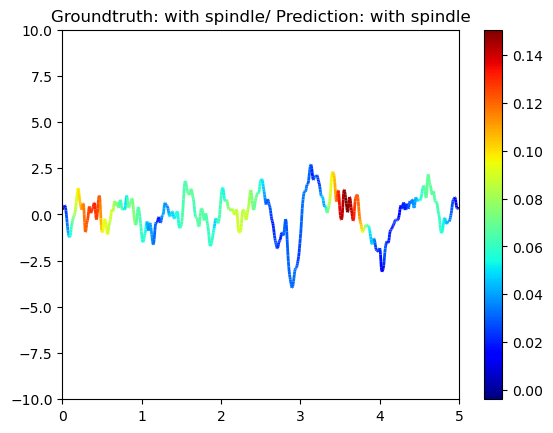

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


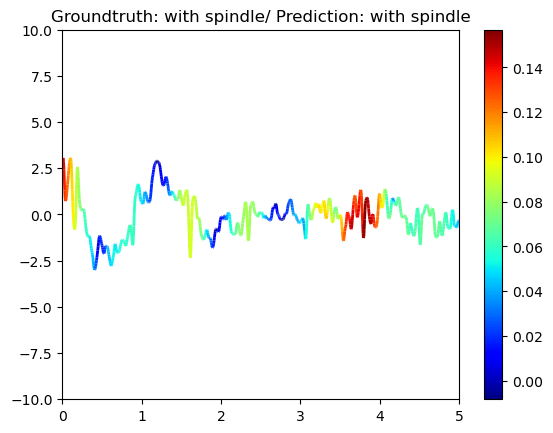

1/1 [==============================] - 0s 20ms/step
flase sample


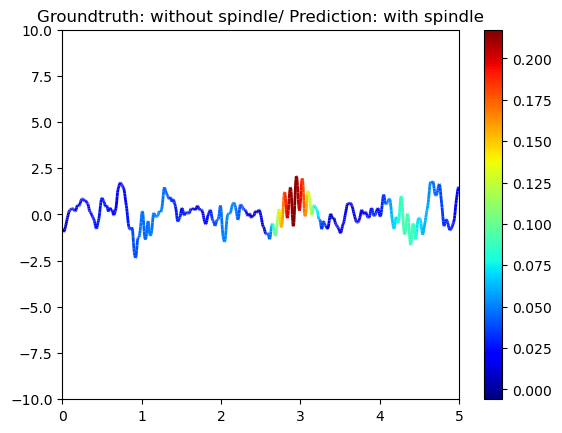

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


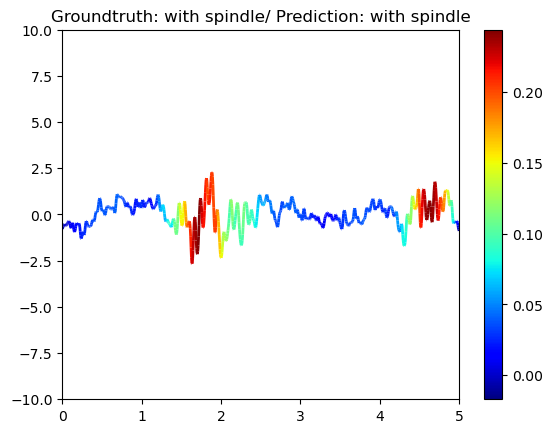

1/1 [==============================] - 0s 21ms/step
flase sample


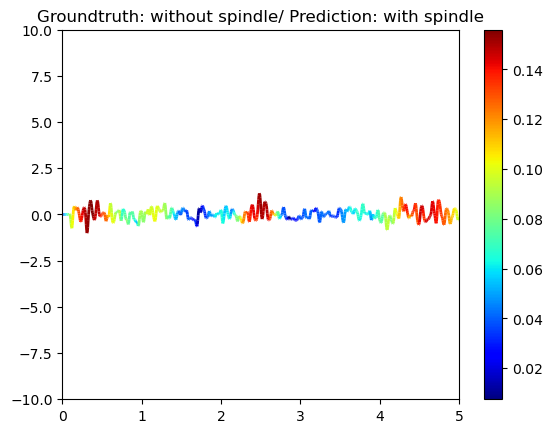

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


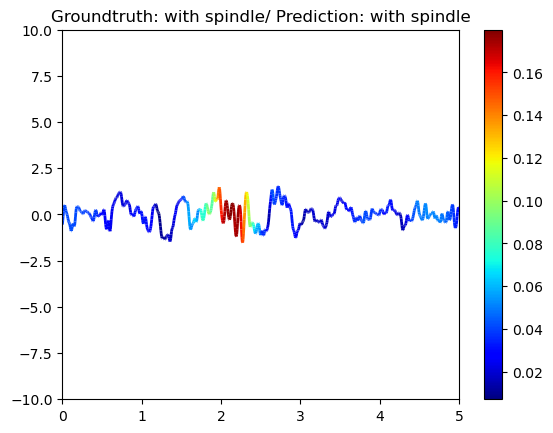

1/1 [==============================] - 0s 21ms/step
flase sample


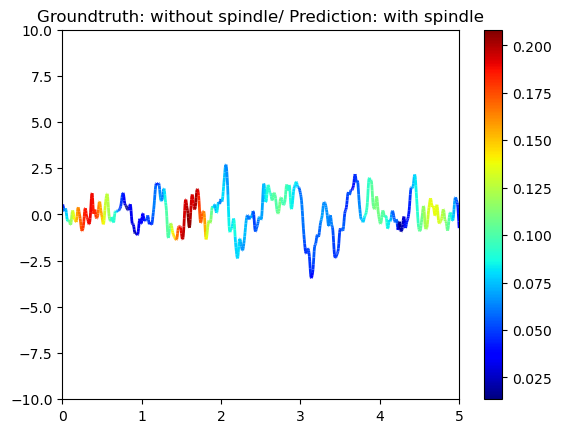

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


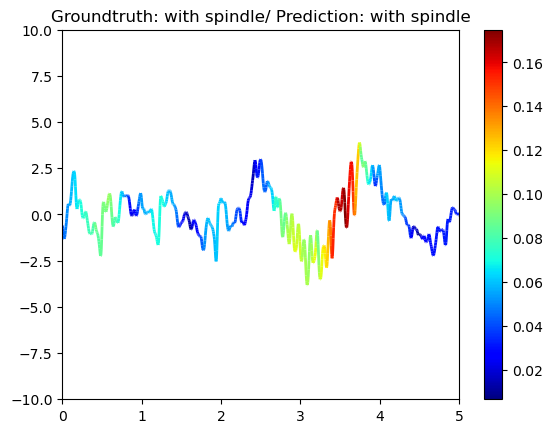

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


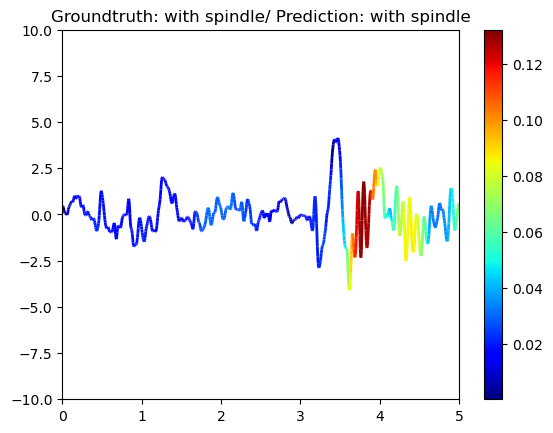

1/1 [==============================] - 0s 32ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


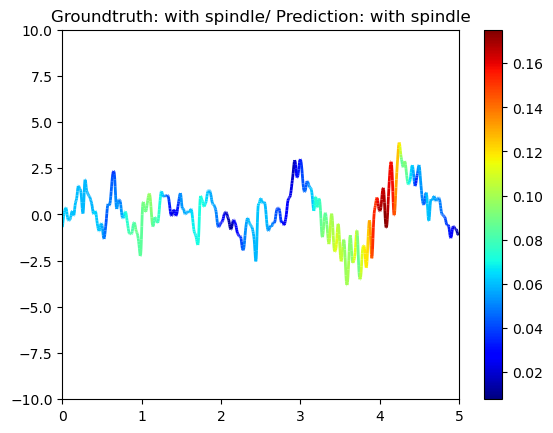

1/1 [==============================] - 0s 33ms/step
flase sample


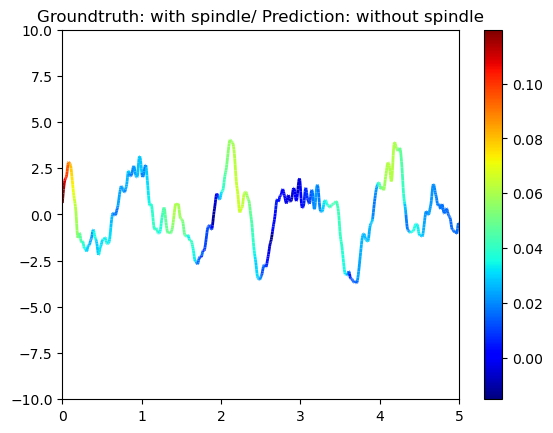

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


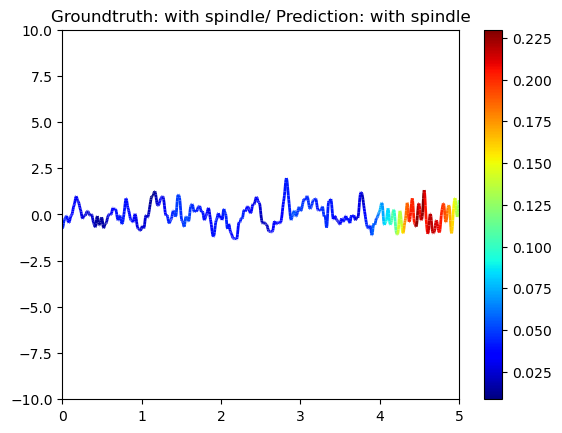

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


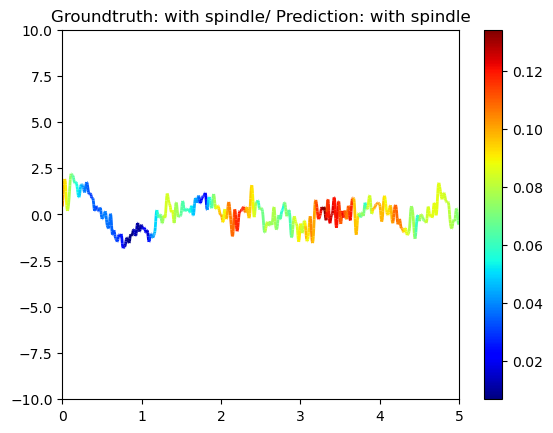

1/1 [==============================] - 0s 20ms/step
flase sample


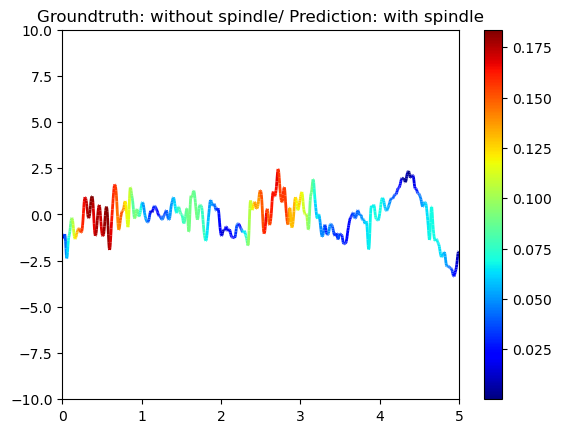

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


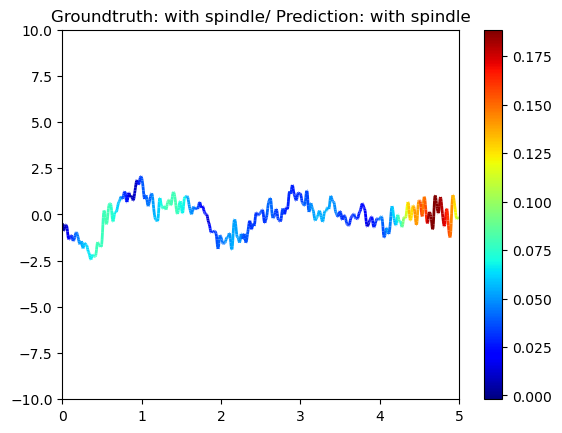

1/1 [==============================] - 0s 21ms/step
flase sample


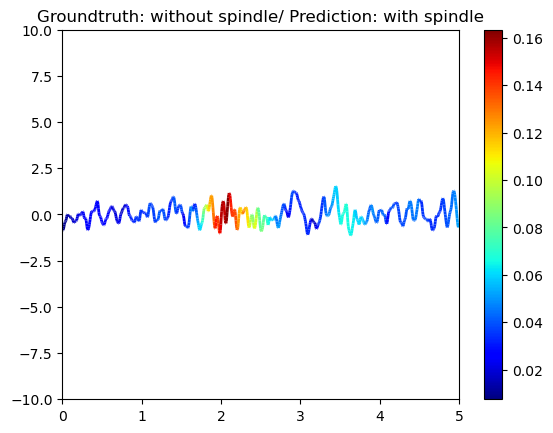

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


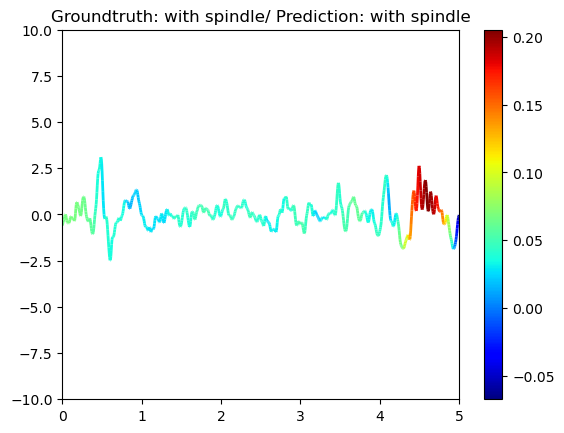

1/1 [==============================] - 0s 31ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


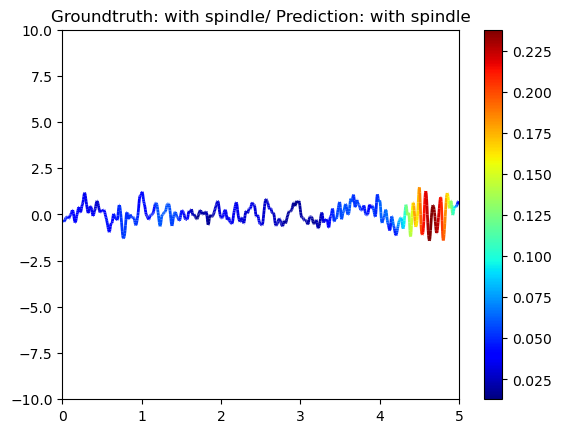

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


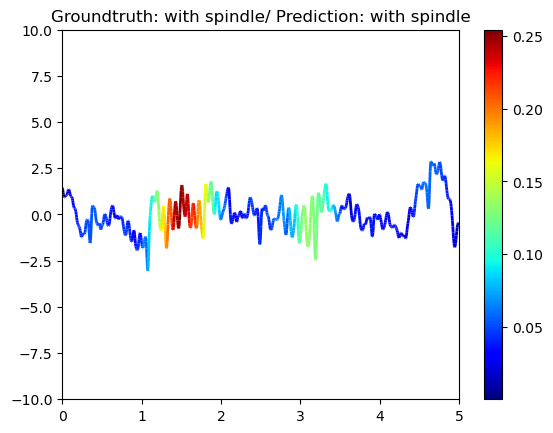

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


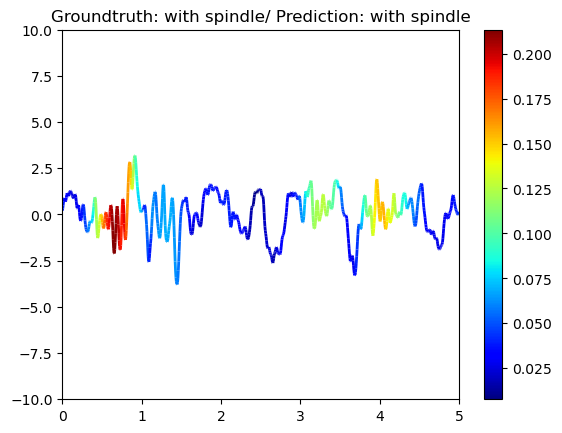

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


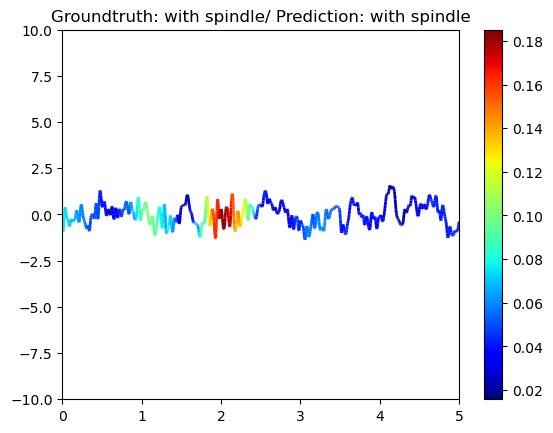

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


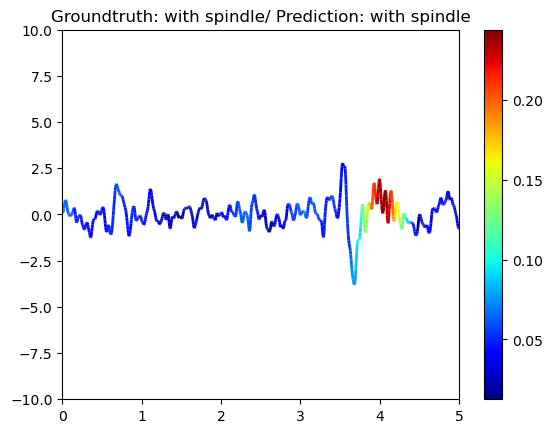

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


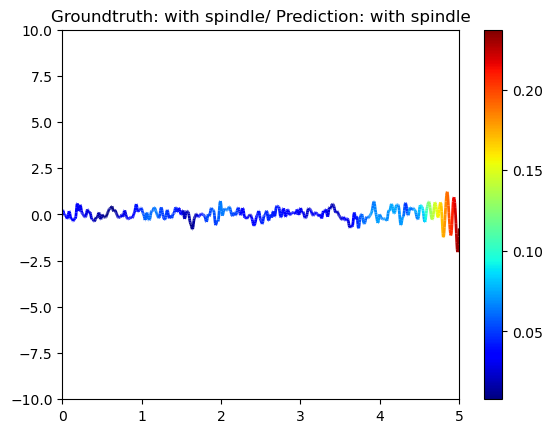

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


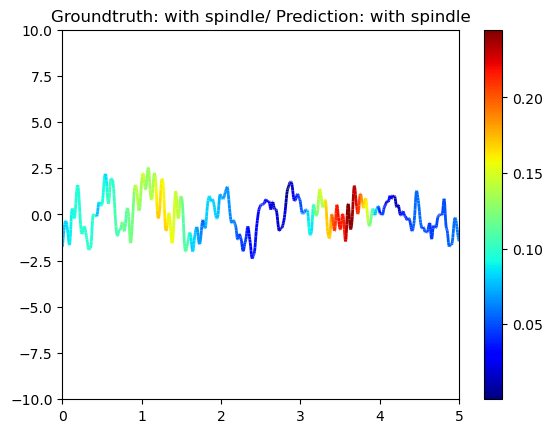

1/1 [==============================] - 0s 19ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


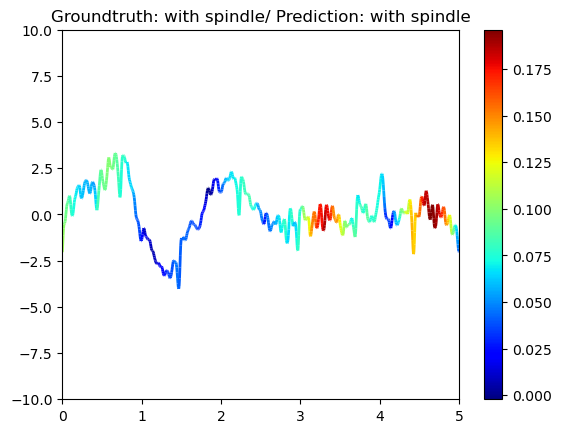

1/1 [==============================] - 0s 20ms/step
flase sample


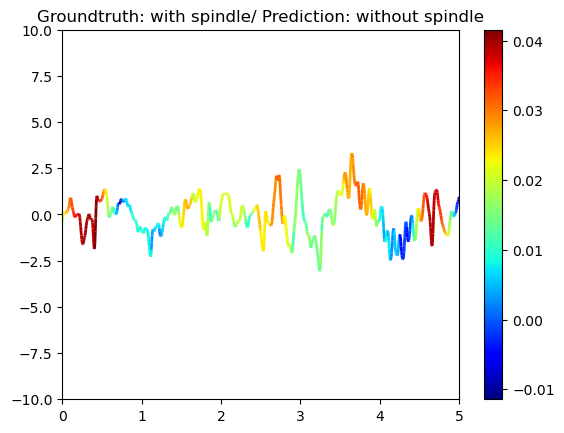

1/1 [==============================] - 0s 20ms/step
flase sample


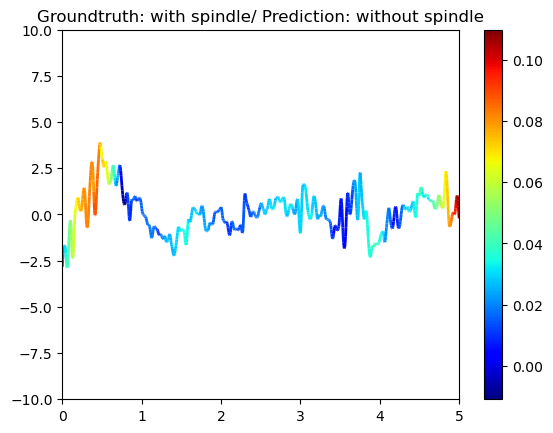

1/1 [==============================] - 0s 21ms/step
flase sample


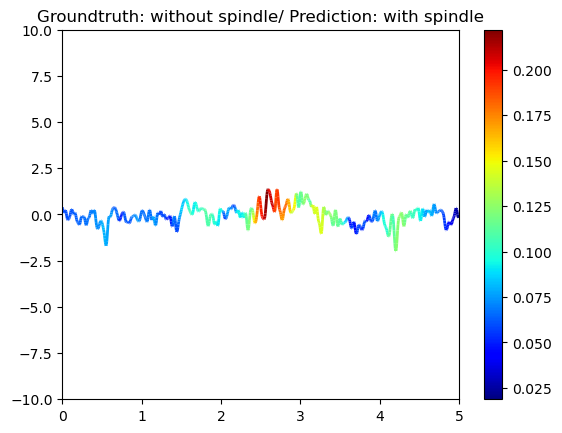

1/1 [==============================] - 0s 22ms/step
flase sample


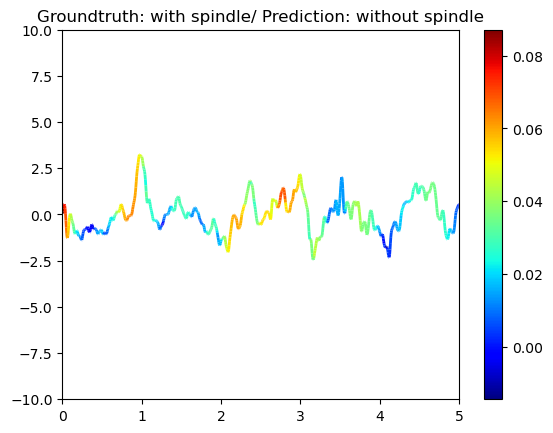

1/1 [==============================] - 0s 19ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


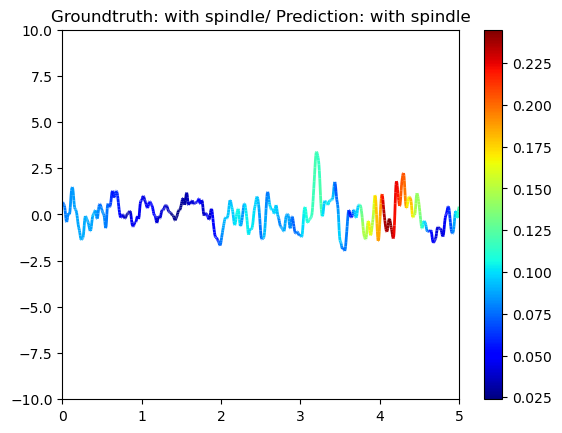

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


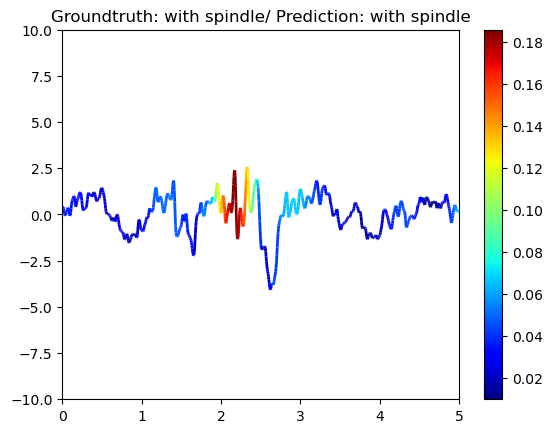

1/1 [==============================] - 0s 21ms/step
flase sample


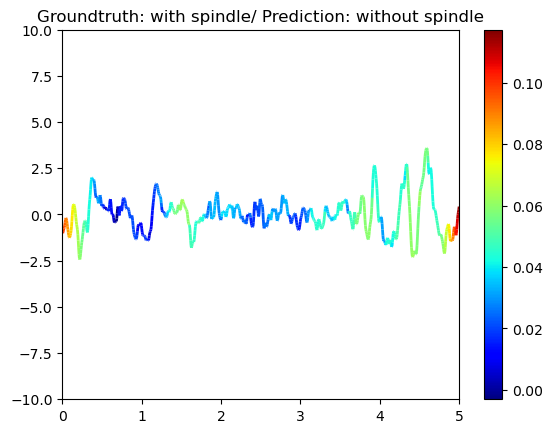

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


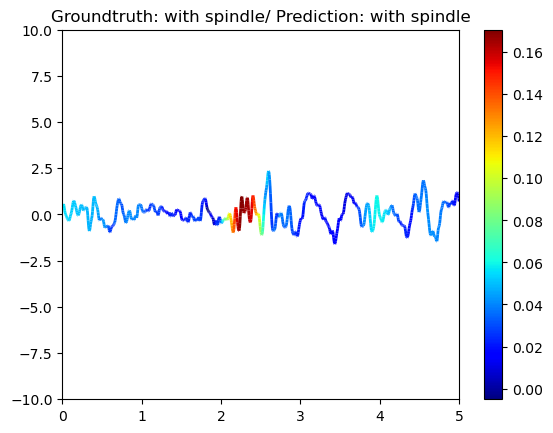

1/1 [==============================] - 0s 19ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


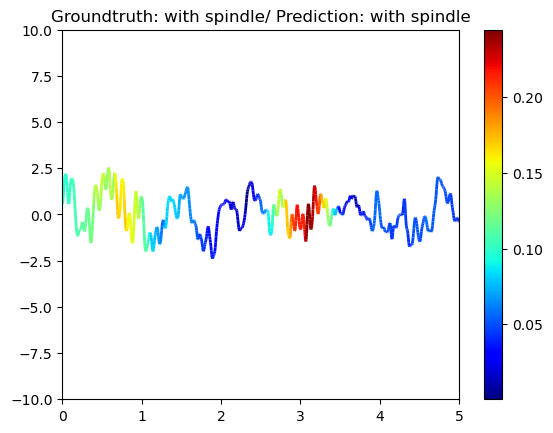

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


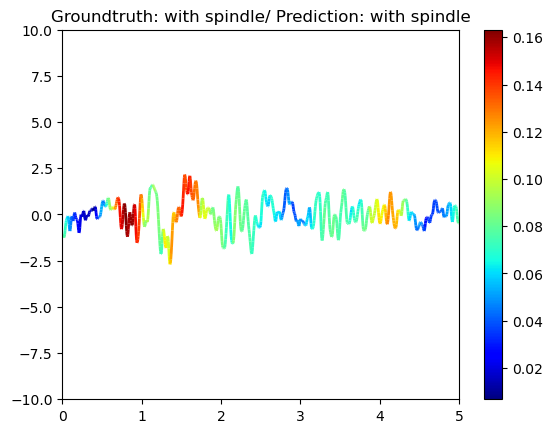

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


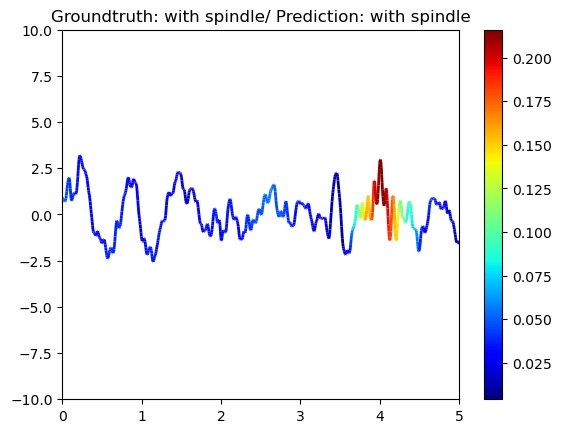

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


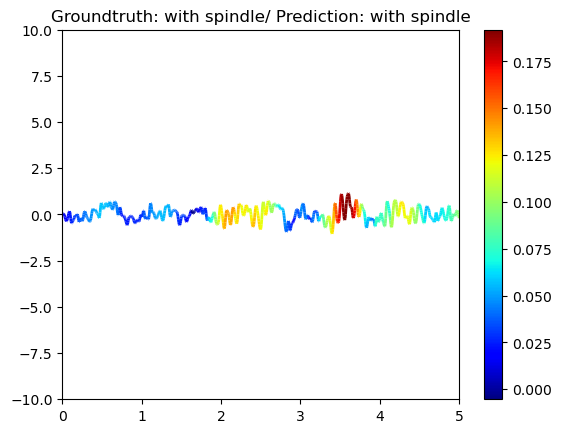

1/1 [==============================] - 0s 21ms/step
flase sample


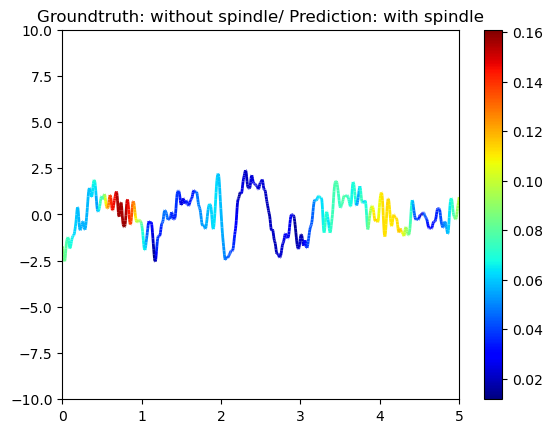

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


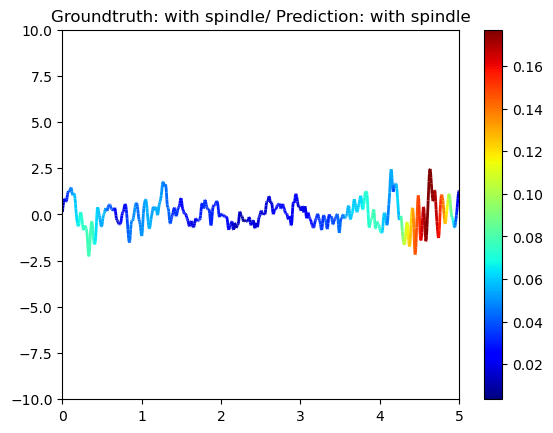

1/1 [==============================] - 0s 19ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


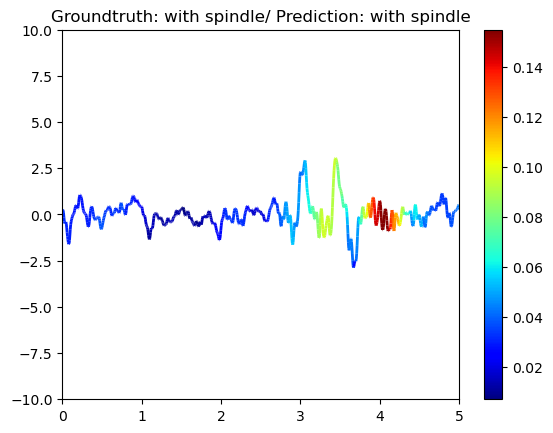

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


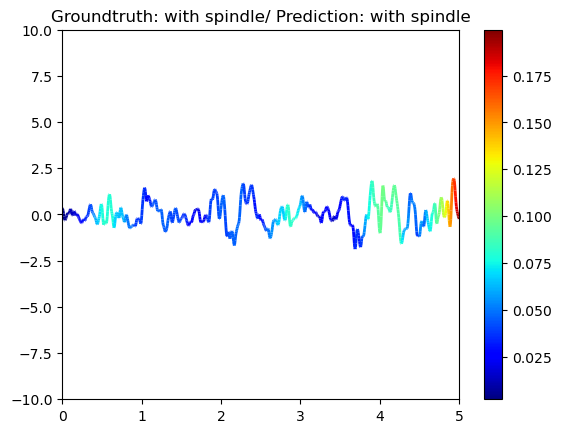

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


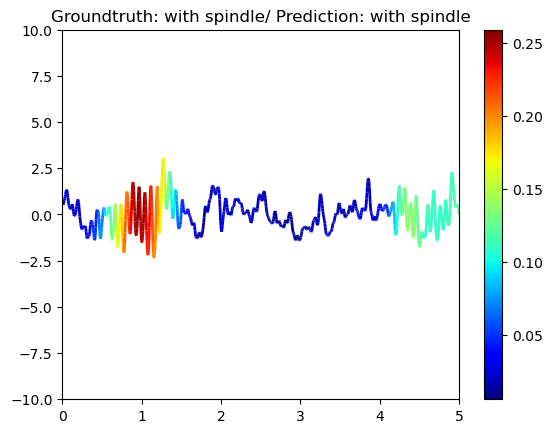

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


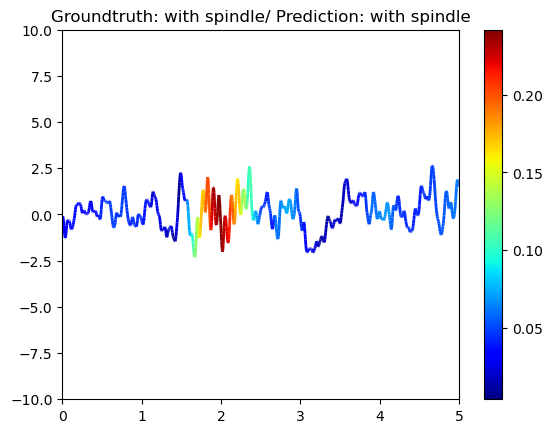

1/1 [==============================] - 0s 25ms/step
flase sample


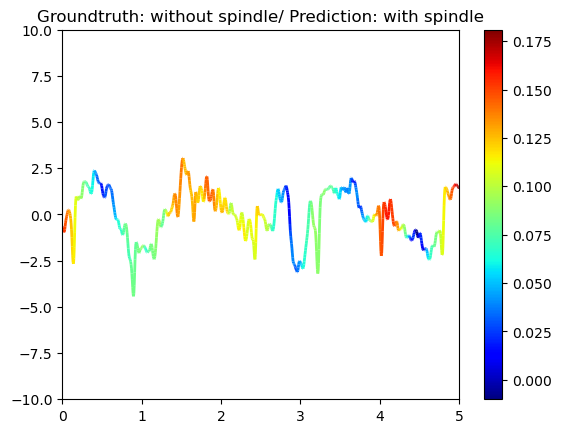

1/1 [==============================] - 0s 24ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


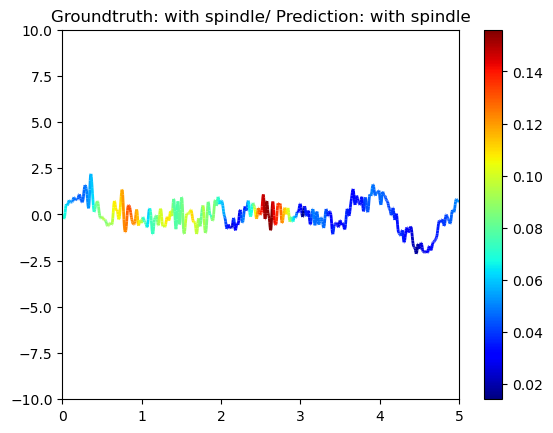

1/1 [==============================] - 0s 24ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


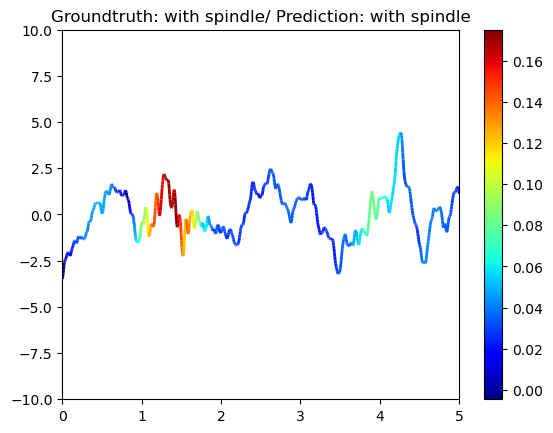

1/1 [==============================] - 0s 24ms/step
flase sample


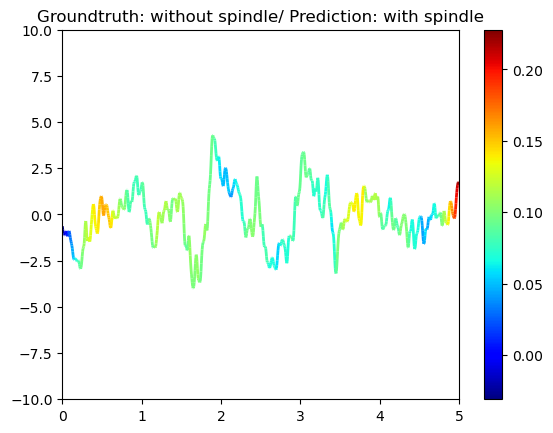

1/1 [==============================] - 0s 24ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


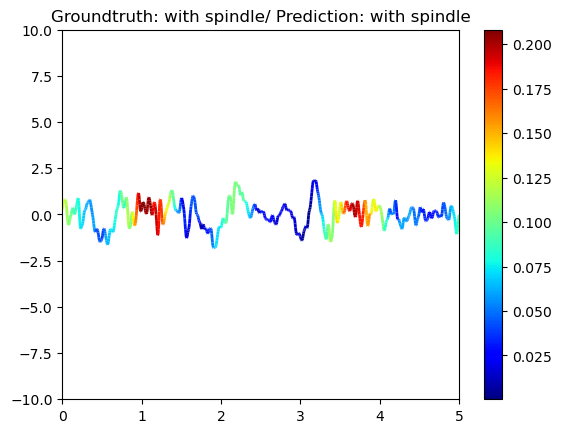

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


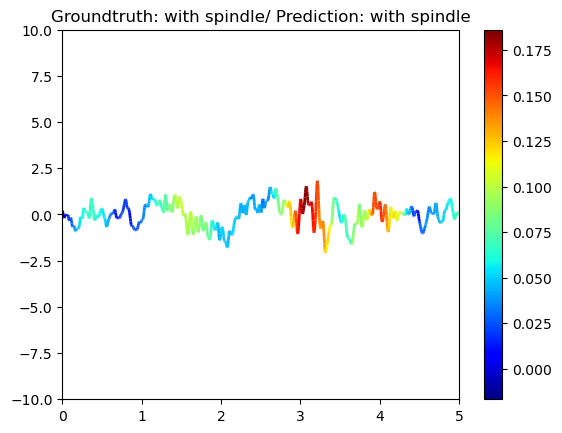

1/1 [==============================] - 0s 24ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


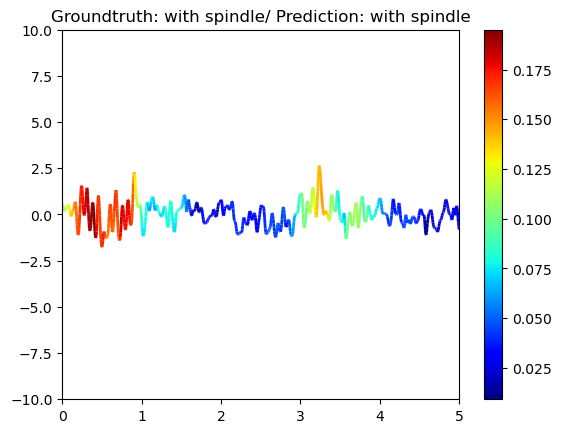

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


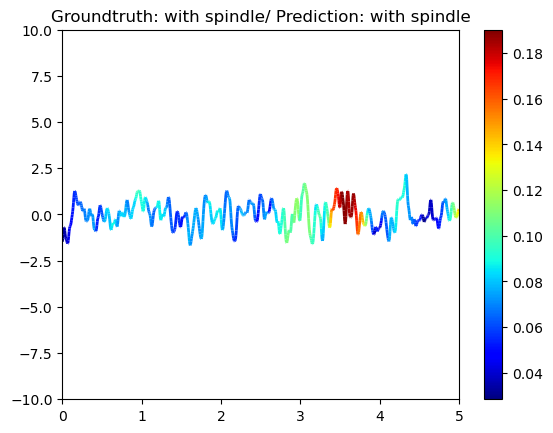

1/1 [==============================] - 0s 22ms/step
flase sample


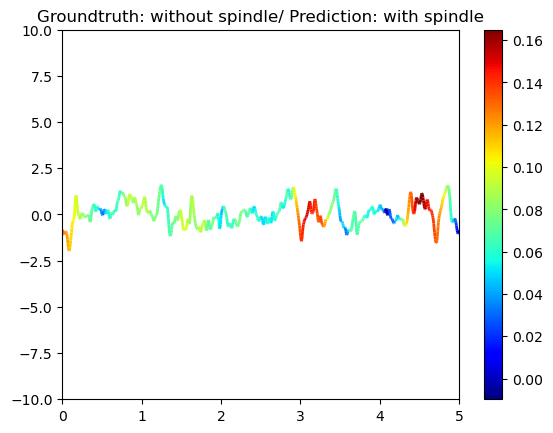

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


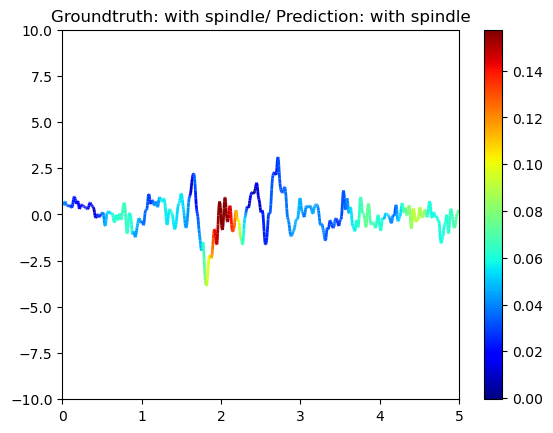

1/1 [==============================] - 0s 23ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


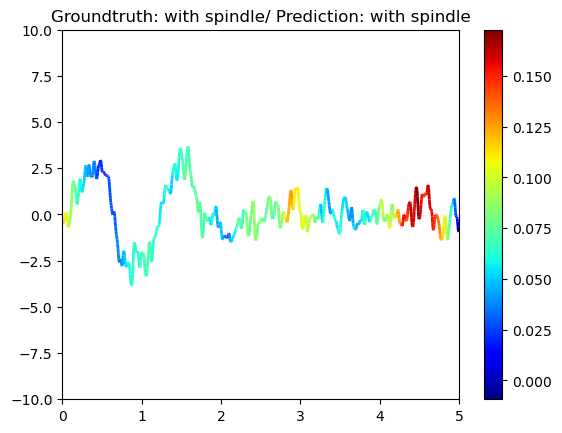

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


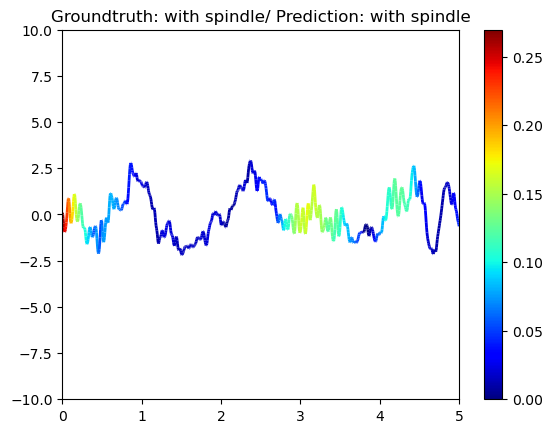

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


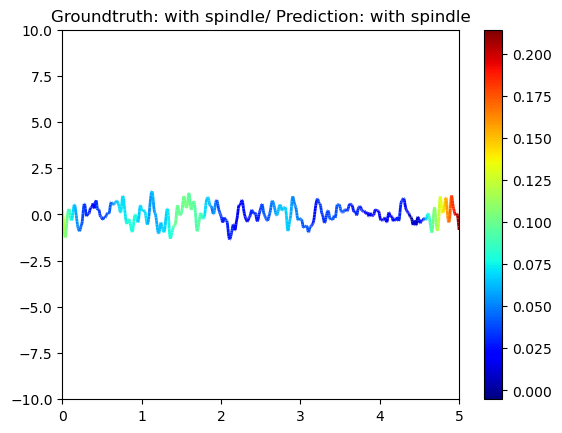

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


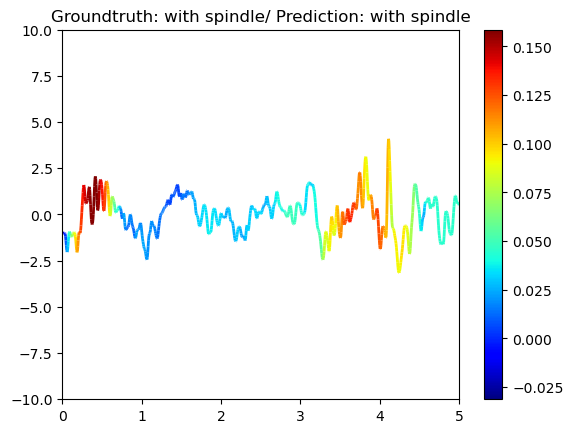

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


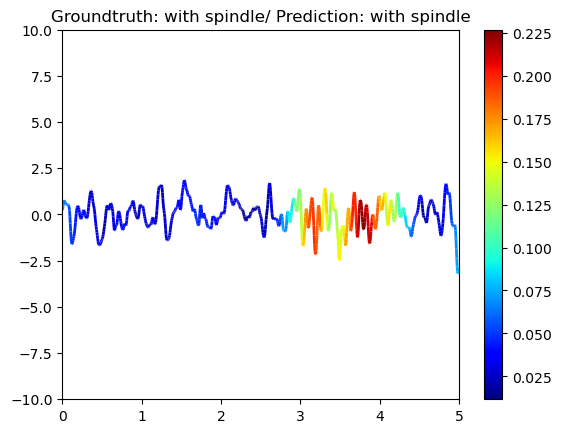

1/1 [==============================] - 0s 24ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


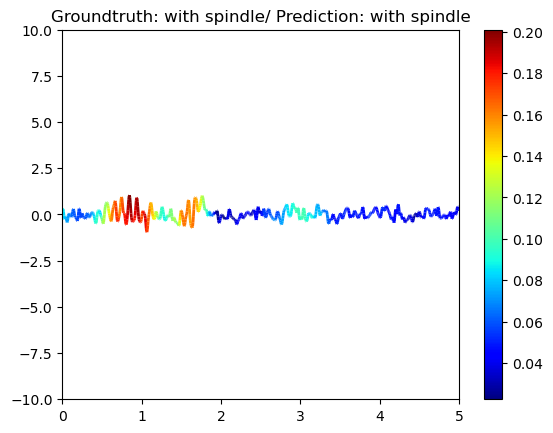

1/1 [==============================] - 0s 60ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


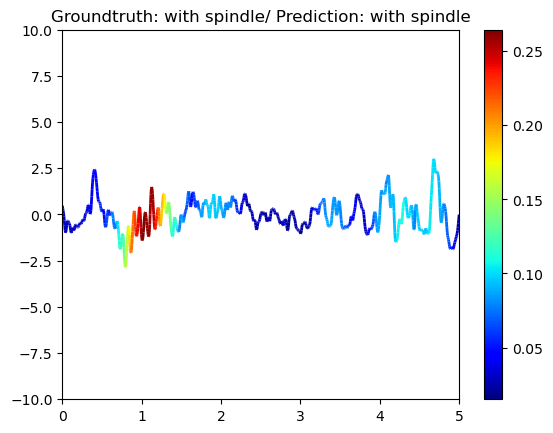

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


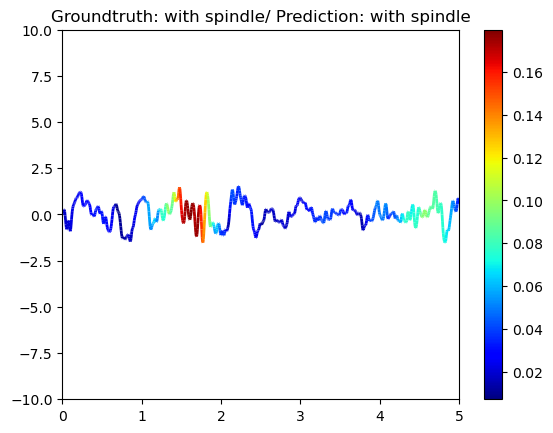

1/1 [==============================] - 0s 22ms/step
flase sample


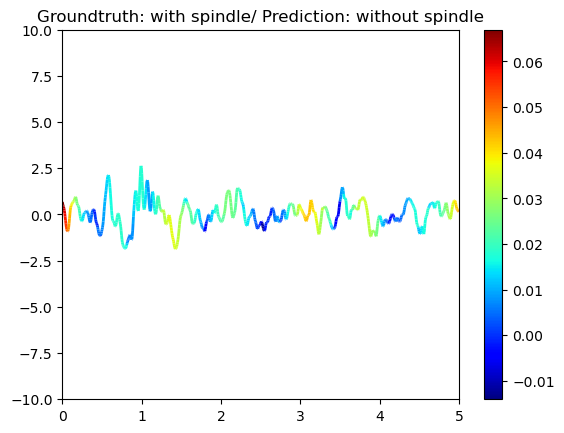

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


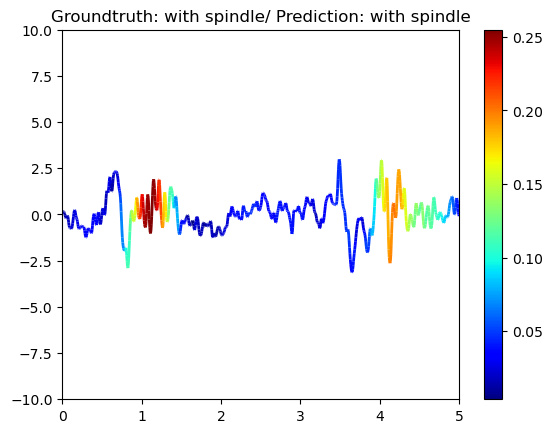

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


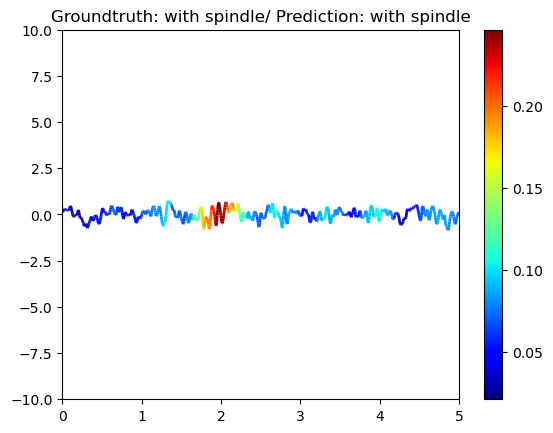

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


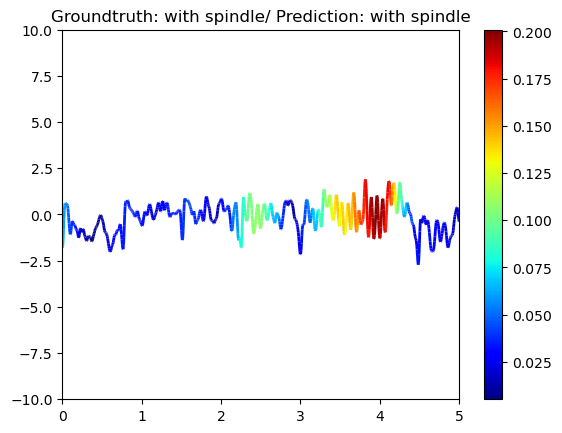

1/1 [==============================] - 0s 33ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


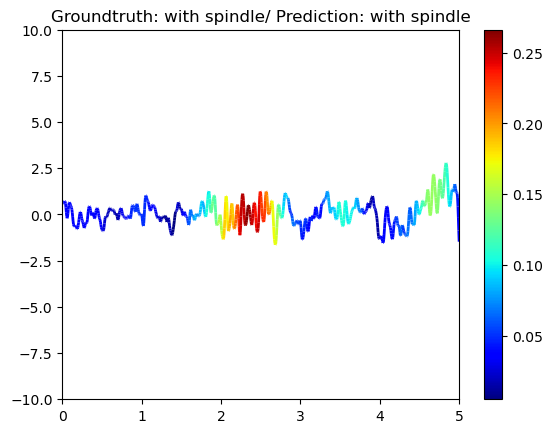

1/1 [==============================] - 0s 29ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


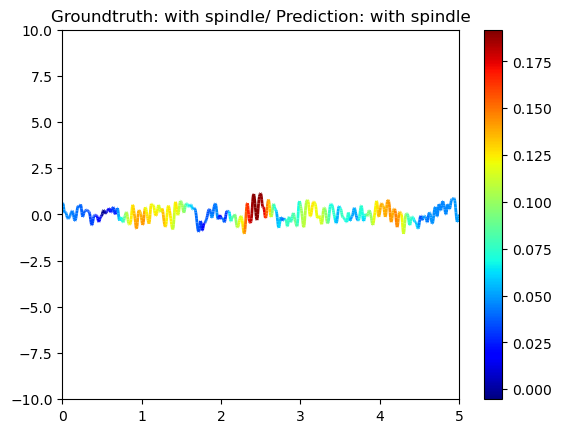

1/1 [==============================] - 0s 29ms/step
flase sample


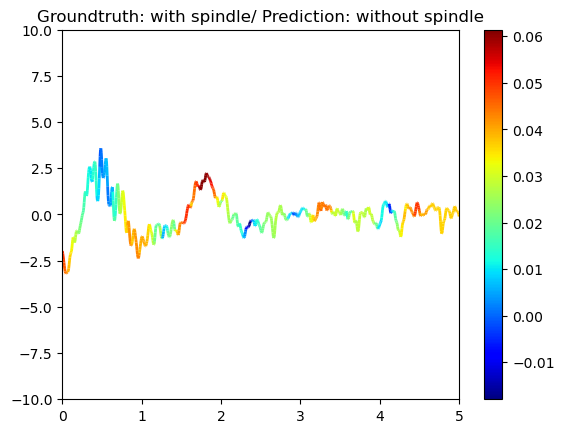

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


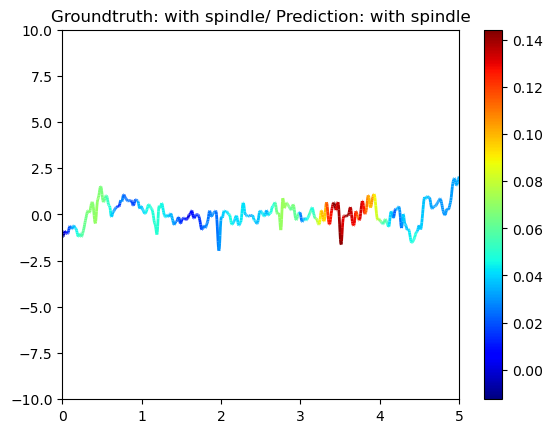

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


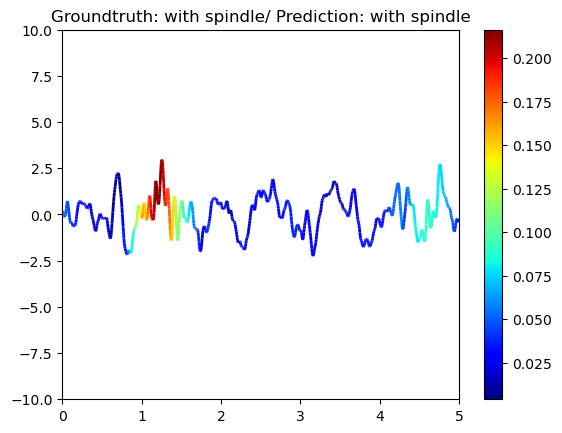

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


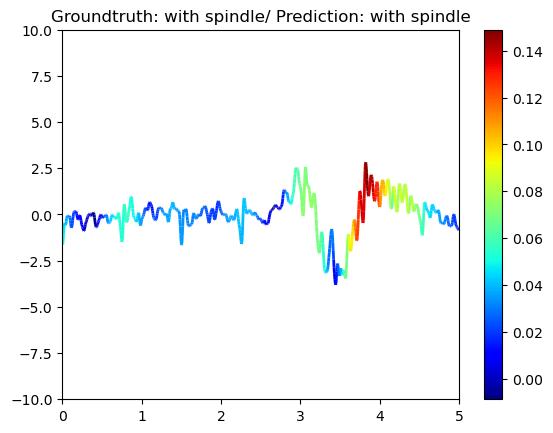

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


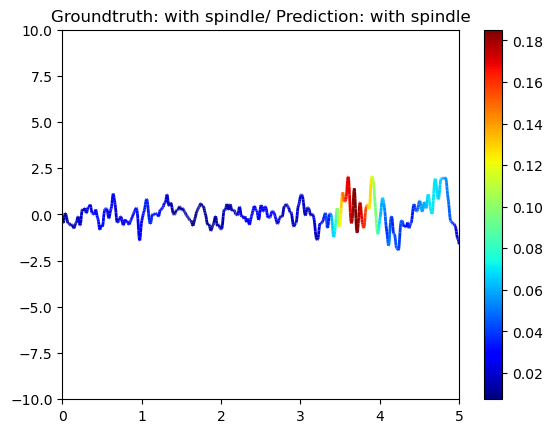

1/1 [==============================] - 0s 21ms/step
flase sample


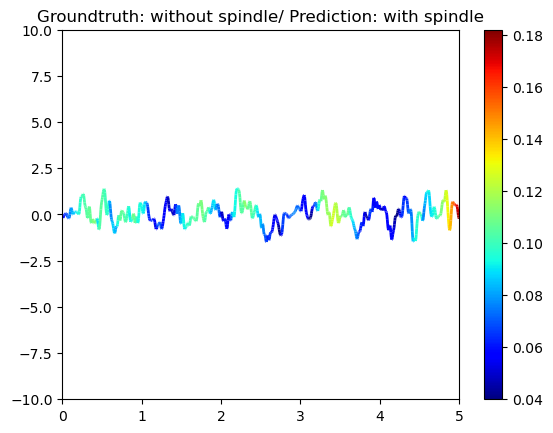

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


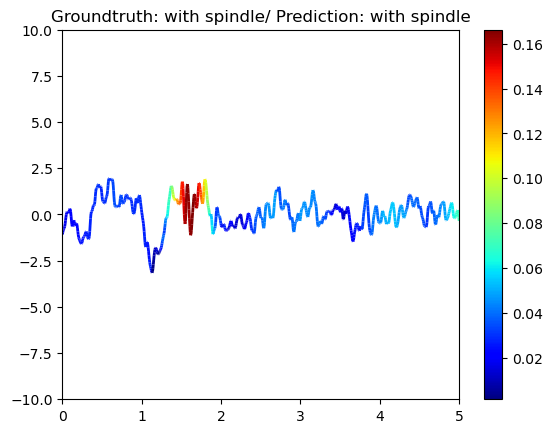

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


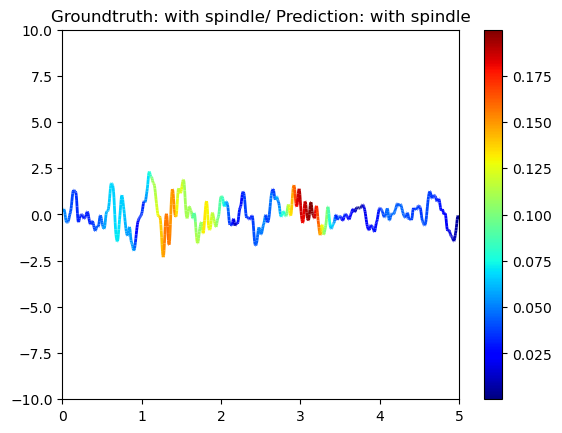

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


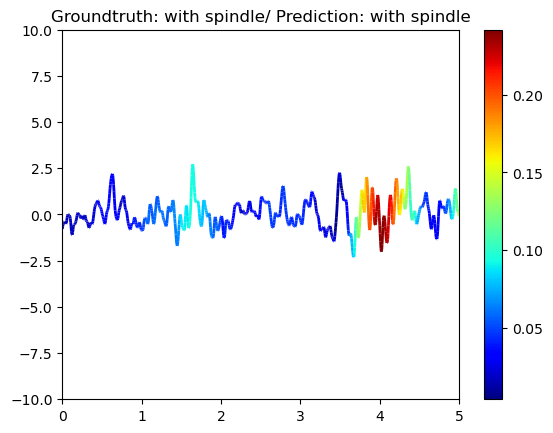

1/1 [==============================] - 0s 21ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


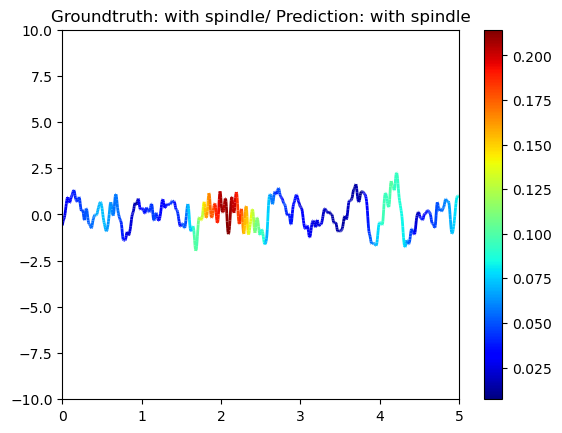

1/1 [==============================] - 0s 60ms/step
flase sample


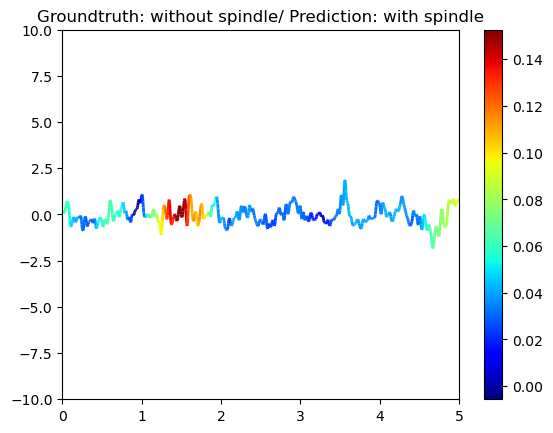

1/1 [==============================] - 0s 27ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


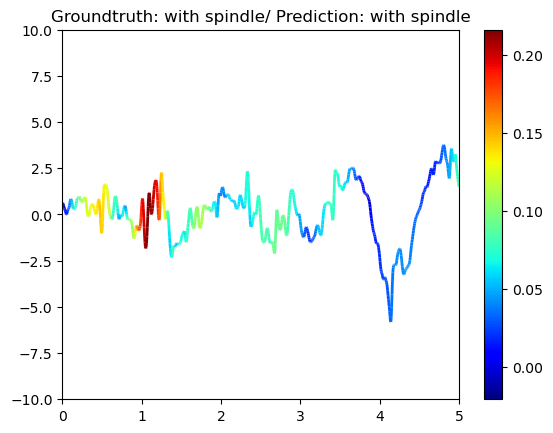

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


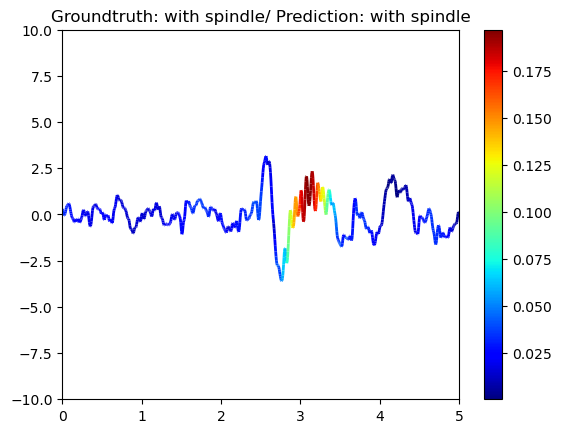

1/1 [==============================] - 0s 22ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


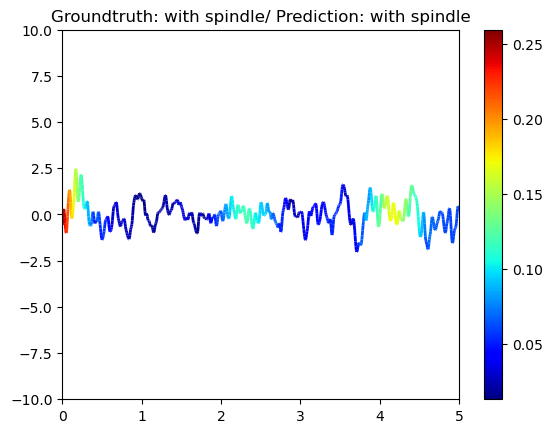

1/1 [==============================] - 0s 20ms/step
true positive sample
(1000, 1, 2)
(999, 2, 2)


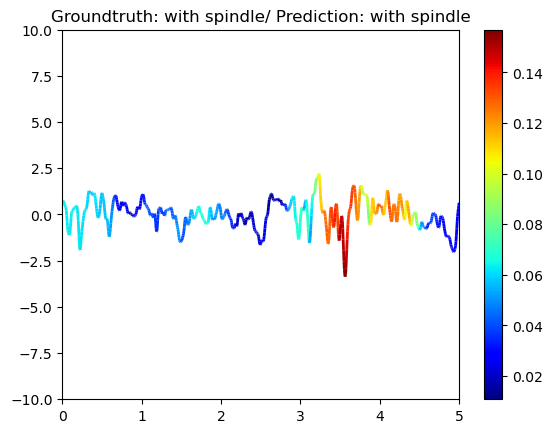

In [85]:
# 1d-cnn grad-cam
from tensorflow.keras import models
import tensorflow.keras.backend as K
import cv2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm

from scipy.signal import savgol_filter

last_conv_layer = model.get_layer(index=-6)
heatmap_model = models.Model([model.input], [last_conv_layer.output, model.output])

for i in range(0,247):
    preds = model.predict(test_data[i:i+1,:,:])
    pred_class = np.argmax(preds)
    if((pred_class == test_labels[i]) and (test_labels[i]==1)):
        print("true positive sample")
        with tf.GradientTape() as gtape:
            conv_output, Predictions = heatmap_model(test_data[i:i+1,:,:])
            prob = Predictions[:, np.argmax(Predictions[0])]
            grads = gtape.gradient(prob, conv_output)
            pooled_grads = K.mean(grads, axis=(0,1)) 


        heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
        heatmap = np.maximum(heatmap,0)
        max_heat = np.max(heatmap)
        if max_heat == 0:
            max_heat = 1e-10
        heatmap /= max_heat


        heatmap1 = cv2.resize(heatmap,(1000,1), interpolation=cv2.INTER_CUBIC)
        # print(heatmap1.shape)
        heatmap_weight = heatmap1[0]
#         print(heatmap_weight)


#         solve the trivial problem: smooth the heatmap_weight value
        heatmap_weight = savgol_filter(heatmap_weight, 151, 2)
        
        



        time = np.linspace(0, 5, 1000)
        EEG = test_data[i,:,0]#SELECT DATA

        EEG_points = np.array([time, EEG]).T.reshape(-1, 1, 2)
        print(EEG_points.shape)
        EEG_segments = np.concatenate([EEG_points[:-1], EEG_points[1:]], axis=1)
        print(EEG_segments.shape)

        fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

        # Create a continuous norm to map from data points to colors
        norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
        EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
        print(EEG_lc)
        # Set the values used for colormapping
        EEG_lc.set_array(heatmap_weight)
        EEG_lc.set_linewidth(2)
        EEG_line = axs.add_collection(EEG_lc)
        fig.colorbar(EEG_line, ax=axs)

        axs.set_xlim(time.min(), time.max())
        axs.set_ylim(-10, 10)

        if(pred_class==1):
            if(test_labels[i]==1):
                plt.title('Groundtruth: with spindle/ Prediction: with spindle')
            elif(test_labels[i]==0):
                plt.title('Groundtruth: without spindle/ Prediction: with spindle')
        elif(pred_class==0):
            if(test_labels[i]==1):
                plt.title('Groundtruth: with spindle/ Prediction: without spindle')
            elif(test_labels[i]==0):
                plt.title('Groundtruth: without spindle/ Prediction: without spindle')

        plt.show()   
    elif(pred_class != test_labels[i]):
        print("flase sample")
        with tf.GradientTape() as gtape:
            conv_output, Predictions = heatmap_model(test_data[i:i+1,:,:])
            prob = Predictions[:, np.argmax(Predictions[0])]
            grads = gtape.gradient(prob, conv_output)
            pooled_grads = K.mean(grads, axis=(0,1)) 


        heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
        heatmap = np.maximum(heatmap,0)
        max_heat = np.max(heatmap)
        if max_heat == 0:
            max_heat = 1e-10
        heatmap /= max_heat


        heatmap1 = cv2.resize(heatmap,(1000,1), interpolation=cv2.INTER_CUBIC)
        # print(heatmap1.shape)
        heatmap_weight = heatmap1[0]
        # print(heatmap_weight.shape)
        
        #         solve the trivial problem: smooth the heatmap_weight value
        heatmap_weight = savgol_filter(heatmap_weight, 151, 2)


        time = np.linspace(0, 5, 1000)
        EEG = test_data[i,:,0]#SELECT DATA

        EEG_points = np.array([time, EEG]).T.reshape(-1, 1, 2)
        EEG_segments = np.concatenate([EEG_points[:-1], EEG_points[1:]], axis=1)

        fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

        # Create a continuous norm to map from data points to colors
        norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
        EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
        # Set the values used for colormapping
        EEG_lc.set_array(heatmap_weight)
        EEG_lc.set_linewidth(2)
        EEG_line = axs.add_collection(EEG_lc)
        fig.colorbar(EEG_line, ax=axs)

        axs.set_xlim(time.min(), time.max())
        axs.set_ylim(-10, 10)

        if(pred_class==1):
            if(test_labels[i]==1):
                plt.title('Groundtruth: with spindle/ Prediction: with spindle')
            elif(test_labels[i]==0):
                plt.title('Groundtruth: without spindle/ Prediction: with spindle')
        elif(pred_class==0):
            if(test_labels[i]==1):
                plt.title('Groundtruth: with spindle/ Prediction: without spindle')
            elif(test_labels[i]==0):
                plt.title('Groundtruth: without spindle/ Prediction: without spindle')

        plt.show()


(204, 40)

(1, 250)

(250,)

float32


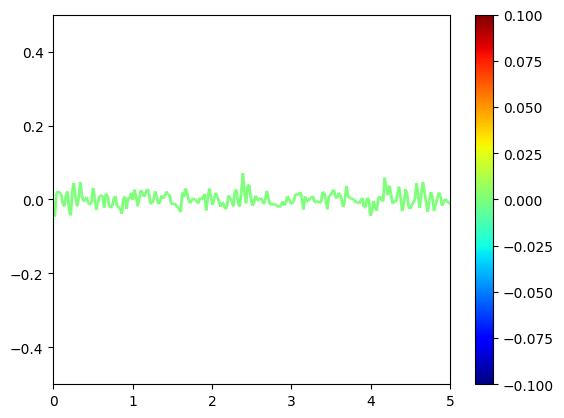

(1, 250)

(250,)

float32


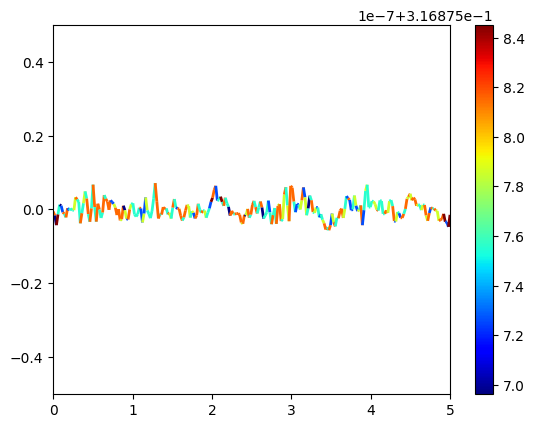

(1, 250)

(250,)

float32


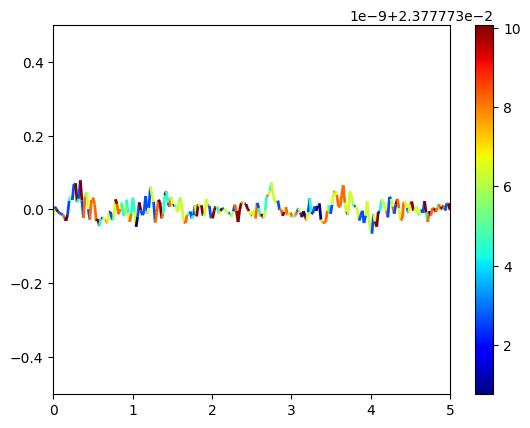

(1, 250)

(250,)

float32


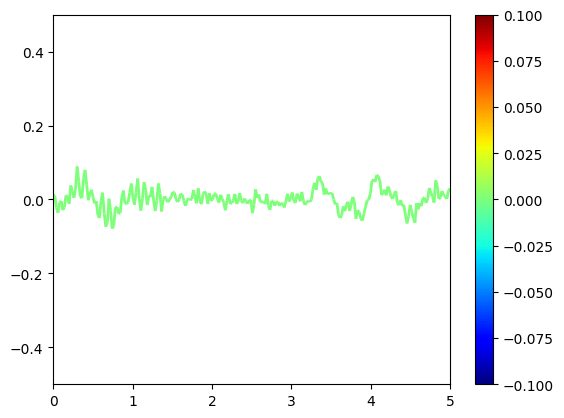

(1, 250)

(250,)

float32


KeyboardInterrupt: ignored

In [40]:
# 1d-cnn grad-cam 
from tensorflow.keras import models
import keras.backend as K
import cv2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
import tensorflow as tf



last_conv_layer = model.get_layer("conv1d_4")
last_conv_layer_model = tf.keras.Model(model.inputs, last_conv_layer.output)
print(last_conv_layer.output.shape[1:])
classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
x = classifier_input
for layer_name in ["max_pooling1d_4", "flatten", "dropout", "dense", "dropout_1", "dense_1", "dense_2"]:
    x = model.get_layer(layer_name)(x)
classifier_model = tf.keras.Model(classifier_input, x)

misclassify_count = 0
correct_record = np.zeros((30,), dtype=int)

for i in range(0,30):
  
  x = check_data[i,:]

  with tf.GradientTape() as tape:
    inputs = x[np.newaxis, ...]
    last_conv_layer_output = last_conv_layer_model(inputs)
    tape.watch(last_conv_layer_output)
    preds = classifier_model(last_conv_layer_output)
    top_pred_index = tf.argmax(preds[0])
    top_class_channel = preds[:, np.argmax(top_pred_index)]
  grads = tape.gradient(top_class_channel, last_conv_layer_output)
  pooled_grads = tf.reduce_mean(grads, axis=(0, 1))

  last_conv_layer_output = last_conv_layer_output.numpy()[0]
  pooled_grads = pooled_grads.numpy()
  for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, i] *= pooled_grads[i]

  # pred = model.predict(x)
  # class_idx = np.argmax(pred[0])
  # class_output = model.output[:,class_idx]
  # grads = K.gradients(class_output,last_conv_layer.output)[0]
  # pooled_grads = K.mean(grads,axis=(0,1,2))


  # preds = model.predict(x)
  # pred_class = np.argmax(preds)
  # # with tf.GradientTape() as gtape:
  # #   conv_output, Predictions = heatmap_model(x)
  # #   prob = Predictions[:, np.argmax(Predictions[0])]
  # #   grads = gtape.gradient(prob, conv_output)
  # #   pooled_grads = K.mean(grads, axis=(0,1)) 

  # print([last_conv_layer.output[0]])
  # print([pooled_grads])
  # iterate_grads = K.function([model.input], [pooled_grads])
  # iterate_conv_output = K.function([model.input], [last_conv_layer.output[0]])
    
  #   # 傳入影像矩陣 x，並得到分類對 feature map 的梯度與最後一層 convolution layer 的 
  #   # feature map
  # pooled_grads_value = iterate_grads([x])
  # conv_layer_output_value = iterate_conv_output([x])
    
  #   # 將 feature map 乘以權重，等於該 feature map 中的某些區域對於該分類的重要性
  # for i in range(pooled_grads_value.shape[0]):
  #     conv_layer_output_value[:, :, i] *= (pooled_grads_value[i])




  # heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
  # heatmap = np.sum(last_conv_layer_output, axis=-1)
  # heatmap = np.maximum(heatmap,0)
  # max_heat = np.max(heatmap)
  # if max_heat == 0:
  #   max_heat = 1e-10
  # heatmap /= max_heat

  # Average over all the filters to get a single 2D array
  heatmap = np.mean(last_conv_layer_output, axis=-1)
  # Clip the values (equivalent to applying ReLU)
  # and then normalise the values
  heatmap = np.clip(heatmap, 0, np.max(heatmap)) / np.max(heatmap)


  data_points_per_epoch = 250
  sec_per_epoch = 5


  heatmap1 = cv2.resize(heatmap,(data_points_per_epoch,1), interpolation=cv2.INTER_LANCZOS4)
  print(heatmap1.shape)
  heatmap_weight = heatmap1[0]
  print(heatmap_weight.shape)
  print(heatmap_weight.dtype)



  time = np.linspace(0, sec_per_epoch, data_points_per_epoch)
  EEG = x#SELECT DATA
  EEG_points = np.array([time, EEG]).T.reshape(-1, 1, 2)
  EEG_segments = np.concatenate([EEG_points[:-1], EEG_points[1:]], axis=1)



  fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

  # Create a continuous norm to map from data points to colors
  norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
  EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
  # Set the values used for colormapping
  EEG_lc.set_array(heatmap_weight)
  EEG_lc.set_linewidth(2)
  EEG_line = axs.add_collection(EEG_lc)
  fig.colorbar(EEG_line, ax=axs)

  axs.set_xlim(time.min(), time.max())
  axs.set_ylim(-0.5, 0.5)



  # if(pred_class==0):
  #   if(check_data_label[i]==1):
  #     misclassify_count += 1
  #     fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

  #     # Create a continuous norm to map from data points to colors
  #     norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
  #     EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
  #     # Set the values used for colormapping
  #     EEG_lc.set_array(heatmap_weight)
  #     EEG_lc.set_linewidth(2)
  #     EEG_line = axs.add_collection(EEG_lc)
  #     fig.colorbar(EEG_line, ax=axs)

  #     axs.set_xlim(time.min(), time.max())
  #     axs.set_ylim(-0.5, 0.5)
  #     plt.title('Groundtruth: Spindle/ Prediction: NoSpindle')
  #     print(i)
  #     correct_record[i] = 1
  #   # if(check_data_label[i]==1):
  #   #   plt.title('Groundtruth: Spindle/ Prediction: Spindle')
  #   # elif(check_data_label[i]==0):
  #   #   plt.title('Groundtruth: NoSpindle/ Prediction: Spindle')
  #   #   print(i)
  # # elif(pred_class==1):
  # #   if(check_data_label[i]==0):
  # #     misclassify_count += 1
  # #     fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

  # #     # Create a continuous norm to map from data points to colors
  # #     norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
  # #     EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
  # #     # Set the values used for colormapping
  # #     EEG_lc.set_array(heatmap_weight)
  # #     EEG_lc.set_linewidth(2)
  # #     EEG_line = axs.add_collection(EEG_lc)
  # #     fig.colorbar(EEG_line, ax=axs)

  # #     axs.set_xlim(time.min(), time.max())
  # #     axs.set_ylim(-0.5, 0.5)
  # #     plt.title('Groundtruth: NoSpindle/ Prediction: Spindle')
  # #     print(i)
  # #     correct_record[i] = 1
  # #   # elif(check_data_label[i]==0):
  # #   #   plt.title('Groundtruth: NoSpindle/ Prediction: NoSpindle')
  plt.show()
print(misclassify_count)
for index, value in enumerate(correct_record):
  if value == 1:
    print(index)

In [ ]:
one_D_can_but_two_D_cant = [4,28,33,39,79,163]

1/1 [==============================] - 0s 23ms/step

4


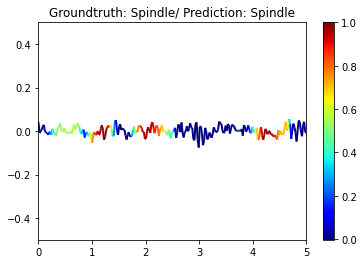

1/1 [==============================] - 0s 28ms/step

28


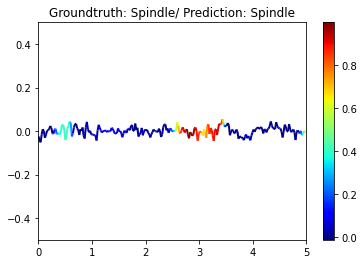

1/1 [==============================] - 0s 21ms/step

33


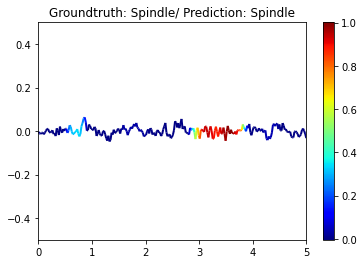

1/1 [==============================] - 0s 26ms/step

39


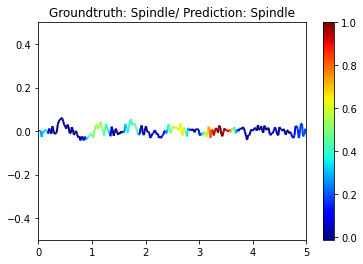

1/1 [==============================] - 0s 23ms/step

79


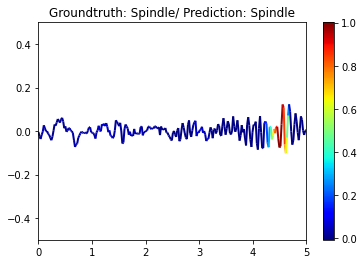

1/1 [==============================] - 0s 27ms/step

163


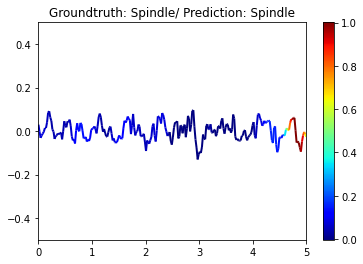

In [ ]:
# 1d-cnn grad-cam for campare
from tensorflow.keras import models
import tensorflow.keras.backend as K
import cv2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm

last_conv_layer = model.get_layer(index=9)
heatmap_model = models.Model([model.input], [last_conv_layer.output, model.output])

misclassify_count = 0
correct_record = np.zeros((300,), dtype=int)

for index, i in enumerate(one_D_can_but_two_D_cant):
  preds = model.predict(check_data[i:i+1,:])
  pred_class = np.argmax(preds)
  with tf.GradientTape() as gtape:
    conv_output, Predictions = heatmap_model(check_data[i:i+1,:])
    prob = Predictions[:, np.argmax(Predictions[0])]
    grads = gtape.gradient(prob, conv_output)
    pooled_grads = K.mean(grads, axis=(0,1)) 
  

  heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
  heatmap = np.maximum(heatmap,0)
  max_heat = np.max(heatmap)
  if max_heat == 0:
    max_heat = 1e-10
  heatmap /= max_heat


  data_points_per_epoch = 250
  sec_per_epoch = 5


  heatmap1 = cv2.resize(heatmap,(data_points_per_epoch,1), interpolation=cv2.INTER_CUBIC)
  # print(heatmap1.shape)
  heatmap_weight = heatmap1[0]
  # print(heatmap_weight.shape)


  time = np.linspace(0, sec_per_epoch, data_points_per_epoch)
  EEG = check_data[i,:]#SELECT DATA
  EEG_points = np.array([time, EEG]).T.reshape(-1, 1, 2)
  EEG_segments = np.concatenate([EEG_points[:-1], EEG_points[1:]], axis=1)

  # fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

  # # Create a continuous norm to map from data points to colors
  # norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
  # EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
  # # Set the values used for colormapping
  # EEG_lc.set_array(heatmap_weight)
  # EEG_lc.set_linewidth(2)
  # EEG_line = axs.add_collection(EEG_lc)
  # fig.colorbar(EEG_line, ax=axs)

  # axs.set_xlim(time.min(), time.max())
  # axs.set_ylim(-0.5, 0.5)

  fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

  # Create a continuous norm to map from data points to colors
  norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
  EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
  # Set the values used for colormapping
  EEG_lc.set_array(heatmap_weight)
  EEG_lc.set_linewidth(2)
  EEG_line = axs.add_collection(EEG_lc)
  fig.colorbar(EEG_line, ax=axs)

  axs.set_xlim(time.min(), time.max())
    
  axs.set_ylim(-0.5, 0.5)
  plt.title('Groundtruth: Spindle/ Prediction: Spindle')
  print(i)

  plt.show()

In [ ]:
neither_can = [22,70,71,106,107]

1/1 [==============================] - 0s 24ms/step

22


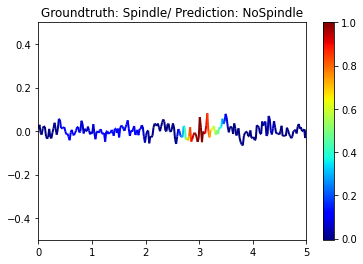

1/1 [==============================] - 0s 25ms/step

70


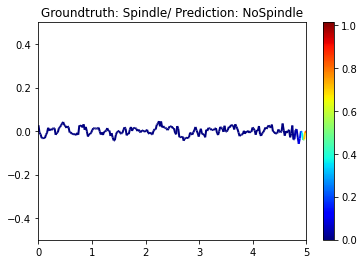

1/1 [==============================] - 0s 26ms/step

71


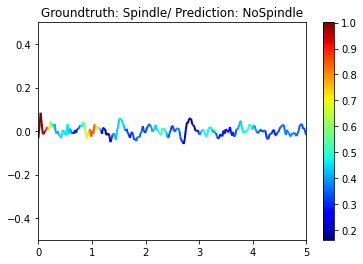

1/1 [==============================] - 0s 28ms/step

106


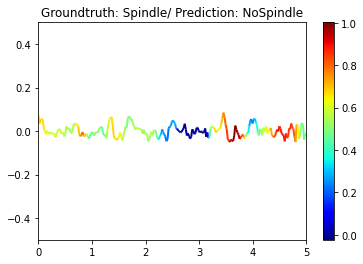

1/1 [==============================] - 0s 25ms/step

107


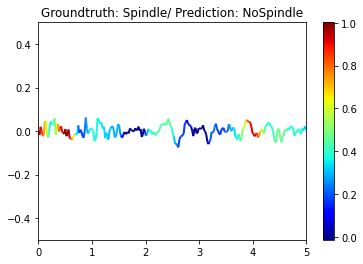

In [ ]:
# 1d-cnn grad-cam for campare
from tensorflow.keras import models
import tensorflow.keras.backend as K
import cv2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm

last_conv_layer = model.get_layer(index=9)
heatmap_model = models.Model([model.input], [last_conv_layer.output, model.output])

misclassify_count = 0
correct_record = np.zeros((300,), dtype=int)

for index, i in enumerate(neither_can):
  preds = model.predict(check_data[i:i+1,:])
  pred_class = np.argmax(preds)
  with tf.GradientTape() as gtape:
    conv_output, Predictions = heatmap_model(check_data[i:i+1,:])
    prob = Predictions[:, np.argmax(Predictions[0])]
    grads = gtape.gradient(prob, conv_output)
    pooled_grads = K.mean(grads, axis=(0,1)) 
  

  heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
  heatmap = np.maximum(heatmap,0)
  max_heat = np.max(heatmap)
  if max_heat == 0:
    max_heat = 1e-10
  heatmap /= max_heat


  data_points_per_epoch = 250
  sec_per_epoch = 5


  heatmap1 = cv2.resize(heatmap,(data_points_per_epoch,1), interpolation=cv2.INTER_CUBIC)
  # print(heatmap1.shape)
  heatmap_weight = heatmap1[0]
  # print(heatmap_weight.shape)


  time = np.linspace(0, sec_per_epoch, data_points_per_epoch)
  EEG = check_data[i,:]#SELECT DATA
  EEG_points = np.array([time, EEG]).T.reshape(-1, 1, 2)
  EEG_segments = np.concatenate([EEG_points[:-1], EEG_points[1:]], axis=1)

  # fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

  # # Create a continuous norm to map from data points to colors
  # norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
  # EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
  # # Set the values used for colormapping
  # EEG_lc.set_array(heatmap_weight)
  # EEG_lc.set_linewidth(2)
  # EEG_line = axs.add_collection(EEG_lc)
  # fig.colorbar(EEG_line, ax=axs)

  # axs.set_xlim(time.min(), time.max())
  # axs.set_ylim(-0.5, 0.5)

  fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)

  # Create a continuous norm to map from data points to colors
  norm = plt.Normalize(heatmap_weight.min(), heatmap_weight.max())
  EEG_lc = LineCollection(EEG_segments, cmap='jet', norm=norm)
  # Set the values used for colormapping
  EEG_lc.set_array(heatmap_weight)
  EEG_lc.set_linewidth(2)
  EEG_line = axs.add_collection(EEG_lc)
  fig.colorbar(EEG_line, ax=axs)

  axs.set_xlim(time.min(), time.max())
  axs.set_ylim(-0.5, 0.5)
  plt.title('Groundtruth: Spindle/ Prediction: NoSpindle')
  print(i)

  plt.show()